In [1]:
import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

import warnings
warnings.filterwarnings('ignore')

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
import geopandas as gpd
import seaborn as sns
from scipy import stats

import statsmodels.api as sm
pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', lambda x: '%.4f' % x)

In [3]:
from pysal.explore import esda
from pysal.lib import weights
from numpy.random import seed

from statsmodels.stats.outliers_influence import variance_inflation_factor

In [4]:
from esda.moran import Moran
from libpysal.weights import Queen, KNN

In [5]:
from pysal.model import spreg

In [6]:
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
from scipy import stats
from sklearn.preprocessing import robust_scale
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

In [7]:
from mgwr.gwr import GWR, MGWR
from mgwr.sel_bw import Sel_BW
from spglm.family import Gaussian

In [8]:
import folium

In [9]:
from IPython.display import display_html    # To display DataFrames side-by-side
import json                                 # For plotting geometries with Plotly
import plotly.express as px                 # For interactive plotting
import tobler                               # For the areal interpolation functions
from shapely.geometry import Point          # For the point geometry class

In [10]:
import rasterio
from rasterio.plot import show
from rasterio.mask import mask
from shapely.geometry import box
from fiona.crs import from_epsg
from osgeo import gdal


# <font color='#ffc000'>Import the Crosswalk file(2020tracts-2010tracts)</font>

> This crosswalk file presents how dose change of geoboundaries between 2020 with 2010

In [11]:
crosswalk_2020_2010 = pd.read_csv('https://www2.census.gov/geo/docs/maps-data/data/rel2020/tract/tab20_tract20_tract10_natl.txt', sep='|' , dtype=str)
# crosswalk_2020_2010 = crosswalk_2020_2010[['GEOID_TRACT_20','NAMELSAD_TRACT_20','GEOID_TRACT_10','NAMELSAD_TRACT_10']]
crosswalk_2020_2010.head(5)

,OID_TRACT_20,GEOID_TRACT_20,NAMELSAD_TRACT_20,AREALAND_TRACT_20,AREAWATER_TRACT_20,MTFCC_TRACT_20,FUNCSTAT_TRACT_20,OID_TRACT_10,GEOID_TRACT_10,NAMELSAD_TRACT_10,AREALAND_TRACT_10,AREAWATER_TRACT_10,MTFCC_TRACT_10,FUNCSTAT_TRACT_10,AREALAND_PART,AREAWATER_PART
0,20790540092527,01001020100,Census Tract 201,9825304,28435,G5020,S,20740540092527,01001020100,Census Tract 201,9827271,28435,G5020,S,9820448,28435
1,20790540092527,01001020100,Census Tract 201,9825304,28435,G5020,S,20740540092534,01001020200,Census Tract 202,3325674,5669,G5020,S,4856,0
2,20790540092534,01001020200,Census Tract 202,3320818,5669,G5020,S,20740540092534,01001020200,Census Tract 202,3325674,5669,G5020,S,3320818,5669
3,20790540092528,01001020300,Census Tract 203,5349271,9054,G5020,S,20740540092528,01001020300,Census Tract 203,5349271,9054,G5020,S,5349271,9054
4,20790540092529,01001020400,Census Tract 204,6384282,8408,G5020,S,20740540092529,01001020400,Census Tract 204,6384282,8408,G5020,S,6384282,8408


In [12]:
# set(wfh_2019['NAME'].values).issubset(set(crosswalk_2020_2010['NAMELSAD_TRACT_10'].values))
# wfh_2019[~wfh_2019['NAME'].isin(crosswalk_2020_2010['NAMELSAD_TRACT_10'])]

# <font color='#ffc000'>Import the Tracts Geometry in 2021 and 2019 <br>Filter out Tracts in top 20 CSA by population rank</font>


>Most of U.S.State areas are rurals with larger tract shape, but in this research, I only focus on those tracts in top 20 Combined statitic areas(CSAs), which has similar size of geometry.

### 2021 Tiger line

In [13]:
tracts_us_2021 = pd.DataFrame()
for i in range(80):
    state = str(i).zfill(2)
    try:
        url = 'https://www2.census.gov/geo/tiger/TIGER2021/TRACT/tl_2021_'+state+'_tract.zip'
        tracts = gpd.read_file(url)
        tracts_us_2021 = pd.concat([tracts_us_2021, tracts])
    except:
        continue

tracts_us_2021 = tracts_us_2021.rename(columns={'GEOID':'GEO_ID'})
tracts_us_2021['county_prefix'] = tracts_us_2021['GEO_ID'].str[:5]
tracts_us_2021.head()

,STATEFP,COUNTYFP,TRACTCE,GEO_ID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,county_prefix
0,01,079,979201,01079979201,9792.01,Census Tract 9792.01,G5020,S,173543715,33343864,+34.7177132,-087.3401349,"POLYGON ((-87.43611 34.72743, -87.43610 34.727...",01079
1,01,079,979202,01079979202,9792.02,Census Tract 9792.02,G5020,S,132640589,788347,+34.6396492,-087.3633477,"POLYGON ((-87.45696 34.61352, -87.45693 34.613...",01079
2,01,079,979502,01079979502,9795.02,Census Tract 9795.02,G5020,S,75015361,645300,+34.5569960,-087.2404514,"POLYGON ((-87.29614 34.54337, -87.29610 34.543...",01079
3,01,079,979501,01079979501,9795.01,Census Tract 9795.01,G5020,S,42596424,343043,+34.5828012,-087.1533184,"POLYGON ((-87.20741 34.55710, -87.20740 34.557...",01079
4,01,009,050103,01009050103,501.03,Census Tract 501.03,G5020,S,101604725,5974506,+33.8656656,-086.5073198,"POLYGON ((-86.57229 33.82070, -86.57229 33.820...",01009


In [14]:
tracts_us_2021.shape

(85528, 14)

### 2019 Tiger line

In [15]:
### 2010 California Census Tracts
tracts_us_2019 = pd.DataFrame()
for i in range(80):
    state = str(i).zfill(2)
    try:
        url = 'https://www2.census.gov/geo/tiger/TIGER2010/TRACT/2010/tl_2010_'+state+'_tract10.zip'
        tracts = gpd.read_file(url)
        tracts_us_2019 = pd.concat([tracts_us_2019, tracts])
    except:
        continue

tracts_us_2019 = tracts_us_2019.rename(columns={'GEOID10':'GEO_ID'})
tracts_us_2019['county_prefix'] = tracts_us_2019['GEO_ID'].str[:5]
tracts_us_2019.head()

,STATEFP10,COUNTYFP10,TRACTCE10,GEO_ID,NAME10,NAMELSAD10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,geometry,county_prefix
0,01,005,950300,01005950300,9503,Census Tract 9503,G5020,S,352811329,499970,+31.7908933,-085.5670514,"POLYGON ((-85.52744 31.86650, -85.52753 31.866...",01005
1,01,005,950900,01005950900,9509,Census Tract 9509,G5020,S,16201446,8339342,+31.8467221,-085.1462332,"POLYGON ((-85.16412 31.83059, -85.16419 31.830...",01005
2,01,005,950800,01005950800,9508,Census Tract 9508,G5020,S,14630162,380622,+31.9206930,-085.1760317,"POLYGON ((-85.14872 31.90933, -85.14663 31.908...",01005
3,01,005,950700,01005950700,9507,Census Tract 9507,G5020,S,127200997,112809,+31.9440855,-085.2620842,"POLYGON ((-85.14578 31.89149, -85.14578 31.891...",01005
4,01,005,950600,01005950600,9506,Census Tract 9506,G5020,S,101697268,1101261,+31.8783526,-085.2729215,"POLYGON ((-85.14572 31.89011, -85.14572 31.889...",01005


In [16]:
tracts_us_2019.shape

(74134, 14)

### Historical Delineation File Combined statistical areas(CSAs)

>In this step, I dowmnload the data [Historical Delineation Files](https://www.census.gov/geographies/reference-files/time-series/demo/metro-micro/historical-delineation-files.html) from Census Bureau and make up some dummies to identify CSA location attribute(Central County/Outlying County, Metro/Micro), and I made up the county_fips for merging into gemortry boundary

In [17]:
# Create Dummy Variable for more CBSA details: Central/Outlying County
CSA = pd.read_excel('list1_2020.xls',dtype=object)
CSA = CSA[['State Name','CSA Title','FIPS State Code','FIPS County Code','Central/Outlying County','Metropolitan/Micropolitan Statistical Area']]
CSA['county_fips'] = CSA['FIPS State Code'] + CSA['FIPS County Code']
CSA = CSA[CSA['CSA Title'].notnull()]

# Get Central/Outlying dummy variables
dummies = pd.get_dummies(CSA['Central/Outlying County'])
CSA = pd.concat([CSA, dummies], axis=1).reset_index(drop=True)
CSA = CSA.drop(columns=['Central/Outlying County'])
CSA['Central'] = CSA['Central'].astype(int)
CSA['Outlying'] = CSA['Outlying'].astype(int)

## Get Metro/Micro dummy variables
dummies = pd.get_dummies(CSA['Metropolitan/Micropolitan Statistical Area'])
CSA = pd.concat([CSA, dummies], axis=1).reset_index(drop=True)
CSA = CSA.drop(columns=['Metropolitan/Micropolitan Statistical Area'])
CSA = CSA.rename(columns={'Metropolitan Statistical Area':'Metro','Micropolitan Statistical Area':'Micro'})
CSA['Metro'] = CSA['Metro'].astype(int)
CSA['Micro'] = CSA['Micro'].astype(int)

CSA

,State Name,CSA Title,FIPS State Code,FIPS County Code,county_fips,Central,Outlying,Metro,Micro
0,Michigan,"Detroit-Warren-Ann Arbor, MI",26,091,26091,1,0,0,1
1,Ohio,"Cleveland-Akron-Canton, OH",39,133,39133,1,0,1,0
2,Ohio,"Cleveland-Akron-Canton, OH",39,153,39153,1,0,1,0
3,Oregon,"Portland-Vancouver-Salem, OR-WA",41,043,41043,1,0,1,0
4,New York,"Albany-Schenectady, NY",36,001,36001,1,0,1,0
...,...,...,...,...,...,...,...,...,...
1251,Ohio,"Youngstown-Warren, OH-PA",39,155,39155,1,0,1,0
1252,Pennsylvania,"Youngstown-Warren, OH-PA",42,085,42085,1,0,1,0
1253,California,"Sacramento-Roseville, CA",06,101,06101,1,0,1,0
1254,California,"Sacramento-Roseville, CA",06,115,06115,1,0,1,0


### Import 2020 CSA's Population Rank

> I fecth population rank table by Wiki API and return a list contain "csa title" of top 20 csa by population rank

In [18]:
html = 'https://en.wikipedia.org/wiki/Combined_statistical_area'
csa_pop_rank = pd.read_html(html)[1]
top_20_names = csa_pop_rank.iloc[:, 1].str.replace(' CSA', '').head(20)
top_20_names_list = top_20_names.tolist()
top_20_names_list = [name.replace('–', '-') for name in top_20_names_list]
top_20_names_list

['New York-Newark, NY-NJ-CT-PA',
 'Los Angeles-Long Beach, CA',
 'Washington-Baltimore-Arlington, DC-MD-VA-WV-PA',
 'Chicago-Naperville, IL-IN-WI',
 'San Jose-San Francisco-Oakland, CA',
 'Dallas-Fort Worth, TX-OK',
 'Boston-Worcester-Providence, MA-RI-NH',
 'Houston-Pasadena, TX',
 'Philadelphia-Reading-Camden, PA-NJ-DE-MD',
 'Atlanta-Athens-Clarke County-Sandy Springs, GA-AL',
 'Miami-Port St. Lucie-Fort Lauderdale, FL',
 'Detroit-Warren-Ann Arbor, MI',
 'Phoenix-Mesa, AZ',
 'Seattle-Tacoma, WA',
 'Orlando-Lakeland-Deltona, FL',
 'Minneapolis-St. Paul, MN-WI',
 'Cleveland-Akron-Canton, OH',
 'Denver-Aurora-Greeley, CO',
 'Charlotte-Concord, NC-SC',
 'Portland-Vancouver-Salem, OR-WA']

In [19]:
top_5_names_list = ['New York-Newark, NY-NJ-CT-PA', 'Los Angeles-Long Beach, CA', 'Washington-Baltimore-Arlington, DC-MD-VA-WV-PA', 'Chicago-Naperville, IL-IN-WI', 'San Jose-San Francisco-Oakland, CA']

### 2021

In [20]:
tracts_us_2021 = tracts_us_2021.merge(CSA[['county_fips','FIPS State Code','FIPS County Code','State Name','CSA Title','Central','Outlying','Metro','Micro']],
                                        left_on='county_prefix',right_on='county_fips',how='left').drop(columns=['county_fips','county_prefix']).reset_index(drop=True)

tracts_us_2021.to_crs(epsg=5070, inplace=True)
tracts_top5_csa_2021 = tracts_us_2021[tracts_us_2021['CSA Title'].isin(top_5_names_list)].reset_index(drop=True)

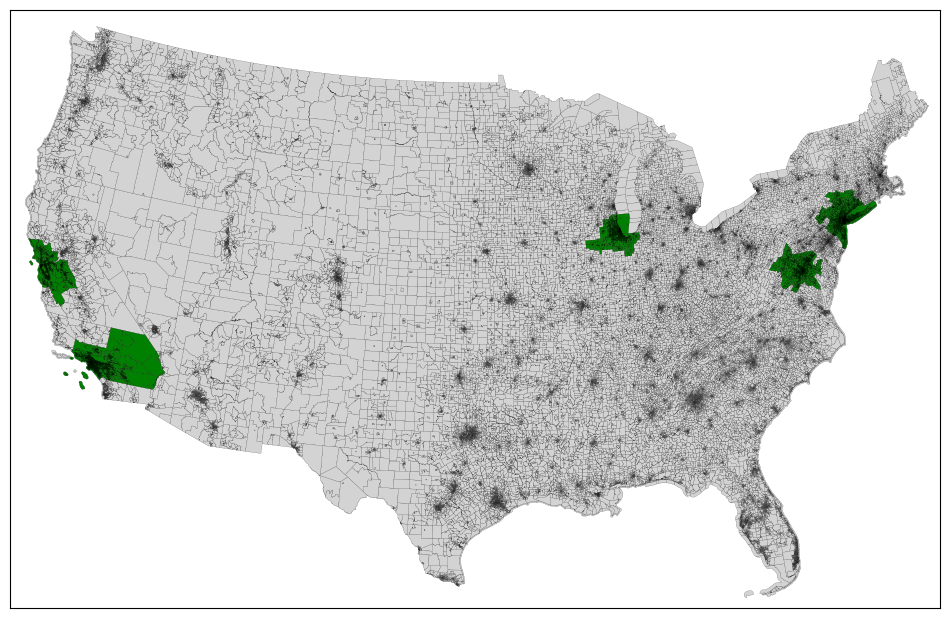

In [21]:
fig, ax = plt.subplots(figsize=(12, 8))

tracts_us_2021.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.1)
tracts_top5_csa_2021.plot(ax=ax, color='green', edgecolor='black', linewidth=0.1)

ax.set_xticklabels([])
ax.set_yticklabels([])

ax.set_xlim([-2438850.7854507873, 2321060.1946121375])
ax.set_ylim([200673.6913684683, 3263319.133820226])

ax.set_xticks([])
ax.set_yticks([])

plt.show()

### 2019

In [22]:
tracts_us_2019 = tracts_us_2019.merge(CSA[['county_fips','FIPS State Code','FIPS County Code','State Name','CSA Title','Central','Outlying','Metro','Micro']],
                                        left_on='county_prefix',right_on='county_fips',how='left').drop(columns=['county_fips','county_prefix']).reset_index(drop=True)
tracts_us_2019.to_crs(epsg=5070, inplace=True)
tracts_top5_csa_2019 = tracts_us_2019[tracts_us_2019['CSA Title'].isin(top_5_names_list)].reset_index(drop=True)

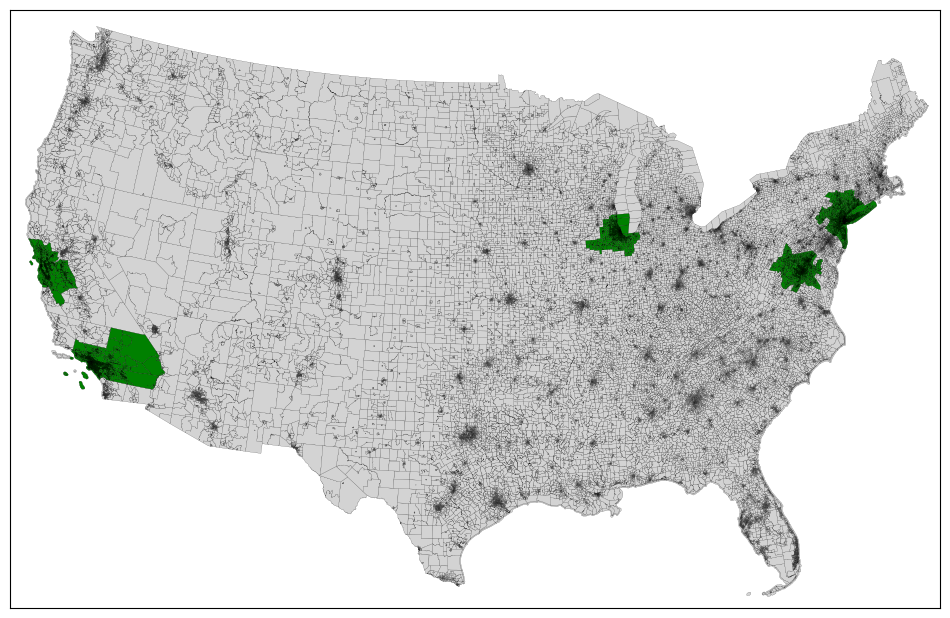

In [23]:
fig, ax = plt.subplots(figsize=(12, 8))

tracts_us_2019.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.1)
tracts_top5_csa_2019.plot(ax=ax, color='green', edgecolor='black', linewidth=0.1)

ax.set_xticklabels([])
ax.set_yticklabels([])

ax.set_xlim([-2438850.7854507873, 2321060.1946121375])
ax.set_ylim([200673.6913684683, 3263319.133820226])

ax.set_xticks([])
ax.set_yticks([])

plt.show()

In [24]:
tracts_top5_csa_2021.shape

(17088, 21)

# <font color='#ffc000'>Import Datasets(at tracts level)</font>

## 01.WFH Industry Dataset-[B08126 Table](https://data.census.gov/table?q=B08126)

> This dataset provides a detailed distribution of population employment across various industries, with a particular breakdown on teleworkers.

### 2021

In [25]:
wfh_2021 = pd.read_csv('2021/B08126/ACSDT5Y2021.B08126-Data.csv')
wfh_2021 = wfh_2021[['GEO_ID','NAME','B08126_001E','B08126_091E',
                     'B08126_005E','B08126_006E','B08126_007E','B08126_008E','B08126_009E','B08126_010E','B08126_011E','B08126_012E','B08126_014E','B08126_013E',
                     'B08126_095E','B08126_096E','B08126_097E','B08126_098E','B08126_099E','B08126_100E','B08126_101E','B08126_102E','B08126_104E','B08126_103E']]
wfh_2021 = wfh_2021.drop(wfh_2021.index[0]).reset_index(drop=True)

wfh_2021 = wfh_2021.rename(columns={'B08126_001E':'total_ind','B08126_091E':'total_wfh',
                                    'B08126_005E':'wholesale','B08126_006E':'retail','B08126_007E':'trans_utili','B08126_008E':'info','B08126_009E':'fin_estate','B08126_010E':'pro_tech_mana','B08126_011E':'edu_health_assist','B08126_012E':'entain','B08126_014E':'public_ser','B08126_013E':'other_ser',
                                    'B08126_095E':'wholesale_wfh','B08126_096E':'retail_wfh','B08126_097E':'trans_utili_wfh','B08126_098E':'info_wfh','B08126_099E':'fin_estate_wfh','B08126_100E':'pro_tech_mana_wfh','B08126_101E':'edu_health_assist_wfh','B08126_102E':'entain_wfh','B08126_104E':'public_ser_wfh','B08126_103E':'other_ser_wfh'})
wfh_2021 = wfh_2021[~wfh_2021.apply(lambda x: x.str.contains('-')).any(axis=1)]

# Convert columns from the second column onwards to float
for col in wfh_2021.columns[2:]:
    wfh_2021[col] = pd.to_numeric(wfh_2021[col], errors='coerce')

wfh_2021['NAME'] = wfh_2021['NAME'].apply(lambda x: x.split(',')[0])
wfh_2021['GEO_ID'] = wfh_2021['GEO_ID'].str[-11:]
# wfh_2021.fillna(0, inplace=True)

wfh_2021 = wfh_2021[['GEO_ID','NAME',
                     'total_ind','wholesale','retail','trans_utili','info','fin_estate','pro_tech_mana','edu_health_assist','entain','public_ser','other_ser',
                     'total_wfh','wholesale_wfh','retail_wfh','trans_utili_wfh','info_wfh','fin_estate_wfh','pro_tech_mana_wfh','edu_health_assist_wfh','entain_wfh','public_ser_wfh','other_ser_wfh']]

wfh_2021_geo = tracts_top5_csa_2021[['GEO_ID','geometry']].merge(wfh_2021, left_on='GEO_ID', right_on='GEO_ID', how='inner')
wfh_2021_geo.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 17088 entries, 0 to 17087
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   GEO_ID                 17088 non-null  object  
 1   geometry               17088 non-null  geometry
 2   NAME                   17088 non-null  object  
 3   total_ind              17088 non-null  int64   
 4   wholesale              17088 non-null  int64   
 5   retail                 17088 non-null  int64   
 6   trans_utili            17088 non-null  int64   
 7   info                   17088 non-null  int64   
 8   fin_estate             17088 non-null  int64   
 9   pro_tech_mana          17088 non-null  int64   
 10  edu_health_assist      17088 non-null  int64   
 11  entain                 17088 non-null  int64   
 12  public_ser             17088 non-null  int64   
 13  other_ser              17088 non-null  int64   
 14  total_wfh              17088 n

### 2019

In [26]:
wfh_2019 = pd.read_csv('2021/B08126/ACSDT5Y2019.B08126-Data.csv')
wfh_2019 = wfh_2019[['GEO_ID','NAME','B08126_001E','B08126_091E',
                     'B08126_005E','B08126_006E','B08126_007E','B08126_008E','B08126_009E','B08126_010E','B08126_011E','B08126_012E','B08126_014E','B08126_013E',
                     'B08126_095E','B08126_096E','B08126_097E','B08126_098E','B08126_099E','B08126_100E','B08126_101E','B08126_102E','B08126_104E','B08126_103E']]
wfh_2019 = wfh_2019.drop(wfh_2019.index[0]).reset_index(drop=True)

wfh_2019 = wfh_2019.rename(columns={'B08126_001E':'total_ind','B08126_091E':'total_wfh',
                                    'B08126_005E':'wholesale','B08126_006E':'retail','B08126_007E':'trans_utili','B08126_008E':'info','B08126_009E':'fin_estate','B08126_010E':'pro_tech_mana','B08126_011E':'edu_health_assist','B08126_012E':'entain','B08126_014E':'public_ser','B08126_013E':'other_ser',
                                    'B08126_095E':'wholesale_wfh','B08126_096E':'retail_wfh','B08126_097E':'trans_utili_wfh','B08126_098E':'info_wfh','B08126_099E':'fin_estate_wfh','B08126_100E':'pro_tech_mana_wfh','B08126_101E':'edu_health_assist_wfh','B08126_102E':'entain_wfh','B08126_104E':'public_ser_wfh','B08126_103E':'other_ser_wfh'})
wfh_2019 = wfh_2019[~wfh_2019.apply(lambda x: x.str.contains('-')).any(axis=1)]

# Convert columns from the second column onwards to float
for col in wfh_2019.columns[2:]:
    wfh_2019[col] = pd.to_numeric(wfh_2019[col], errors='coerce')

wfh_2019['NAME'] = wfh_2019['NAME'].apply(lambda x: x.split(',')[0])
wfh_2019['GEO_ID'] = wfh_2019['GEO_ID'].str[-11:]
# wfh_2019.fillna(0, inplace=True)

wfh_2019 = wfh_2019[['GEO_ID','NAME',
                     'total_ind','wholesale','retail','trans_utili','info','fin_estate','pro_tech_mana','edu_health_assist','entain','public_ser','other_ser',
                     'total_wfh','wholesale_wfh','retail_wfh','trans_utili_wfh','info_wfh','fin_estate_wfh','pro_tech_mana_wfh','edu_health_assist_wfh','entain_wfh','public_ser_wfh','other_ser_wfh']]

wfh_2019_geo = tracts_top5_csa_2019[['GEO_ID','geometry']].merge(wfh_2019, left_on='GEO_ID', right_on='GEO_ID', how='inner')
wfh_2019_geo.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 15654 entries, 0 to 15653
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   GEO_ID                 15654 non-null  object  
 1   geometry               15654 non-null  geometry
 2   NAME                   15654 non-null  object  
 3   total_ind              15654 non-null  int64   
 4   wholesale              15654 non-null  int64   
 5   retail                 15654 non-null  int64   
 6   trans_utili            15654 non-null  int64   
 7   info                   15654 non-null  int64   
 8   fin_estate             15654 non-null  int64   
 9   pro_tech_mana          15654 non-null  int64   
 10  edu_health_assist      15654 non-null  int64   
 11  entain                 15654 non-null  int64   
 12  public_ser             15654 non-null  int64   
 13  other_ser              15654 non-null  int64   
 14  total_wfh              15654 n

In [27]:
# 2019_est
# Calculate the transfer ratio
wfh_2019_geo['total_transwfh_ra'] = wfh_2019_geo['total_wfh'] / wfh_2019_geo['total_ind']
wfh_2019_geo['wholesale_transwfh_ra'] = wfh_2019_geo['wholesale_wfh'] / wfh_2019_geo['wholesale']
wfh_2019_geo['retail_transwfh_ra'] = wfh_2019_geo['retail_wfh'] / wfh_2019_geo['retail']
wfh_2019_geo['trans_utili_transwfh_ra'] = wfh_2019_geo['trans_utili_wfh'] / wfh_2019_geo['trans_utili']
wfh_2019_geo['info_transwfh_ra'] = wfh_2019_geo['info_wfh'] / wfh_2019_geo['info']
wfh_2019_geo['fin_estate_transwfh_ra'] = wfh_2019_geo['fin_estate_wfh'] / wfh_2019_geo['fin_estate']
wfh_2019_geo['pro_tech_mana_transwfh_ra'] = wfh_2019_geo['pro_tech_mana_wfh'] / wfh_2019_geo['pro_tech_mana']
wfh_2019_geo['edu_health_assist_transwfh_ra'] = wfh_2019_geo['edu_health_assist_wfh'] / wfh_2019_geo['edu_health_assist']
wfh_2019_geo['entain_transwfh_ra'] = wfh_2019_geo['entain_wfh'] / wfh_2019_geo['entain']
wfh_2019_geo['public_ser_transwfh_ra'] = wfh_2019_geo['public_ser_wfh'] / wfh_2019_geo['public_ser']
wfh_2019_geo['other_ser_transwfh_ra'] = wfh_2019_geo['other_ser_wfh'] / wfh_2019_geo['other_ser']

# Calculate the remote ratio
wfh_2019_geo['wholesale_wfh_ra'] = wfh_2019_geo['wholesale_wfh'] / wfh_2019_geo['total_wfh']
wfh_2019_geo['retail_wfh_ra'] = wfh_2019_geo['retail_wfh'] / wfh_2019_geo['total_wfh']
wfh_2019_geo['trans_utili_wfh_ra'] = wfh_2019_geo['trans_utili_wfh'] / wfh_2019_geo['total_wfh']
wfh_2019_geo['info_wfh_ra'] = wfh_2019_geo['info_wfh'] / wfh_2019_geo['total_wfh']
wfh_2019_geo['fin_estate_wfh_ra'] = wfh_2019_geo['fin_estate_wfh'] / wfh_2019_geo['total_wfh']
wfh_2019_geo['pro_tech_mana_wfh_ra'] = wfh_2019_geo['pro_tech_mana_wfh'] / wfh_2019_geo['total_wfh']
wfh_2019_geo['edu_health_assist_wfh_ra'] = wfh_2019_geo['edu_health_assist_wfh'] / wfh_2019_geo['total_wfh']
wfh_2019_geo['entain_wfh_ra'] = wfh_2019_geo['entain_wfh'] / wfh_2019_geo['total_wfh']
wfh_2019_geo['public_ser_wfh_ra'] = wfh_2019_geo['public_ser_wfh'] / wfh_2019_geo['total_wfh']
wfh_2019_geo['other_ser_wfh_ra'] = wfh_2019_geo['other_ser_wfh'] / wfh_2019_geo['total_wfh']

wfh_2019_geo = wfh_2019_geo[['GEO_ID',
                             'total_transwfh_ra','wholesale_transwfh_ra','retail_transwfh_ra','trans_utili_transwfh_ra','info_transwfh_ra','fin_estate_transwfh_ra','pro_tech_mana_transwfh_ra','edu_health_assist_transwfh_ra','entain_transwfh_ra','public_ser_transwfh_ra','other_ser_transwfh_ra',
                             'wholesale_wfh_ra','retail_wfh_ra','trans_utili_wfh_ra','info_wfh_ra','fin_estate_wfh_ra','pro_tech_mana_wfh_ra','edu_health_assist_wfh_ra','entain_wfh_ra','public_ser_wfh_ra','other_ser_wfh_ra',
                             'geometry']]
wfh_2019_geo = wfh_2019_geo.fillna(0)

# 2021
# Calculate the transfer ratio
wfh_2021_geo['total_transwfh_ra'] = wfh_2021_geo['total_wfh'] / wfh_2021_geo['total_ind']
wfh_2021_geo['wholesale_transwfh_ra'] = wfh_2021_geo['wholesale_wfh'] / wfh_2021_geo['wholesale']
wfh_2021_geo['retail_transwfh_ra'] = wfh_2021_geo['retail_wfh'] / wfh_2021_geo['retail']
wfh_2021_geo['trans_utili_transwfh_ra'] = wfh_2021_geo['trans_utili'] / wfh_2021_geo['trans_utili']
wfh_2021_geo['info_transwfh_ra'] = wfh_2021_geo['info_wfh'] / wfh_2021_geo['info']
wfh_2021_geo['fin_estate_transwfh_ra'] = wfh_2021_geo['fin_estate_wfh'] / wfh_2021_geo['fin_estate']
wfh_2021_geo['pro_tech_mana_transwfh_ra'] = wfh_2021_geo['pro_tech_mana_wfh'] / wfh_2021_geo['pro_tech_mana']
wfh_2021_geo['edu_health_assist_transwfh_ra'] = wfh_2021_geo['edu_health_assist_wfh'] / wfh_2021_geo['edu_health_assist']
wfh_2021_geo['entain_transwfh_ra'] = wfh_2021_geo['entain_wfh'] / wfh_2021_geo['entain']
wfh_2021_geo['public_ser_transwfh_ra'] = wfh_2021_geo['public_ser_wfh'] / wfh_2021_geo['public_ser']
wfh_2021_geo['other_ser_transwfh_ra'] = wfh_2021_geo['other_ser_wfh'] / wfh_2021_geo['other_ser']

# Calculate the remote ratio
wfh_2021_geo['wholesale_wfh_ra'] = wfh_2021_geo['wholesale_wfh'] / wfh_2021_geo['total_wfh']
wfh_2021_geo['retail_wfh_ra'] = wfh_2021_geo['retail_wfh'] / wfh_2021_geo['total_wfh']
wfh_2021_geo['trans_utili_wfh_ra'] = wfh_2021_geo['trans_utili_wfh'] / wfh_2021_geo['total_wfh']
wfh_2021_geo['info_wfh_ra'] = wfh_2021_geo['info_wfh'] / wfh_2021_geo['total_wfh']
wfh_2021_geo['fin_estate_wfh_ra'] = wfh_2021_geo['fin_estate_wfh'] / wfh_2021_geo['total_wfh']
wfh_2021_geo['pro_tech_mana_wfh_ra'] = wfh_2021_geo['pro_tech_mana_wfh'] / wfh_2021_geo['total_wfh']
wfh_2021_geo['edu_health_assist_wfh_ra'] = wfh_2021_geo['edu_health_assist_wfh'] / wfh_2021_geo['total_wfh']
wfh_2021_geo['entain_wfh_ra'] = wfh_2021_geo['entain_wfh'] / wfh_2021_geo['total_wfh']
wfh_2021_geo['public_ser_wfh_ra'] = wfh_2021_geo['public_ser_wfh'] / wfh_2021_geo['total_wfh']
wfh_2021_geo['other_ser_wfh_ra'] = wfh_2021_geo['other_ser_wfh'] / wfh_2021_geo['total_wfh']

wfh_2021_geo = wfh_2021_geo[['GEO_ID',
                             'total_transwfh_ra','wholesale_transwfh_ra','retail_transwfh_ra','trans_utili_transwfh_ra','info_transwfh_ra','fin_estate_transwfh_ra','pro_tech_mana_transwfh_ra','edu_health_assist_transwfh_ra','entain_transwfh_ra','public_ser_transwfh_ra','other_ser_transwfh_ra',
                             'wholesale_wfh_ra','retail_wfh_ra','trans_utili_wfh_ra','info_wfh_ra','fin_estate_wfh_ra','pro_tech_mana_wfh_ra','edu_health_assist_wfh_ra','entain_wfh_ra','public_ser_wfh_ra','other_ser_wfh_ra',
                             'geometry']]
wfh_2021_geo = wfh_2021_geo.fillna(0)

In [28]:
df1 = wfh_2019_geo.drop(columns='geometry')
df2 = wfh_2021_geo.drop(columns='geometry')

# Style the DataFrames and include captions with the number of rows
style = "style='display:inline; padding:10px'"

# Apply style to the head of the DataFrames
wfh_2019_styled_head = df1.head().style.set_table_attributes(style).set_caption(f'2019 Census Tracts, {len(df1)} rows')
wfh_2021_styled_head = df2.head().style.set_table_attributes(style).set_caption(f'2021 Census Tracts, {len(df2)} rows')

# Display the heads of the styled DataFrames
display_html(wfh_2019_styled_head._repr_html_() + wfh_2021_styled_head._repr_html_(), raw=True)

,GEO_ID,total_transwfh_ra,wholesale_transwfh_ra,retail_transwfh_ra,trans_utili_transwfh_ra,info_transwfh_ra,fin_estate_transwfh_ra,pro_tech_mana_transwfh_ra,edu_health_assist_transwfh_ra,entain_transwfh_ra,public_ser_transwfh_ra,other_ser_transwfh_ra,wholesale_wfh_ra,retail_wfh_ra,trans_utili_wfh_ra,info_wfh_ra,fin_estate_wfh_ra,pro_tech_mana_wfh_ra,edu_health_assist_wfh_ra,entain_wfh_ra,public_ser_wfh_ra,other_ser_wfh_ra
0,06059062640,0.072550,0.000000,0.047297,0.000000,0.238532,0.064615,0.130536,0.061662,0.069444,0.000000,0.000000,0.000000,0.081871,0.000000,0.152047,0.122807,0.327485,0.134503,0.116959,0.000000,0.000000
1,06059062641,0.056406,0.000000,0.000000,0.000000,0.432099,0.025707,0.115702,0.000000,0.000000,0.163793,0.000000,0.000000,0.000000,0.000000,0.250000,0.071429,0.300000,0.000000,0.000000,0.135714,0.000000
2,06059062642,0.182735,0.000000,0.555556,0.000000,1.000000,0.178571,0.245902,0.168103,0.000000,0.000000,0.000000,0.000000,0.276074,0.000000,0.055215,0.184049,0.184049,0.239264,0.000000,0.000000,0.000000
3,06059062643,0.109045,0.000000,0.309091,0.000000,1.000000,0.077236,0.192045,0.046089,0.000000,0.128440,0.320755,0.000000,0.098266,0.000000,0.080925,0.109827,0.488439,0.095376,0.000000,0.040462,0.049133
4,06059062644,0.089492,0.000000,0.154158,0.000000,0.000000,0.000000,0.081115,0.085079,0.230769,0.357143,0.238636,0.000000,0.228228,0.000000,0.000000,0.000000,0.192192,0.195195,0.171171,0.060060,0.063063
,GEO_ID,total_transwfh_ra,wholesale_transwfh_ra,retail_transwfh_ra,trans_utili_transwfh_ra,info_transwfh_ra,fin_estate_transwfh_ra,pro_tech_mana_transwfh_ra,edu_health_assist_transwfh_ra,entain_transwfh_ra,public_ser_transwfh_ra,other_ser_transwfh_ra,wholesale_wfh_ra,retail_wfh_ra,trans_utili_wfh_ra,info_wfh_ra,fin_estate_wfh_ra,pro_tech_mana_wfh_ra,edu_health_assist_wfh_ra,entain_wfh_ra,public_ser_wfh_ra,other_ser_wfh_ra
0,06085504321,0.089646,0.000000,0.093633,1.000000,0.176923,0.100000,0.092308,0.112701,0.000000,0.500000,0.107438,0.000000,0.092251,0.118081,0.084871,0.022140,0.177122,0.232472,0.000000,0.140221,0.047970
1,06085504410,0.118559,0.000000,0.096886,1.000000,0.131148,0.493151,0.214559,0.071429,0.000000,0.131034,0.000000,0.000000,0.098940,0.000000,0.028269,0.254417,0.197880,0.137809,0.000000,0.067138,0.000000
2,06085507003,0.275329,0.631579,0.000000,1.000000,0.490909,0.000000,0.370079,0.334884,0.138298,0.000000,0.000000,0.067416,0.000000,0.073034,0.151685,0.000000,0.264045,0.202247,0.036517,0.000000,0.000000
3,06085507004,0.121453,0.316176,0.000000,0.000000,0.194175,0.215054,0.265795,0.038462,0.000000,0.000000,0.000000,0.200935,0.000000,0.000000,0.093458,0.093458,0.570093,0.042056,0.000000,0.000000,0.000000


## 02.WFH Racial Data-[B08105A-E Table](https://data.census.gov/table?q=B08105)

> In this part, I fetch racial characters' data, and calculated racial telework rate for each race, with "the number each racial teleworkers" / "total teleworks" at tract level. 

### 2021

In [29]:
# white
df1 = pd.read_csv('2021/B08105A/ACSDT5Y2021.B08105A-Data.csv')
df1 = df1.drop(df1.index[0]).reset_index(drop=True)
df1 = df1[['GEO_ID','B08105A_007E']]
df1 = df1[~df1.apply(lambda x: x.str.contains('-')).any(axis=1)]
df1 = df1.rename(columns={'B08105A_007E':'white'})
df1 = df1[['GEO_ID','white']]

# black
df2 = pd.read_csv('2021/B08105A/ACSDT5Y2021.B08105B-Data.csv')
df2 = df2.drop(df2.index[0]).reset_index(drop=True)
df2 = df2[['GEO_ID','B08105B_007E']]
df2 = df2[~df2.apply(lambda x: x.str.contains('-')).any(axis=1)]
df2 = df2.rename(columns={'B08105B_007E':'black'})
df2 = df2[['GEO_ID','black']]

# amer_alask
df3 = pd.read_csv('2021/B08105A/ACSDT5Y2021.B08105C-Data.csv')
df3 = df3.drop(df3.index[0]).reset_index(drop=True)
df3 = df3[['GEO_ID','B08105C_007E']]
df3 = df3[~df3.apply(lambda x: x.str.contains('-')).any(axis=1)]
df3 = df3.rename(columns={'B08105C_007E':'amer_alask'})
df3 = df3[['GEO_ID','amer_alask']]
# asia
df4 = pd.read_csv('2021/B08105A/ACSDT5Y2021.B08105D-Data.csv')
df4 = df4.drop(df4.index[0]).reset_index(drop=True)
df4 = df4[['GEO_ID','B08105D_007E']]
df4 = df4[~df4.apply(lambda x: x.str.contains('-')).any(axis=1)]
df4 = df4.rename(columns={'B08105D_007E':'asia'})
df4 = df4[['GEO_ID','asia']]

# havai_other
df5 = pd.read_csv('2021/B08105A/ACSDT5Y2021.B08105E-Data.csv')
df5 = df5.drop(df5.index[0]).reset_index(drop=True)
df5 = df5[['GEO_ID','B08105E_007E']]
df5 = df5[~df5.apply(lambda x: x.str.contains('-')).any(axis=1)]
df5 = df5.rename(columns={'B08105E_007E':'hawai_other'})
df5 = df5[['GEO_ID','hawai_other']]

race_wfh_2021 = df1.merge(df2,on='GEO_ID',how='left').merge(df3,on='GEO_ID',how='left').merge(df4,on='GEO_ID',how='left').merge(df5,on='GEO_ID',how='left')
race_wfh_2021[['white','black','amer_alask','asia','hawai_other']] = race_wfh_2021[['white','black','amer_alask','asia','hawai_other']].astype(int)
race_wfh_2021['total_wfh'] = race_wfh_2021['white'] + race_wfh_2021['black'] + race_wfh_2021['amer_alask'] + race_wfh_2021['asia'] + race_wfh_2021['hawai_other']

race_wfh_2021['GEO_ID'] = race_wfh_2021['GEO_ID'].str[-11:]
race_wfh_2021 = race_wfh_2021[['GEO_ID','total_wfh', 'white','black','amer_alask','asia','hawai_other']]

race_wfh_2021_geo = tracts_top5_csa_2021[['GEO_ID','geometry']].merge(race_wfh_2021, left_on='GEO_ID', right_on='GEO_ID', how='inner')
race_wfh_2021_geo.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 17088 entries, 0 to 17087
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   GEO_ID       17088 non-null  object  
 1   geometry     17088 non-null  geometry
 2   total_wfh    17088 non-null  int32   
 3   white        17088 non-null  int32   
 4   black        17088 non-null  int32   
 5   amer_alask   17088 non-null  int32   
 6   asia         17088 non-null  int32   
 7   hawai_other  17088 non-null  int32   
dtypes: geometry(1), int32(6), object(1)
memory usage: 667.6+ KB


### 2019

In [30]:
# white
df1 = pd.read_csv('2021/B08105A/ACSDT5Y2019.B08105A-Data.csv')
df1 = df1.drop(df1.index[0]).reset_index(drop=True)
df1 = df1[['GEO_ID','B08105A_007E']]
df1 = df1[~df1.apply(lambda x: x.str.contains('-')).any(axis=1)]
df1 = df1.rename(columns={'B08105A_007E':'white'})
df1 = df1[['GEO_ID','white']]

# black
df2 = pd.read_csv('2021/B08105A/ACSDT5Y2019.B08105B-Data.csv')
df2 = df2.drop(df2.index[0]).reset_index(drop=True)
df2 = df2[['GEO_ID','B08105B_007E']]
df2 = df2[~df2.apply(lambda x: x.str.contains('-')).any(axis=1)]
df2 = df2.rename(columns={'B08105B_007E':'black'})
df2 = df2[['GEO_ID','black']]

# amer_alask
df3 = pd.read_csv('2021/B08105A/ACSDT5Y2019.B08105C-Data.csv')
df3 = df3.drop(df3.index[0]).reset_index(drop=True)
df3 = df3[['GEO_ID','B08105C_007E']]
df3 = df3[~df3.apply(lambda x: x.str.contains('-')).any(axis=1)]
df3 = df3.rename(columns={'B08105C_007E':'amer_alask'})
df3 = df3[['GEO_ID','amer_alask']]

# asia
df4 = pd.read_csv('2021/B08105A/ACSDT5Y2019.B08105D-Data.csv')
df4 = df4.drop(df4.index[0]).reset_index(drop=True)
df4 = df4[['GEO_ID','B08105D_007E']]
df4 = df4[~df4.apply(lambda x: x.str.contains('-')).any(axis=1)]
df4 = df4.rename(columns={'B08105D_007E':'asia'})
df4 = df4[['GEO_ID','asia']]

# havai_other
df5 = pd.read_csv('2021/B08105A/ACSDT5Y2019.B08105E-Data.csv')
df5 = df5.drop(df5.index[0]).reset_index(drop=True)
df5 = df5[['GEO_ID','B08105E_007E']]
df5 = df5[~df5.apply(lambda x: x.str.contains('-')).any(axis=1)]
df5 = df5.rename(columns={'B08105E_007E':'hawai_other'})
df5 = df5[['GEO_ID','hawai_other']]

race_wfh_2019 = df1.merge(df2,on='GEO_ID',how='left').merge(df3,on='GEO_ID',how='left').merge(df4,on='GEO_ID',how='left').merge(df5,on='GEO_ID',how='left')
race_wfh_2019[['white','black','amer_alask','asia','hawai_other']] = race_wfh_2019[['white','black','amer_alask','asia','hawai_other']].astype(int)
race_wfh_2019['total_wfh'] = race_wfh_2019['white'] + race_wfh_2019['black'] + race_wfh_2019['amer_alask'] + race_wfh_2019['asia'] + race_wfh_2019['hawai_other']

race_wfh_2019['GEO_ID'] = race_wfh_2019['GEO_ID'].str[-11:]
race_wfh_2019 = race_wfh_2019[['GEO_ID','total_wfh', 'white','black','amer_alask','asia','hawai_other']]

race_wfh_2019_geo = tracts_top5_csa_2019[['GEO_ID','geometry']].merge(race_wfh_2019, left_on='GEO_ID', right_on='GEO_ID', how='inner')
race_wfh_2019_geo.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 15654 entries, 0 to 15653
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   GEO_ID       15654 non-null  object  
 1   geometry     15654 non-null  geometry
 2   total_wfh    15654 non-null  int32   
 3   white        15654 non-null  int32   
 4   black        15654 non-null  int32   
 5   amer_alask   15654 non-null  int32   
 6   asia         15654 non-null  int32   
 7   hawai_other  15654 non-null  int32   
dtypes: geometry(1), int32(6), object(1)
memory usage: 611.6+ KB


In [31]:
race_wfh_2019_geo['white_ra'] = race_wfh_2019_geo['white'] / race_wfh_2019_geo['total_wfh']
race_wfh_2019_geo['black_ra'] = race_wfh_2019_geo['black'] / race_wfh_2019_geo['total_wfh']
race_wfh_2019_geo['amer_alask_ra'] = race_wfh_2019_geo['amer_alask'] / race_wfh_2019_geo['total_wfh']
race_wfh_2019_geo['asia_ra'] = race_wfh_2019_geo['asia'] / race_wfh_2019_geo['total_wfh']
race_wfh_2019_geo['hawai_other_ra'] = race_wfh_2019_geo['hawai_other'] / race_wfh_2019_geo['total_wfh']

race_wfh_2019_geo = race_wfh_2019_geo[['GEO_ID',
                                       'white_ra','black_ra','amer_alask_ra','asia_ra','hawai_other_ra',
                                       'geometry']]
race_wfh_2019_geo = race_wfh_2019_geo.fillna(0)

race_wfh_2021_geo['white_ra'] = race_wfh_2021_geo['white'] / race_wfh_2021_geo['total_wfh']
race_wfh_2021_geo['black_ra'] = race_wfh_2021_geo['black'] / race_wfh_2021_geo['total_wfh']
race_wfh_2021_geo['amer_alask_ra'] = race_wfh_2021_geo['amer_alask'] / race_wfh_2021_geo['total_wfh']
race_wfh_2021_geo['asia_ra'] = race_wfh_2021_geo['asia'] / race_wfh_2021_geo['total_wfh']
race_wfh_2021_geo['hawai_other_ra'] = race_wfh_2021_geo['hawai_other'] / race_wfh_2021_geo['total_wfh']

race_wfh_2021_geo = race_wfh_2021_geo[['GEO_ID',
                                       'white_ra','black_ra','amer_alask_ra','asia_ra','hawai_other_ra',
                                       'geometry']]
race_wfh_2021_geo = race_wfh_2021_geo.fillna(0)

In [32]:
df1 = race_wfh_2019_geo.drop(columns='geometry')
df2 = race_wfh_2021_geo.drop(columns='geometry')

# Style the DataFrames and include captions with the number of rows
style = "style='display:inline; padding:10px'"

# Apply style to the head of the DataFrames
race_wfh_2019_geo_head = df1.head().style.set_table_attributes(style).set_caption(f'2019 Census Tracts, {len(df1)} rows')
race_wfh_2021_geo_head = df2.head().style.set_table_attributes(style).set_caption(f'2021 Census Tracts, {len(df2)} rows')

# Display the heads of the styled DataFrames
display_html(race_wfh_2019_geo_head._repr_html_() + race_wfh_2021_geo_head._repr_html_(), raw=True)

,GEO_ID,white_ra,black_ra,amer_alask_ra,asia_ra,hawai_other_ra
0,06059062640,0.801170,0.000000,0.000000,0.198830,0.000000
1,06059062641,0.535714,0.092857,0.000000,0.371429,0.000000
2,06059062642,0.969325,0.000000,0.000000,0.030675,0.000000
3,06059062643,0.907514,0.000000,0.000000,0.092486,0.000000
4,06059062644,0.825397,0.000000,0.000000,0.174603,0.000000
,GEO_ID,white_ra,black_ra,amer_alask_ra,asia_ra,hawai_other_ra
0,06085504321,0.000000,0.000000,0.000000,1.000000,0.000000
1,06085504410,0.166052,0.000000,0.000000,0.833948,0.000000
2,06085507003,0.578652,0.000000,0.000000,0.421348,0.000000
3,06085507004,0.518692,0.000000,0.000000,0.481308,0.000000


## 03.WFH Age Data-[B08101](https://data.census.gov/table?q=B08101)

>This dataset allowing us to explore telework rate across various age groups.

### 2021

In [33]:
age_wfh_2021 = pd.read_csv('2021/B08101/ACSDT5Y2021.B08101-Data.csv')
age_wfh_2021 = age_wfh_2021.drop(age_wfh_2021.index[0]).reset_index(drop=True)
age_wfh_2021 = age_wfh_2021[['GEO_ID',
                             'B08101_002E','B08101_003E','B08101_004E','B08101_005E','B08101_006E','B08101_007E','B08101_008E',
                             'B08101_050E','B08101_051E','B08101_052E','B08101_053E','B08101_054E','B08101_055E','B08101_056E']]

age_wfh_2021 = age_wfh_2021[~age_wfh_2021.apply(lambda x: x.str.contains('-')).any(axis=1)]
age_wfh_2021['16_24'] = age_wfh_2021['B08101_050E'].astype(float) + age_wfh_2021['B08101_051E'].astype(float)
age_wfh_2021['25_44'] = age_wfh_2021['B08101_052E'].astype(float)
age_wfh_2021['45_54'] = age_wfh_2021['B08101_053E'].astype(float)
age_wfh_2021['55_64'] = age_wfh_2021['B08101_054E'].astype(float) + age_wfh_2021['B08101_055E'].astype(float)
age_wfh_2021['64_higher'] = age_wfh_2021['B08101_056E'].astype(float)

age_wfh_2021['total_wfh'] = age_wfh_2021['16_24'] + age_wfh_2021['25_44'] + age_wfh_2021['45_54'] + age_wfh_2021['55_64'] + age_wfh_2021['64_higher']

# age_wfh_2021.fillna(0, inplace=True)
age_wfh_2021['GEO_ID'] = age_wfh_2021['GEO_ID'].str[-11:]
age_wfh_2021 = age_wfh_2021[['GEO_ID','total_wfh', '16_24','25_44','45_54','55_64','64_higher']]

age_wfh_2021_geo = tracts_top5_csa_2021[['GEO_ID','geometry']].merge(age_wfh_2021, left_on='GEO_ID', right_on='GEO_ID', how='inner')
age_wfh_2021_geo.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 17088 entries, 0 to 17087
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   GEO_ID     17088 non-null  object  
 1   geometry   17088 non-null  geometry
 2   total_wfh  17088 non-null  float64 
 3   16_24      17088 non-null  float64 
 4   25_44      17088 non-null  float64 
 5   45_54      17088 non-null  float64 
 6   55_64      17088 non-null  float64 
 7   64_higher  17088 non-null  float64 
dtypes: float64(6), geometry(1), object(1)
memory usage: 1.0+ MB


### 2019

In [34]:
age_wfh_2019 = pd.read_csv('2021/B08101/ACSDT5Y2019.B08101-Data.csv')
age_wfh_2019 = age_wfh_2019.drop(age_wfh_2019.index[0]).reset_index(drop=True)
age_wfh_2019 = age_wfh_2019[['GEO_ID',
                             'B08101_002E','B08101_003E','B08101_004E','B08101_005E','B08101_006E','B08101_007E','B08101_008E',
                             'B08101_050E','B08101_051E','B08101_052E','B08101_053E','B08101_054E','B08101_055E','B08101_056E']]

age_wfh_2019 = age_wfh_2019[~age_wfh_2019.apply(lambda x: x.str.contains('-')).any(axis=1)]
age_wfh_2019['16_24'] = age_wfh_2019['B08101_050E'].astype(float) + age_wfh_2019['B08101_051E'].astype(float)
age_wfh_2019['25_44'] = age_wfh_2019['B08101_052E'].astype(float)
age_wfh_2019['45_54'] = age_wfh_2019['B08101_053E'].astype(float)
age_wfh_2019['55_64'] = age_wfh_2019['B08101_054E'].astype(float) + age_wfh_2019['B08101_055E'].astype(float)
age_wfh_2019['64_higher'] = age_wfh_2019['B08101_056E'].astype(float)

age_wfh_2019['total_wfh'] = age_wfh_2019['16_24'] + age_wfh_2019['25_44'] + age_wfh_2019['45_54'] + age_wfh_2019['55_64'] + age_wfh_2019['64_higher']

# age_wfh_2019.fillna(0, inplace=True)
age_wfh_2019['GEO_ID'] = age_wfh_2019['GEO_ID'].str[-11:]
age_wfh_2019 = age_wfh_2019[['GEO_ID','total_wfh', '16_24','25_44','45_54','55_64','64_higher']]

age_wfh_2019_geo = tracts_top5_csa_2019[['GEO_ID','geometry']].merge(age_wfh_2019, left_on='GEO_ID', right_on='GEO_ID', how='inner')
age_wfh_2019_geo.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 15654 entries, 0 to 15653
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   GEO_ID     15654 non-null  object  
 1   geometry   15654 non-null  geometry
 2   total_wfh  15654 non-null  float64 
 3   16_24      15654 non-null  float64 
 4   25_44      15654 non-null  float64 
 5   45_54      15654 non-null  float64 
 6   55_64      15654 non-null  float64 
 7   64_higher  15654 non-null  float64 
dtypes: float64(6), geometry(1), object(1)
memory usage: 978.5+ KB


In [35]:
age_wfh_2019_geo['16_24_ra'] = age_wfh_2019_geo['16_24'] / age_wfh_2019_geo['total_wfh']
age_wfh_2019_geo['25_44_ra'] = age_wfh_2019_geo['25_44'] / age_wfh_2019_geo['total_wfh']
age_wfh_2019_geo['45_54_ra'] = age_wfh_2019_geo['45_54'] / age_wfh_2019_geo['total_wfh']
age_wfh_2019_geo['55_64_ra'] = age_wfh_2019_geo['55_64'] / age_wfh_2019_geo['total_wfh']
age_wfh_2019_geo['64_higher_ra'] = age_wfh_2019_geo['64_higher'] / age_wfh_2019_geo['total_wfh']

age_wfh_2019_geo = age_wfh_2019_geo[['GEO_ID','16_24_ra','25_44_ra','45_54_ra','55_64_ra','64_higher_ra','geometry']]
age_wfh_2019_geo = age_wfh_2019_geo.fillna(0)

age_wfh_2021_geo['16_24_ra'] = age_wfh_2021_geo['16_24'] / age_wfh_2021_geo['total_wfh']
age_wfh_2021_geo['25_44_ra'] = age_wfh_2021_geo['25_44'] / age_wfh_2021_geo['total_wfh']
age_wfh_2021_geo['45_54_ra'] = age_wfh_2021_geo['45_54'] / age_wfh_2021_geo['total_wfh']
age_wfh_2021_geo['55_64_ra'] = age_wfh_2021_geo['55_64'] / age_wfh_2021_geo['total_wfh']
age_wfh_2021_geo['64_higher_ra'] = age_wfh_2021_geo['64_higher'] / age_wfh_2021_geo['total_wfh']

age_wfh_2021_geo = age_wfh_2021_geo[['GEO_ID','16_24_ra','25_44_ra','45_54_ra','55_64_ra','64_higher_ra','geometry']]
age_wfh_2021_geo = age_wfh_2021_geo.fillna(0)

In [36]:
df1 = age_wfh_2019_geo.drop(columns='geometry')
df2 = age_wfh_2021_geo.drop(columns='geometry')

# Style the DataFrames and include captions with the number of rows
style = "style='display:inline; padding:10px'"

# Apply style to the head of the DataFrames
age_wfh_2019_geo_head = df1.head().style.set_table_attributes(style).set_caption(f'2019 Census Tracts, {len(df1)} rows')
age_wfh_2021_geo_head = df2.head().style.set_table_attributes(style).set_caption(f'2021 Census Tracts, {len(df2)} rows')

# Display the heads of the styled DataFrames
display_html(age_wfh_2019_geo_head._repr_html_() + age_wfh_2021_geo_head._repr_html_(), raw=True)

,GEO_ID,16_24_ra,25_44_ra,45_54_ra,55_64_ra,64_higher_ra
0,06059062640,0.198830,0.181287,0.362573,0.198830,0.058480
1,06059062641,0.000000,0.421429,0.264286,0.135714,0.178571
2,06059062642,0.000000,0.000000,0.337423,0.392638,0.269939
3,06059062643,0.202312,0.271676,0.193642,0.228324,0.104046
4,06059062644,0.000000,0.255255,0.594595,0.150150,0.000000
,GEO_ID,16_24_ra,25_44_ra,45_54_ra,55_64_ra,64_higher_ra
0,06085504321,0.029520,0.756458,0.029520,0.184502,0.000000
1,06085504410,0.000000,0.604240,0.081272,0.183746,0.130742
2,06085507003,0.000000,0.199438,0.446629,0.188202,0.165730
3,06085507004,0.000000,0.098131,0.644860,0.210280,0.046729


## 04.WFH Gender Data-[B08006](https://data.census.gov/table?q=B08006)

### 2021

In [37]:
gender_wfh_2021 = pd.read_csv('2021/B08006/ACSDT5Y2021.B08006-Data.csv')
gender_wfh_2021 = gender_wfh_2021.drop(gender_wfh_2021.index[0]).reset_index(drop=True)
gender_wfh_2021 = gender_wfh_2021[['GEO_ID','B08006_034E','B08006_051E']]
gender_wfh_2021 = gender_wfh_2021[~gender_wfh_2021.apply(lambda x: x.str.contains('-')).any(axis=1)]
gender_wfh_2021 = gender_wfh_2021.rename(columns={'B08006_034E':'male', 'B08006_051E':'female'})

gender_wfh_2021['GEO_ID'] = gender_wfh_2021['GEO_ID'].str[-11:]
gender_wfh_2021 = gender_wfh_2021[['GEO_ID','male', 'female']]
gender_wfh_2021 = gender_wfh_2021.drop_duplicates(subset='GEO_ID').reset_index(drop=True)

gender_wfh_2021_geo = tracts_top5_csa_2021[['GEO_ID','geometry']].merge(gender_wfh_2021, left_on='GEO_ID', right_on='GEO_ID', how='inner')
gender_wfh_2021_geo[['male','female']] = gender_wfh_2021_geo[['male','female']].astype(int)
gender_wfh_2021_geo.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 17088 entries, 0 to 17087
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   GEO_ID    17088 non-null  object  
 1   geometry  17088 non-null  geometry
 2   male      17088 non-null  int32   
 3   female    17088 non-null  int32   
dtypes: geometry(1), int32(2), object(1)
memory usage: 400.6+ KB


### 2019

In [38]:
gender_wfh_2019 = pd.read_csv('2021/B08006/ACSDT5Y2019.B08006-Data.csv')
gender_wfh_2019 = gender_wfh_2019.drop(gender_wfh_2019.index[0]).reset_index(drop=True)
gender_wfh_2019 = gender_wfh_2019[['GEO_ID','B08006_018E','B08006_034E','B08006_035E','B08006_051E']]
gender_wfh_2019 = gender_wfh_2019[~gender_wfh_2019.apply(lambda x: x.str.contains('-')).any(axis=1)]
gender_wfh_2019 = gender_wfh_2019.rename(columns={'B08006_034E':'male', 'B08006_051E':'female'})

# gender_wfh_2019['male_ra'] = gender_wfh_2019['male'].astype(float) / (gender_wfh_2019['male'].astype(float) + gender_wfh_2019['female'].astype(float))
# gender_wfh_2019['female_ra'] = gender_wfh_2019['female'].astype(float) / (gender_wfh_2019['male'].astype(float) + gender_wfh_2019['female'].astype(float))
# gender_wfh_2019.fillna(0, inplace=True)

gender_wfh_2019['GEO_ID'] = gender_wfh_2019['GEO_ID'].str[-11:]
gender_wfh_2019 = gender_wfh_2019[['GEO_ID','male', 'female']]
gender_wfh_2019 = gender_wfh_2019.drop_duplicates(subset='GEO_ID').reset_index(drop=True)

gender_wfh_2019_geo = tracts_top5_csa_2019[['GEO_ID','geometry']].merge(gender_wfh_2019, left_on='GEO_ID', right_on='GEO_ID', how='inner')
gender_wfh_2019_geo[['male','female']] = gender_wfh_2019_geo[['male','female']].astype(int)
gender_wfh_2019_geo.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 15654 entries, 0 to 15653
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   GEO_ID    15654 non-null  object  
 1   geometry  15654 non-null  geometry
 2   male      15654 non-null  int32   
 3   female    15654 non-null  int32   
dtypes: geometry(1), int32(2), object(1)
memory usage: 367.0+ KB


In [39]:
gender_wfh_2019_geo['male_ra'] = gender_wfh_2019_geo['male'].astype(float) / (gender_wfh_2019_geo['male'].astype(float) + gender_wfh_2019_geo['female'].astype(float))
gender_wfh_2019_geo['female_ra'] = gender_wfh_2019_geo['female'].astype(float) / (gender_wfh_2019_geo['male'].astype(float) + gender_wfh_2019_geo['female'].astype(float))

gender_wfh_2019_geo = gender_wfh_2019_geo[['GEO_ID','male_ra','female_ra','geometry']]
gender_wfh_2019_geo = gender_wfh_2019_geo.fillna(0)

gender_wfh_2021_geo['male_ra'] = gender_wfh_2021_geo['male'].astype(float) / (gender_wfh_2021_geo['male'].astype(float) + gender_wfh_2021_geo['female'].astype(float))
gender_wfh_2021_geo['female_ra'] = gender_wfh_2021_geo['female'].astype(float) / (gender_wfh_2021_geo['male'].astype(float) + gender_wfh_2021_geo['female'].astype(float))

gender_wfh_2021_geo = gender_wfh_2021_geo[['GEO_ID','male_ra','female_ra','geometry']]
gender_wfh_2021_geo = gender_wfh_2021_geo.fillna(0)


In [40]:
df1 = gender_wfh_2019_geo.drop(columns='geometry')
df2 = gender_wfh_2021_geo.drop(columns='geometry')

# Style the DataFrames and include captions with the number of rows
style = "style='display:inline; padding:10px'"

# Apply style to the head of the DataFrames
gender_wfh_2019_geo_head = df1.head().style.set_table_attributes(style).set_caption(f'2019 Census Tracts, {len(df1)} rows')
gender_wfh_2021_geo_head = df2.head().style.set_table_attributes(style).set_caption(f'2019_est Census Tracts, {len(df2)} rows')

# Display the heads of the styled DataFrames
display_html(gender_wfh_2019_geo_head._repr_html_() + gender_wfh_2021_geo_head._repr_html_() , raw=True)

,GEO_ID,male_ra,female_ra
0,06059062640,0.596491,0.403509
1,06059062641,0.514286,0.485714
2,06059062642,0.478528,0.521472
3,06059062643,0.280347,0.719653
4,06059062644,0.273273,0.726727
,GEO_ID,male_ra,female_ra
0,06085504321,0.479705,0.520295
1,06085504410,0.526502,0.473498
2,06085507003,0.477528,0.522472
3,06085507004,0.528037,0.471963


## Supplymental Dataset: <br>Workers' Earning-[B08119](https://data.census.gov/table?q=B08119) 

### 2021

In [41]:
# Inc_wfh_2021 = pd.read_csv('2021/B08119/ACSDT5Y2021.B08119-Data.csv')
# Inc_wfh_2021 = Inc_wfh_2021.drop(Inc_wfh_2021.index[0]).reset_index(drop=True)
# Inc_wfh_2021 = Inc_wfh_2021[['GEO_ID','B08119_056E','B08119_057E','B08119_058E','B08119_059E','B08119_060E','B08119_061E','B08119_062E','B08119_063E']]
# Inc_wfh_2021 = Inc_wfh_2021[~Inc_wfh_2021.apply(lambda x: x.str.contains('-')).any(axis=1)]

# Inc_wfh_2021['9999lower'] = Inc_wfh_2021['B08119_056E'].astype(float)
# Inc_wfh_2021['10000_14999'] = Inc_wfh_2021['B08119_057E'].astype(float)
# Inc_wfh_2021['15000_24999'] = Inc_wfh_2021['B08119_058E'].astype(float)
# Inc_wfh_2021['25000_34999'] = Inc_wfh_2021['B08119_059E'].astype(float)
# Inc_wfh_2021['35000_49999'] = Inc_wfh_2021['B08119_060E'].astype(float)
# Inc_wfh_2021['50000_64999'] = Inc_wfh_2021['B08119_061E'].astype(float)
# Inc_wfh_2021['65000_74999'] = Inc_wfh_2021['B08119_062E'].astype(float)
# Inc_wfh_2021['74999higher'] = Inc_wfh_2021['B08119_063E'].astype(float)

# # std
# std_dev = Inc_wfh_2021[['9999lower', '10000_14999', '15000_24999', '25000_34999', '35000_49999', '50000_64999', '65000_74999', '74999higher']].std(axis=1)
# # mean
# mean = Inc_wfh_2021[['9999lower', '10000_14999', '15000_24999', '25000_34999', '35000_49999', '50000_64999', '65000_74999', '74999higher']].mean(axis=1)
# # coefficient of variation
# Inc_wfh_2021['In_cov'] = std_dev / mean
# Inc_wfh_2021 = Inc_wfh_2021[~Inc_wfh_2021['In_cov'].isna()].reset_index(drop=True)
# Inc_wfh_2021 = Inc_wfh_2021[['GEO_ID','9999lower','10000_14999','15000_24999','25000_34999','35000_49999','50000_64999','65000_74999','74999higher','In_cov']]

In [42]:
# Inc_wfh_2021 = pd.read_csv('2021/B08119/ACSDT5Y2021.B08119-Data.csv')
# Inc_wfh_2021 = Inc_wfh_2021.drop(Inc_wfh_2021.index[0]).reset_index(drop=True)
# Inc_wfh_2021 = Inc_wfh_2021[['GEO_ID','B08119_055E','B08119_056E','B08119_057E','B08119_058E','B08119_059E','B08119_060E','B08119_061E','B08119_062E','B08119_063E']]
# Inc_wfh_2021 = Inc_wfh_2021[~Inc_wfh_2021.apply(lambda x: x.str.contains('-')).any(axis=1)]
# Inc_wfh_2021['9999lower_ra'] = Inc_wfh_2021['B08119_056E'].astype(float) / Inc_wfh_2021['B08119_055E'].astype(float)
# Inc_wfh_2021['10000_14999_ra'] = Inc_wfh_2021['B08119_057E'].astype(float) / Inc_wfh_2021['B08119_055E'].astype(float)
# Inc_wfh_2021['15000_24999_ra'] = Inc_wfh_2021['B08119_058E'].astype(float) / Inc_wfh_2021['B08119_055E'].astype(float)
# Inc_wfh_2021['25000_34999_ra'] = Inc_wfh_2021['B08119_059E'].astype(float) / Inc_wfh_2021['B08119_055E'].astype(float)
# Inc_wfh_2021['35000_49999_ra'] = Inc_wfh_2021['B08119_060E'].astype(float) / Inc_wfh_2021['B08119_055E'].astype(float)
# Inc_wfh_2021['50000_64999_ra'] = Inc_wfh_2021['B08119_061E'].astype(float) / Inc_wfh_2021['B08119_055E'].astype(float)
# Inc_wfh_2021['65000_74999_ra'] = Inc_wfh_2021['B08119_062E'].astype(float) / Inc_wfh_2021['B08119_055E'].astype(float)
# Inc_wfh_2021['74999higher_ra'] = Inc_wfh_2021['B08119_063E'].astype(float) / Inc_wfh_2021['B08119_055E'].astype(float)

# Inc_wfh_2021['diff'] = (Inc_wfh_2021['35000_49999_ra'] + Inc_wfh_2021['50000_64999_ra'] + Inc_wfh_2021['65000_74999_ra'] + Inc_wfh_2021['74999higher_ra']) / (Inc_wfh_2021['9999lower_ra'] + Inc_wfh_2021['10000_14999_ra'] + Inc_wfh_2021['15000_24999_ra'] + Inc_wfh_2021['25000_34999_ra'])
# # Inc_wfh_2021.fillna(0, inplace=True)
# Inc_wfh_2021 = Inc_wfh_2021[['GEO_ID','9999lower_ra','10000_14999_ra','15000_24999_ra','25000_34999_ra','35000_49999_ra','50000_64999_ra','65000_74999_ra','74999higher_ra','diff']]

### 2019

In [43]:
# Inc_wfh_2019 = pd.read_csv('2021/B08119/ACSDT5Y2019.B08119-Data.csv')
# Inc_wfh_2019 = Inc_wfh_2019.drop(Inc_wfh_2019.index[0]).reset_index(drop=True)
# Inc_wfh_2019 = Inc_wfh_2019[['GEO_ID','B08119_056E','B08119_057E','B08119_058E','B08119_059E','B08119_060E','B08119_061E','B08119_062E','B08119_063E']]
# Inc_wfh_2019 = Inc_wfh_2019[~Inc_wfh_2019.apply(lambda x: x.str.contains('-')).any(axis=1)]

# Inc_wfh_2019['9999lower'] = Inc_wfh_2019['B08119_056E'].astype(float)
# Inc_wfh_2019['10000_14999'] = Inc_wfh_2019['B08119_057E'].astype(float)
# Inc_wfh_2019['15000_24999'] = Inc_wfh_2019['B08119_058E'].astype(float)
# Inc_wfh_2019['25000_34999'] = Inc_wfh_2019['B08119_059E'].astype(float)
# Inc_wfh_2019['35000_49999'] = Inc_wfh_2019['B08119_060E'].astype(float)
# Inc_wfh_2019['50000_64999'] = Inc_wfh_2019['B08119_061E'].astype(float)
# Inc_wfh_2019['65000_74999'] = Inc_wfh_2019['B08119_062E'].astype(float)
# Inc_wfh_2019['74999higher'] = Inc_wfh_2019['B08119_063E'].astype(float)

# # std
# std_dev = Inc_wfh_2019[['9999lower', '10000_14999', '15000_24999', '25000_34999', '35000_49999', '50000_64999', '65000_74999', '74999higher']].std(axis=1)
# # mean
# mean = Inc_wfh_2019[['9999lower', '10000_14999', '15000_24999', '25000_34999', '35000_49999', '50000_64999', '65000_74999', '74999higher']].mean(axis=1)
# # coefficient of variation
# Inc_wfh_2019['In_cov'] = std_dev / mean
# Inc_wfh_2019 = Inc_wfh_2019[~Inc_wfh_2019['In_cov'].isna()].reset_index(drop=True)
# Inc_wfh_2019 = Inc_wfh_2019[['GEO_ID','9999lower','10000_14999','15000_24999','25000_34999','35000_49999','50000_64999','65000_74999','74999higher','In_cov']]

In [44]:
# Inc_wfh_2019 = pd.read_csv('2021/B08119/ACSDT5Y2019.B08119-Data.csv')
# Inc_wfh_2019 = Inc_wfh_2019.drop(Inc_wfh_2019.index[0]).reset_index(drop=True)
# Inc_wfh_2019 = Inc_wfh_2019[['GEO_ID','B08119_055E','B08119_056E','B08119_057E','B08119_058E','B08119_059E','B08119_060E','B08119_061E','B08119_062E','B08119_063E']]
# Inc_wfh_2019 = Inc_wfh_2019[~Inc_wfh_2019.apply(lambda x: x.str.contains('-')).any(axis=1)]
# Inc_wfh_2019['9999lower_ra'] = Inc_wfh_2019['B08119_056E'].astype(float) / Inc_wfh_2019['B08119_055E'].astype(float)
# Inc_wfh_2019['10000_14999_ra'] = Inc_wfh_2019['B08119_057E'].astype(float) / Inc_wfh_2019['B08119_055E'].astype(float)
# Inc_wfh_2019['15000_24999_ra'] = Inc_wfh_2019['B08119_058E'].astype(float) / Inc_wfh_2019['B08119_055E'].astype(float)
# Inc_wfh_2019['25000_34999_ra'] = Inc_wfh_2019['B08119_059E'].astype(float) / Inc_wfh_2019['B08119_055E'].astype(float)
# Inc_wfh_2019['35000_49999_ra'] = Inc_wfh_2019['B08119_060E'].astype(float) / Inc_wfh_2019['B08119_055E'].astype(float)
# Inc_wfh_2019['50000_64999_ra'] = Inc_wfh_2019['B08119_061E'].astype(float) / Inc_wfh_2019['B08119_055E'].astype(float)
# Inc_wfh_2019['65000_74999_ra'] = Inc_wfh_2019['B08119_062E'].astype(float) / Inc_wfh_2019['B08119_055E'].astype(float)
# Inc_wfh_2019['74999higher_ra'] = Inc_wfh_2019['B08119_063E'].astype(float) / Inc_wfh_2019['B08119_055E'].astype(float)

# Inc_wfh_2019['diff'] = (Inc_wfh_2019['35000_49999_ra'] + Inc_wfh_2019['50000_64999_ra'] + Inc_wfh_2019['65000_74999_ra'] + Inc_wfh_2019['74999higher_ra']) / (Inc_wfh_2019['9999lower_ra'] + Inc_wfh_2019['10000_14999_ra'] + Inc_wfh_2019['15000_24999_ra'] + Inc_wfh_2019['25000_34999_ra'])
# # Inc_wfh_2019.fillna(0, inplace=True)
# Inc_wfh_2019 = Inc_wfh_2019[['GEO_ID','9999lower_ra','10000_14999_ra','15000_24999_ra','25000_34999_ra','35000_49999_ra','50000_64999_ra','65000_74999_ra','74999higher_ra','diff']]

## Supplymental Dataset: <br>Poverty Level-[B08122](https://data.census.gov/table?q=B08122) 

### 2021

In [45]:
# Pov_wfh_2021 = pd.read_csv('2021/B08122/ACSDT5Y2021.B08122-Data.csv')
# Pov_wfh_2021 = Pov_wfh_2021.drop(Pov_wfh_2021.index[0]).reset_index(drop=True)
# Pov_wfh_2021 = Pov_wfh_2021[['GEO_ID','B08122_025E','B08122_026E','B08122_027E','B08122_028E']]
# Pov_wfh_2021 = Pov_wfh_2021[~Pov_wfh_2021.apply(lambda x: x.str.contains('-')).any(axis=1)]
# Pov_wfh_2021['povlower_ra'] = Pov_wfh_2021['B08122_026E'].astype(float) / Pov_wfh_2021['B08122_025E'].astype(float)
# Pov_wfh_2021['pov100%_pov150%_ra'] = Pov_wfh_2021['B08122_027E'].astype(float) / Pov_wfh_2021['B08122_025E'].astype(float)
# Pov_wfh_2021['pov150%_higher_ra'] = Pov_wfh_2021['B08122_028E'].astype(float) / Pov_wfh_2021['B08122_025E'].astype(float)
# # Pov_wfh_2021.fillna(0, inplace=True)
# Pov_wfh_2021 = Pov_wfh_2021[['GEO_ID','povlower_ra','pov100%_pov150%_ra','pov150%_higher_ra']]

### 2019

In [46]:
# Pov_wfh_2019 = pd.read_csv('2021/B08122/ACSDT5Y2019.B08122-Data.csv')
# Pov_wfh_2019 = Pov_wfh_2019.drop(Pov_wfh_2019.index[0]).reset_index(drop=True)
# Pov_wfh_2019 = Pov_wfh_2019[['GEO_ID','B08122_025E','B08122_026E','B08122_027E','B08122_028E']]
# Pov_wfh_2019 = Pov_wfh_2019[~Pov_wfh_2019.apply(lambda x: x.str.contains('-')).any(axis=1)]
# Pov_wfh_2019['povlower_ra'] = Pov_wfh_2019['B08122_026E'].astype(float) / Pov_wfh_2019['B08122_025E'].astype(float)
# Pov_wfh_2019['pov100%_pov150%_ra'] = Pov_wfh_2019['B08122_027E'].astype(float) / Pov_wfh_2019['B08122_025E'].astype(float)
# Pov_wfh_2019['pov150%_higher_ra'] = Pov_wfh_2019['B08122_028E'].astype(float) / Pov_wfh_2019['B08122_025E'].astype(float)
# # Pov_wfh_2019.fillna(0, inplace=True)
# Pov_wfh_2019 = Pov_wfh_2019[['GEO_ID','povlower_ra','pov100%_pov150%_ra','pov150%_higher_ra']]

## 05.WFH Median Earnings Data-[B08121](https://data.census.gov/table?q=B08121)

> This Dataset provides median earnings for teleworks and other workers

### 2021

In [47]:
median_earnings_2021 = pd.read_csv('2021\B08121\ACSDT5Y2021.B08121-Data.csv')
median_earnings_2021 = median_earnings_2021.drop(median_earnings_2021.index[0]).reset_index(drop=True)
median_earnings_2021 = median_earnings_2021[['GEO_ID','B08121_001E','B08121_007E']]
median_earnings_2021 = median_earnings_2021[~median_earnings_2021.apply(lambda x: x.str.contains('-')).any(axis=1)]
median_earnings_2021 = median_earnings_2021.rename(columns={'B08121_001E':'total_med_earn', 'B08121_007E':'wfh_med_earn'})

median_earnings_2021['total_med_earn'] = pd.to_numeric(median_earnings_2021['total_med_earn'].str.replace('+', '').str.replace(',', ''), errors='coerce')
median_earnings_2021['wfh_med_earn'] = pd.to_numeric(median_earnings_2021['wfh_med_earn'].str.replace('+', '').str.replace(',', ''), errors='coerce')
median_earnings_2021['total_med_earn'] = median_earnings_2021['total_med_earn'].astype(int)
median_earnings_2021['wfh_med_earn'] = median_earnings_2021['wfh_med_earn'].astype(int)

median_earnings_2021['GEO_ID'] = median_earnings_2021['GEO_ID'].str[-11:]
median_earnings_2021 = median_earnings_2021.drop_duplicates(subset='GEO_ID').reset_index(drop=True)

median_earnings_2021_geo = tracts_top5_csa_2021[['GEO_ID','geometry','CSA Title','COUNTYFP']].merge(median_earnings_2021, left_on='GEO_ID', right_on='GEO_ID', how='inner')
median_earnings_2021_geo['over_med_earn'] = median_earnings_2021_geo['CSA Title'].map(median_earnings_2021_geo.groupby('CSA Title')['total_med_earn'].mean())

median_earnings_2021_geo.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 11679 entries, 0 to 11678
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   GEO_ID          11679 non-null  object  
 1   geometry        11679 non-null  geometry
 2   CSA Title       11679 non-null  object  
 3   COUNTYFP        11679 non-null  object  
 4   total_med_earn  11679 non-null  int32   
 5   wfh_med_earn    11679 non-null  int32   
 6   over_med_earn   11679 non-null  float64 
dtypes: float64(1), geometry(1), int32(2), object(3)
memory usage: 547.6+ KB


#### Calculate the CSA Regional Net Earnings in 2021

In [48]:
median_rent_2021 = pd.read_csv('2021\B25058\ACSDT5Y2021.B25058-Data.csv')
median_rent_2021 = median_rent_2021.drop(median_rent_2021.index[0]).reset_index(drop=True)
median_rent_2021 = median_rent_2021[['GEO_ID','B25058_001E']]
median_rent_2021 = median_rent_2021[~median_rent_2021.apply(lambda x: x.str.contains('-')).any(axis=1)]
median_rent_2021 = median_rent_2021.rename(columns={'B25058_001E':'med_rent'})

median_rent_2021['med_rent'] = pd.to_numeric(median_rent_2021['med_rent'].str.replace('+', '').str.replace(',', ''), errors='coerce')
median_rent_2021['med_rent'] = median_rent_2021['med_rent'].astype(int)

median_rent_2021['GEO_ID'] = median_rent_2021['GEO_ID'].str[-11:]
median_rent_2021 = median_rent_2021.drop_duplicates(subset='GEO_ID').reset_index(drop=True)

median_rent_2021_geo = tracts_top5_csa_2021[['GEO_ID','geometry','CSA Title','COUNTYFP']].merge(median_rent_2021, left_on='GEO_ID', right_on='GEO_ID', how='inner')
median_rent_2021_geo['over_med_rent'] = median_rent_2021_geo['CSA Title'].map(median_rent_2021_geo.groupby('CSA Title')['med_rent'].mean())

median_rent_2021_geo.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 16072 entries, 0 to 16071
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   GEO_ID         16072 non-null  object  
 1   geometry       16072 non-null  geometry
 2   CSA Title      16072 non-null  object  
 3   COUNTYFP       16072 non-null  object  
 4   med_rent       16072 non-null  int32   
 5   over_med_rent  16072 non-null  float64 
dtypes: float64(1), geometry(1), int32(1), object(3)
memory usage: 690.7+ KB


In [49]:
net_earnings_2021_geo = median_earnings_2021_geo[['GEO_ID', 'wfh_med_earn', 'over_med_earn','geometry']].merge(median_rent_2021_geo[['GEO_ID', 'med_rent','over_med_rent']], on='GEO_ID', how='inner')
net_earnings_2021_geo['wfh_net_earn'] = net_earnings_2021_geo['wfh_med_earn'] - net_earnings_2021_geo['med_rent']
net_earnings_2021_geo['over_net_earn'] = net_earnings_2021_geo['over_med_earn'] - net_earnings_2021_geo['over_med_rent']
net_earnings_2021_geo.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 11131 entries, 0 to 11130
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   GEO_ID         11131 non-null  object  
 1   wfh_med_earn   11131 non-null  int32   
 2   over_med_earn  11131 non-null  float64 
 3   geometry       11131 non-null  geometry
 4   med_rent       11131 non-null  int32   
 5   over_med_rent  11131 non-null  float64 
 6   wfh_net_earn   11131 non-null  int32   
 7   over_net_earn  11131 non-null  float64 
dtypes: float64(3), geometry(1), int32(3), object(1)
memory usage: 565.4+ KB


### 2019

In [50]:
median_earnings_2019 = pd.read_csv('2021\B08121\ACSDT5Y2019.B08121-Data.csv')
median_earnings_2019 = median_earnings_2019.drop(median_earnings_2019.index[0]).reset_index(drop=True)
median_earnings_2019 = median_earnings_2019[['GEO_ID','B08121_001E','B08121_007E']]
median_earnings_2019 = median_earnings_2019[~median_earnings_2019.apply(lambda x: x.str.contains('-')).any(axis=1)]
median_earnings_2019 = median_earnings_2019.rename(columns={'B08121_001E':'total_med_earn', 'B08121_007E':'wfh_med_earn'})

median_earnings_2019['total_med_earn'] = pd.to_numeric(median_earnings_2019['total_med_earn'].str.replace('+', '').str.replace(',', ''), errors='coerce')
median_earnings_2019['wfh_med_earn'] = pd.to_numeric(median_earnings_2019['wfh_med_earn'].str.replace('+', '').str.replace(',', ''), errors='coerce')

median_earnings_2019['total_med_earn'] = median_earnings_2019['total_med_earn'].astype(int)
median_earnings_2019['wfh_med_earn'] = median_earnings_2019['wfh_med_earn'].astype(int)

median_earnings_2019['GEO_ID'] = median_earnings_2019['GEO_ID'].str[-11:]
median_earnings_2019 = median_earnings_2019.drop_duplicates(subset='GEO_ID').reset_index(drop=True)

median_earnings_2019_geo = tracts_top5_csa_2019[['GEO_ID','geometry','CSA Title','COUNTYFP10']].merge(median_earnings_2019, left_on='GEO_ID', right_on='GEO_ID', how='inner')
median_earnings_2019_geo['over_med_earn'] = median_earnings_2019_geo['CSA Title'].map(median_earnings_2019_geo.groupby('CSA Title')['total_med_earn'].mean())

median_earnings_2019_geo.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 8081 entries, 0 to 8080
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   GEO_ID          8081 non-null   object  
 1   geometry        8081 non-null   geometry
 2   CSA Title       8081 non-null   object  
 3   COUNTYFP10      8081 non-null   object  
 4   total_med_earn  8081 non-null   int32   
 5   wfh_med_earn    8081 non-null   int32   
 6   over_med_earn   8081 non-null   float64 
dtypes: float64(1), geometry(1), int32(2), object(3)
memory usage: 378.9+ KB


#### Calculate the CSA Regional Net Earnings in 2019

In [51]:
median_rent_2019 = pd.read_csv('2021\B25058\ACSDT5Y2019.B25058-Data.csv')
median_rent_2019 = median_rent_2019.drop(median_rent_2019.index[0]).reset_index(drop=True)
median_rent_2019 = median_rent_2019[['GEO_ID','B25058_001E']]
median_rent_2019 = median_rent_2019[~median_rent_2019.apply(lambda x: x.str.contains('-')).any(axis=1)]
median_rent_2019 = median_rent_2019.rename(columns={'B25058_001E':'med_rent'})

median_rent_2019['med_rent'] = pd.to_numeric(median_rent_2019['med_rent'].str.replace('+', '').str.replace(',', ''), errors='coerce')
median_rent_2019['med_rent'] = median_rent_2019['med_rent'].astype(int)

median_rent_2019['GEO_ID'] = median_rent_2019['GEO_ID'].str[-11:]
median_rent_2019 = median_rent_2019.drop_duplicates(subset='GEO_ID').reset_index(drop=True)

median_rent_2019_geo = tracts_top5_csa_2019[['GEO_ID','geometry','CSA Title','COUNTYFP10']].merge(median_rent_2019, left_on='GEO_ID', right_on='GEO_ID', how='inner')
median_rent_2019_geo['over_med_rent'] = median_rent_2019_geo['CSA Title'].map(median_rent_2019_geo.groupby('CSA Title')['med_rent'].mean())

median_rent_2019_geo.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 15107 entries, 0 to 15106
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   GEO_ID         15107 non-null  object  
 1   geometry       15107 non-null  geometry
 2   CSA Title      15107 non-null  object  
 3   COUNTYFP10     15107 non-null  object  
 4   med_rent       15107 non-null  int32   
 5   over_med_rent  15107 non-null  float64 
dtypes: float64(1), geometry(1), int32(1), object(3)
memory usage: 649.3+ KB


In [52]:
net_earnings_2019_geo = median_earnings_2019_geo[['GEO_ID', 'wfh_med_earn', 'over_med_earn','geometry']].merge(median_rent_2019_geo[['GEO_ID', 'med_rent','over_med_rent']], on='GEO_ID', how='inner')
net_earnings_2019_geo['wfh_net_earn'] = net_earnings_2019_geo['wfh_med_earn'] - net_earnings_2019_geo['med_rent']
net_earnings_2019_geo['over_net_earn'] = net_earnings_2019_geo['over_med_earn'] - net_earnings_2019_geo['over_med_rent']
net_earnings_2019_geo.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 7847 entries, 0 to 7846
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   GEO_ID         7847 non-null   object  
 1   wfh_med_earn   7847 non-null   int32   
 2   over_med_earn  7847 non-null   float64 
 3   geometry       7847 non-null   geometry
 4   med_rent       7847 non-null   int32   
 5   over_med_rent  7847 non-null   float64 
 6   wfh_net_earn   7847 non-null   int32   
 7   over_net_earn  7847 non-null   float64 
dtypes: float64(3), geometry(1), int32(3), object(1)
memory usage: 398.6+ KB


In [53]:
net_earnings_2019_geo['ratio'] = net_earnings_2019_geo['wfh_net_earn'] / net_earnings_2019_geo['over_net_earn']
net_earnings_2021_geo['ratio'] = net_earnings_2021_geo['wfh_net_earn'] / net_earnings_2021_geo['over_net_earn']

In [54]:
df1 = net_earnings_2019_geo.drop(columns='geometry')
df2 = net_earnings_2021_geo.drop(columns='geometry')

# Style the DataFrames and include captions with the number of rows
style = "style='display:inline; padding:10px'"

# Apply style to the head of the DataFrames
net_earnings_2019_geo_head = df1.head().style.set_table_attributes(style).set_caption(f'2019 Census Tracts, {len(df1)} rows')
net_earnings_2021_geo_head = df2.head().style.set_table_attributes(style).set_caption(f'2021 Census Tracts, {len(df2)} rows')

# Display the heads of the styled DataFrames
display_html(net_earnings_2019_geo_head._repr_html_() + net_earnings_2021_geo_head._repr_html_(), raw=True)

,GEO_ID,wfh_med_earn,over_med_earn,med_rent,over_med_rent,wfh_net_earn,over_net_earn,ratio
0,06059062641,70294,44976.218021,1779,1517.933038,68515,43458.284983,1.576569
1,06059062643,51223,44976.218021,2338,1517.933038,48885,43458.284983,1.124872
2,06059062646,22167,44976.218021,1706,1517.933038,20461,43458.284983,0.470819
3,06059099305,49750,44976.218021,1752,1517.933038,47998,43458.284983,1.104461
4,06059099307,41016,44976.218021,2403,1517.933038,38613,43458.284983,0.888507
,GEO_ID,wfh_med_earn,over_med_earn,med_rent,over_med_rent,wfh_net_earn,over_net_earn,ratio
0,06085504321,58875,71817.616093,2654,2011.751165,56221,69805.864928,0.805391
1,06085504410,76838,71817.616093,2312,2011.751165,74526,69805.864928,1.067618
2,06085507003,250000,71817.616093,2619,2011.751165,247381,69805.864928,3.543843
3,06085507004,185300,71817.616093,2235,2011.751165,183065,69805.864928,2.622487


# <font color='#ffc000'>Merge All Data</font>

### 2021

In [55]:
list_1 = ['GEO_ID','geometry','total_transwfh_ra','wholesale_transwfh_ra','retail_transwfh_ra','trans_utili_transwfh_ra','info_transwfh_ra','fin_estate_transwfh_ra','pro_tech_mana_transwfh_ra','edu_health_assist_transwfh_ra','entain_transwfh_ra','public_ser_transwfh_ra','other_ser_transwfh_ra','wholesale_wfh_ra','retail_wfh_ra','trans_utili_wfh_ra','info_wfh_ra','fin_estate_wfh_ra','pro_tech_mana_wfh_ra','edu_health_assist_wfh_ra','entain_wfh_ra','public_ser_wfh_ra','other_ser_wfh_ra']
list_2 = ['GEO_ID','white_ra','black_ra','amer_alask_ra','asia_ra','hawai_other_ra']
list_3 = ['GEO_ID','16_24_ra', '25_44_ra', '45_54_ra', '55_64_ra', '64_higher_ra']
list_4 = ['GEO_ID', 'male_ra', 'female_ra']
list_5 = ['GEO_ID', 'ratio', 'wfh_net_earn', 'over_net_earn' ]

combined_geo_2021 = wfh_2021_geo[list_1].merge(race_wfh_2021_geo[list_2], on='GEO_ID', how='inner').merge(age_wfh_2021_geo[list_3], on='GEO_ID', how='inner').merge(gender_wfh_2021_geo[list_4], on='GEO_ID', how='inner').merge(net_earnings_2021_geo[list_5], on='GEO_ID', how='inner')
combined_geo_2021.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 11131 entries, 0 to 11130
Data columns (total 38 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   GEO_ID                         11131 non-null  object  
 1   geometry                       11131 non-null  geometry
 2   total_transwfh_ra              11131 non-null  float64 
 3   wholesale_transwfh_ra          11131 non-null  float64 
 4   retail_transwfh_ra             11131 non-null  float64 
 5   trans_utili_transwfh_ra        11131 non-null  float64 
 6   info_transwfh_ra               11131 non-null  float64 
 7   fin_estate_transwfh_ra         11131 non-null  float64 
 8   pro_tech_mana_transwfh_ra      11131 non-null  float64 
 9   edu_health_assist_transwfh_ra  11131 non-null  float64 
 10  entain_transwfh_ra             11131 non-null  float64 
 11  public_ser_transwfh_ra         11131 non-null  float64 
 12  other_ser_transwfh_ra   

### 2019

In [56]:

list_1 = ['GEO_ID','geometry','total_transwfh_ra','wholesale_transwfh_ra','retail_transwfh_ra','trans_utili_transwfh_ra','info_transwfh_ra','fin_estate_transwfh_ra','pro_tech_mana_transwfh_ra','edu_health_assist_transwfh_ra','entain_transwfh_ra','public_ser_transwfh_ra','other_ser_transwfh_ra','wholesale_wfh_ra','retail_wfh_ra','trans_utili_wfh_ra','info_wfh_ra','fin_estate_wfh_ra','pro_tech_mana_wfh_ra','edu_health_assist_wfh_ra','entain_wfh_ra','public_ser_wfh_ra','other_ser_wfh_ra']
list_2 = ['GEO_ID','white_ra','black_ra','amer_alask_ra','asia_ra','hawai_other_ra']
list_3 = ['GEO_ID','16_24_ra', '25_44_ra', '45_54_ra', '55_64_ra', '64_higher_ra']
list_4 = ['GEO_ID', 'male_ra', 'female_ra']
list_5 = ['GEO_ID', 'ratio', 'wfh_net_earn', 'over_net_earn']

combined_geo_2019 = wfh_2019_geo[list_1].merge(race_wfh_2019_geo[list_2], on='GEO_ID', how='inner').merge(age_wfh_2019_geo[list_3], on='GEO_ID', how='inner').merge(gender_wfh_2019_geo[list_4], on='GEO_ID', how='inner').merge(net_earnings_2019_geo[list_5], on='GEO_ID', how='inner')
combined_geo_2019 = combined_geo_2019.rename(columns={'wfh_net_earn_est':'wfh_net_earn', 'over_net_earn_est':'over_net_earn'})
combined_geo_2019.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 7847 entries, 0 to 7846
Data columns (total 38 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   GEO_ID                         7847 non-null   object  
 1   geometry                       7847 non-null   geometry
 2   total_transwfh_ra              7847 non-null   float64 
 3   wholesale_transwfh_ra          7847 non-null   float64 
 4   retail_transwfh_ra             7847 non-null   float64 
 5   trans_utili_transwfh_ra        7847 non-null   float64 
 6   info_transwfh_ra               7847 non-null   float64 
 7   fin_estate_transwfh_ra         7847 non-null   float64 
 8   pro_tech_mana_transwfh_ra      7847 non-null   float64 
 9   edu_health_assist_transwfh_ra  7847 non-null   float64 
 10  entain_transwfh_ra             7847 non-null   float64 
 11  public_ser_transwfh_ra         7847 non-null   float64 
 12  other_ser_transwfh_ra     

In [57]:
combined_geo_2019.head()

,GEO_ID,geometry,total_transwfh_ra,wholesale_transwfh_ra,retail_transwfh_ra,trans_utili_transwfh_ra,info_transwfh_ra,fin_estate_transwfh_ra,pro_tech_mana_transwfh_ra,edu_health_assist_transwfh_ra,entain_transwfh_ra,public_ser_transwfh_ra,other_ser_transwfh_ra,wholesale_wfh_ra,retail_wfh_ra,trans_utili_wfh_ra,info_wfh_ra,fin_estate_wfh_ra,pro_tech_mana_wfh_ra,edu_health_assist_wfh_ra,entain_wfh_ra,public_ser_wfh_ra,other_ser_wfh_ra,white_ra,black_ra,amer_alask_ra,asia_ra,hawai_other_ra,16_24_ra,25_44_ra,45_54_ra,55_64_ra,64_higher_ra,male_ra,female_ra,ratio,wfh_net_earn,over_net_earn
0,06059062641,"POLYGON ((-1985569.054 1397847.256, -1985565.5...",0.0564,0.0000,0.0000,0.0000,0.4321,0.0257,0.1157,0.0000,0.0000,0.1638,0.0000,0.0000,0.0000,0.0000,0.2500,0.0714,0.3000,0.0000,0.0000,0.1357,0.0000,0.5357,0.0929,0.0000,0.3714,0.0000,0.0000,0.4214,0.2643,0.1357,0.1786,0.5143,0.4857,1.5766,68515,43458.2850
1,06059062643,"POLYGON ((-1993921.754 1400935.389, -1993906.7...",0.1090,0.0000,0.3091,0.0000,1.0000,0.0772,0.1920,0.0461,0.0000,0.1284,0.3208,0.0000,0.0983,0.0000,0.0809,0.1098,0.4884,0.0954,0.0000,0.0405,0.0491,0.9075,0.0000,0.0000,0.0925,0.0000,0.2023,0.2717,0.1936,0.2283,0.1040,0.2803,0.7197,1.1249,48885,43458.2850
2,06059062646,"POLYGON ((-1984200.984 1398313.145, -1984216.6...",0.1619,0.0000,0.0000,0.0000,1.0000,0.1020,0.3214,0.1776,0.0000,0.0000,0.2900,0.0000,0.0000,0.0000,0.0882,0.0980,0.2647,0.2647,0.0000,0.0000,0.2843,0.8922,0.0000,0.0000,0.1078,0.0000,0.0000,0.1471,0.0000,0.5392,0.3137,0.5980,0.4020,0.4708,20461,43458.2850
3,06059099305,"POLYGON ((-2006483.960 1412340.073, -2006486.8...",0.1125,0.0000,0.0660,0.0000,0.3043,0.1879,0.2582,0.0977,0.1727,0.0000,0.0000,0.0000,0.0692,0.0000,0.0277,0.1166,0.3577,0.1581,0.1798,0.0000,0.0000,0.9345,0.0000,0.0000,0.0655,0.0000,0.0810,0.5870,0.2668,0.0000,0.0652,0.4071,0.5929,1.1045,47998,43458.2850
4,06059099307,"POLYGON ((-2007498.590 1408062.361, -2008724.4...",0.1430,0.4375,0.1860,0.0000,0.2750,0.1509,0.3867,0.0670,0.0000,0.0000,0.0000,0.0357,0.2296,0.0000,0.0561,0.1224,0.2959,0.1276,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.4541,0.2449,0.2296,0.0714,0.2347,0.7653,0.8885,38613,43458.2850


In [58]:
des_list = ['total_transwfh_ra', 'wholesale_transwfh_ra',
            'retail_transwfh_ra', 'trans_utili_transwfh_ra', 'info_transwfh_ra',
            'fin_estate_transwfh_ra', 'pro_tech_mana_transwfh_ra',
            'edu_health_assist_transwfh_ra', 'entain_transwfh_ra',
            'public_ser_transwfh_ra', 'other_ser_transwfh_ra', 'wholesale_wfh_ra',
            'retail_wfh_ra', 'trans_utili_wfh_ra', 'info_wfh_ra',
            'fin_estate_wfh_ra', 'pro_tech_mana_wfh_ra', 'edu_health_assist_wfh_ra',
            'entain_wfh_ra', 'public_ser_wfh_ra', 'other_ser_wfh_ra', 'white_ra',
            'black_ra', 'amer_alask_ra', 'asia_ra', 'hawai_other_ra', '16_24_ra',
            '25_44_ra', '45_54_ra', '55_64_ra', '64_higher_ra', 'male_ra',
            'female_ra', 'ratio', 'wfh_net_earn']

In [59]:
combined_geo_2019[des_list].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
total_transwfh_ra,7847.0000,0.0657,0.0390,0.0041,0.0371,0.0576,0.0867,0.3925
wholesale_transwfh_ra,7847.0000,0.0746,0.1699,0.0000,0.0000,0.0000,0.0641,1.0000
retail_transwfh_ra,7847.0000,0.0456,0.0799,0.0000,0.0000,0.0000,0.0667,1.0000
trans_utili_transwfh_ra,7847.0000,0.0412,0.1098,0.0000,0.0000,0.0000,0.0000,1.0000
info_transwfh_ra,7847.0000,0.0955,0.1784,0.0000,0.0000,0.0000,0.1346,1.0000
fin_estate_transwfh_ra,7847.0000,0.0983,0.1218,0.0000,0.0000,0.0625,0.1505,1.0000
pro_tech_mana_transwfh_ra,7847.0000,0.1191,0.0990,0.0000,0.0442,0.1038,0.1743,1.0000
edu_health_assist_transwfh_ra,7847.0000,0.0478,0.0499,0.0000,0.0108,0.0347,0.0700,0.5270
entain_transwfh_ra,7847.0000,0.0457,0.0823,0.0000,0.0000,0.0000,0.0652,1.0000
public_ser_transwfh_ra,7847.0000,0.0445,0.1207,0.0000,0.0000,0.0000,0.0000,1.0000


In [60]:
combined_geo_2021[des_list].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
total_transwfh_ra,11131.0000,0.1290,0.0753,0.0051,0.0688,0.1156,0.1765,0.5311
wholesale_transwfh_ra,11131.0000,0.1135,0.2291,0.0000,0.0000,0.0000,0.1268,1.0000
retail_transwfh_ra,11131.0000,0.0836,0.1295,0.0000,0.0000,0.0309,0.1202,1.0000
trans_utili_transwfh_ra,11131.0000,0.9713,0.1671,0.0000,1.0000,1.0000,1.0000,1.0000
info_transwfh_ra,11131.0000,0.1901,0.2600,0.0000,0.0000,0.0377,0.3200,1.0000
fin_estate_transwfh_ra,11131.0000,0.1926,0.1855,0.0000,0.0121,0.1581,0.2956,1.0000
pro_tech_mana_transwfh_ra,11131.0000,0.2083,0.1521,0.0000,0.0888,0.1958,0.3063,1.0000
edu_health_assist_transwfh_ra,11131.0000,0.1041,0.0914,0.0000,0.0374,0.0835,0.1466,1.0000
entain_transwfh_ra,11131.0000,0.0706,0.1211,0.0000,0.0000,0.0000,0.0992,1.0000
public_ser_transwfh_ra,11131.0000,0.1144,0.1927,0.0000,0.0000,0.0000,0.1646,1.0000


# <font color='#ffc000'>Descriptive Visualization</font>

### Comparing the WFH-trans-rate & WFH-rate variation across different industries between 2019 and 2021

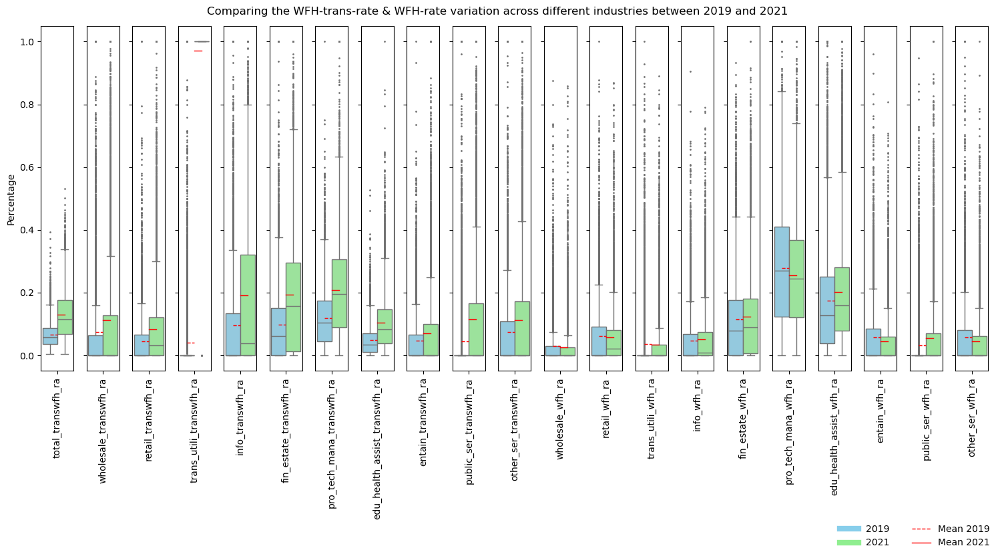

In [61]:
list_A = ['total_transwfh_ra', 
          'wholesale_transwfh_ra', 'retail_transwfh_ra', 'trans_utili_transwfh_ra', 'info_transwfh_ra',
          'fin_estate_transwfh_ra', 'pro_tech_mana_transwfh_ra', 'edu_health_assist_transwfh_ra', 'entain_transwfh_ra',
          'public_ser_transwfh_ra', 'other_ser_transwfh_ra', 
          'wholesale_wfh_ra', 'retail_wfh_ra', 'trans_utili_wfh_ra',
          'info_wfh_ra', 'fin_estate_wfh_ra', 'pro_tech_mana_wfh_ra', 'edu_health_assist_wfh_ra', 'entain_wfh_ra',
          'public_ser_wfh_ra', 'other_ser_wfh_ra']

fig, axs = plt.subplots(1, len(list_A), figsize=(15, 8), sharey=True)  
axs = axs.flatten()  

for i, col in enumerate(list_A):
    sns.boxplot(y=combined_geo_2019[col], ax=axs[i], color='skyblue', width=0.4, positions=[-0.2], fliersize=1)
    sns.boxplot(y=combined_geo_2021[col], ax=axs[i], color='lightgreen', width=0.4, positions=[0.2], fliersize=1)
    mean_2019 = np.mean(combined_geo_2019[col])
    mean_2021 = np.mean(combined_geo_2021[col])
    axs[i].plot([-0.2, 0], [mean_2019, mean_2019], color='red', linestyle='--', linewidth=1)
    axs[i].plot([0, 0.2], [mean_2021, mean_2021], color='red', linestyle='-', linewidth=1)
    axs[i].set_xticklabels([f'{col}'], rotation=90)  
    axs[i].set_ylabel("Percentage") 

legend_elements_group1 = [plt.Line2D([0], [0], color='skyblue', lw=6, label='2019'),
                          plt.Line2D([0], [0], color='lightgreen', lw=6, label='2021')]
legend_elements_group2 = [plt.Line2D([0], [0], color='red', linestyle='--', lw=1, label='Mean 2019'),
                          plt.Line2D([0], [0], color='red', linestyle='-', lw=1, label='Mean 2021')]
legend1 = plt.figlegend(handles=legend_elements_group1, loc='lower right', frameon=False, bbox_to_anchor=(0.9, -0.05))
legend2 = plt.figlegend(handles=legend_elements_group2, loc='lower right',  frameon=False, bbox_to_anchor=(1, -0.05))

plt.suptitle('Comparing the WFH-trans-rate & WFH-rate variation across different industries between 2019 and 2021')
plt.tight_layout()
plt.show()

### Comparing the WFH-race & WFH-age & WFH-gender variation between 2019 and 2021

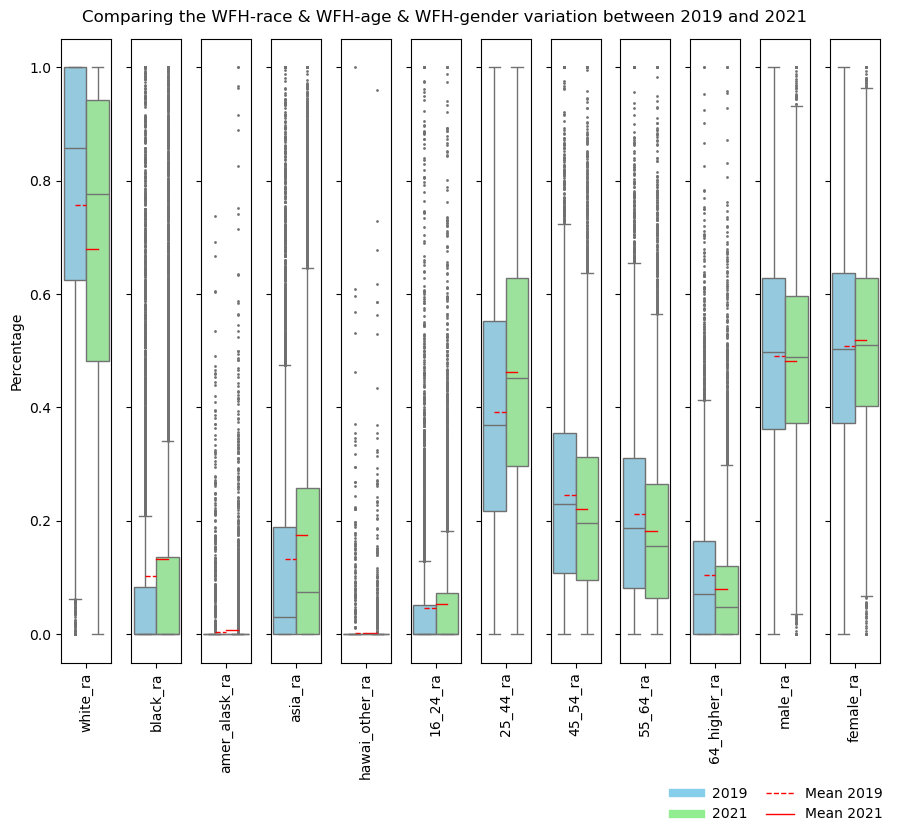

In [62]:
list_B = ['white_ra','black_ra', 'amer_alask_ra', 'asia_ra', 'hawai_other_ra', 
          '16_24_ra','25_44_ra', '45_54_ra', '55_64_ra', '64_higher_ra', 
          'male_ra','female_ra']

fig, axs = plt.subplots(1, len(list_B), figsize=(9, 8), sharey=True)  
axs = axs.flatten()  

for i, col in enumerate(list_B):
    sns.boxplot(y=combined_geo_2019[col], ax=axs[i], color='skyblue', width=0.4, positions=[-0.2], fliersize=1)
    sns.boxplot(y=combined_geo_2021[col], ax=axs[i], color='lightgreen', width=0.4, positions=[0.2], fliersize=1)
    mean_2019 = np.mean(combined_geo_2019[col])
    mean_2021 = np.mean(combined_geo_2021[col])
    axs[i].plot([-0.2, 0], [mean_2019, mean_2019], color='red', linestyle='--', linewidth=1)
    axs[i].plot([0, 0.2], [mean_2021, mean_2021], color='red', linestyle='-', linewidth=1) 
    axs[i].set_xticklabels([f'{col}'], rotation=90)  
    axs[i].set_ylabel("Percentage") 

legend_elements_group1 = [plt.Line2D([0], [0], color='skyblue', lw=6, label='2019'),
                          plt.Line2D([0], [0], color='lightgreen', lw=6, label='2021')]
legend_elements_group2 = [plt.Line2D([0], [0], color='red', linestyle='--', lw=1, label='Mean 2019'),
                          plt.Line2D([0], [0], color='red', linestyle='-', lw=1, label='Mean 2021')]
legend1 = plt.figlegend(handles=legend_elements_group1, loc='lower right', frameon=False, bbox_to_anchor=(0.85, -0.05))
legend2 = plt.figlegend(handles=legend_elements_group2, loc='lower right',  frameon=False, bbox_to_anchor=(1, -0.05))

plt.suptitle('Comparing the WFH-race & WFH-age & WFH-gender variation between 2019 and 2021')
plt.tight_layout()
plt.show()

### Comparing the Ratio & Net Earning variation between 2019 and 2021

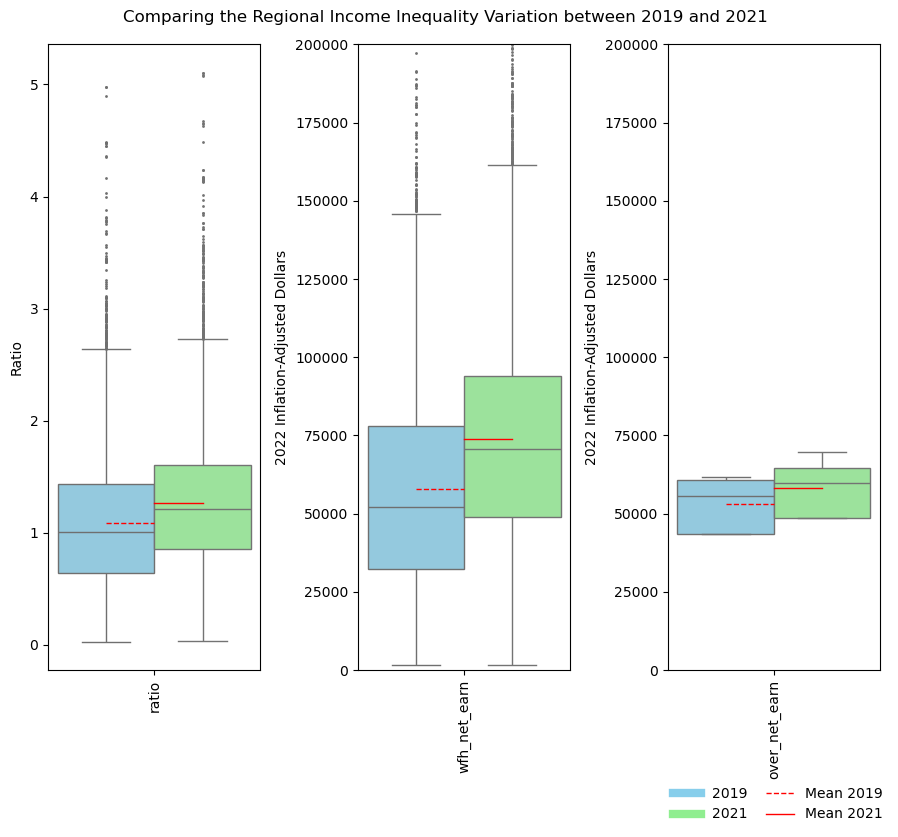

In [63]:
list_C = ['ratio', 'wfh_net_earn', 'over_net_earn']

fig, axs = plt.subplots(1, len(list_C), figsize=(9, 8))  
axs = axs.flatten()

shared_yrange = [0, 200000]  

for i, col in enumerate(list_C):
    sns.boxplot(y=combined_geo_2019[col], ax=axs[i], color='skyblue', width=0.4, positions=[-0.2], fliersize=1)
    sns.boxplot(y=combined_geo_2021[col], ax=axs[i], color='lightgreen', width=0.4, positions=[0.2], fliersize=1)
    mean_2019 = np.mean(combined_geo_2019[col])
    mean_2021 = np.mean(combined_geo_2021[col])
    axs[i].plot([-0.2, 0], [mean_2019, mean_2019], color='red', linestyle='--', linewidth=1)
    axs[i].plot([0, 0.2], [mean_2021, mean_2021], color='red', linestyle='-', linewidth=1)
    axs[i].set_xticklabels([f'{col}'], rotation=90)
    
    if col != 'ratio':
        axs[i].set_ylim(shared_yrange)
    
    if col == 'ratio':
        axs[i].set_ylabel("Ratio")
    else:
        axs[i].set_ylabel("2022 Inflation-Adjusted Dollars")

legend_elements_group1 = [plt.Line2D([0], [0], color='skyblue', lw=6, label='2019'),
                          plt.Line2D([0], [0], color='lightgreen', lw=6, label='2021')]
legend_elements_group2 = [plt.Line2D([0], [0], color='red', linestyle='--', lw=1, label='Mean 2019'),
                          plt.Line2D([0], [0], color='red', linestyle='-', lw=1, label='Mean 2021')]
legend1 = plt.figlegend(handles=legend_elements_group1, loc='lower right', frameon=False, bbox_to_anchor=(0.85, -0.05))
legend2 = plt.figlegend(handles=legend_elements_group2, loc='lower right',  frameon=False, bbox_to_anchor=(1, -0.05))

plt.suptitle('Comparing the Regional Income Inequality Variation between 2019 and 2021')
plt.tight_layout()
plt.show()

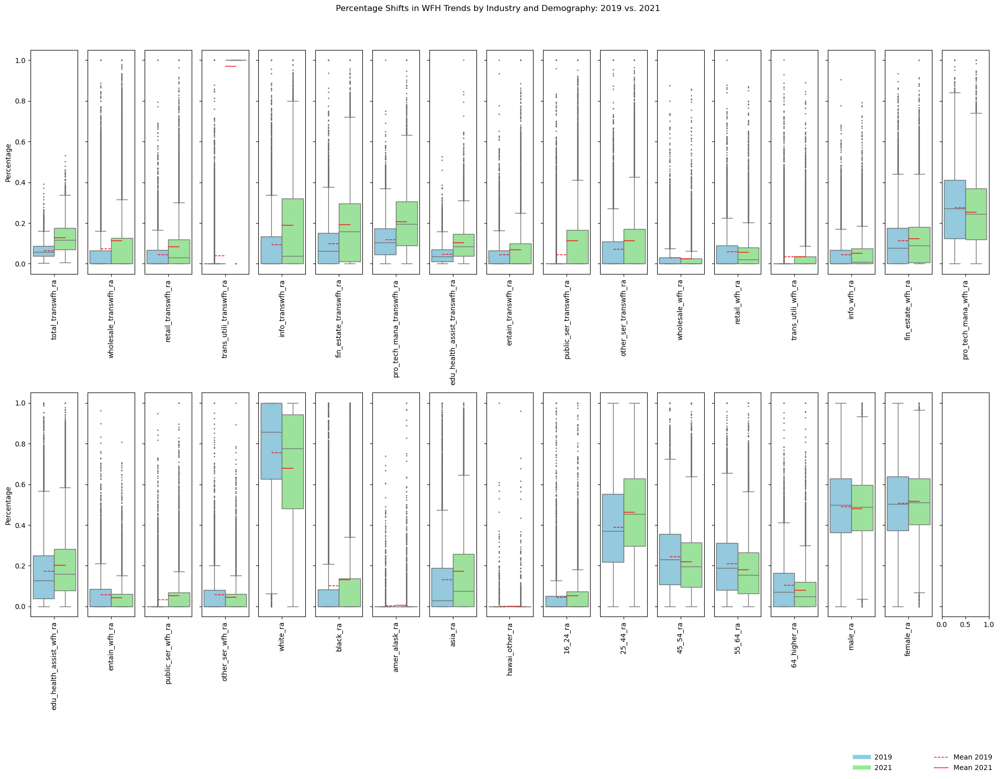

In [64]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'combined_geo_2019' and 'combined_geo_2021' are your dataframes.

list_A = [
    'total_transwfh_ra', 
    'wholesale_transwfh_ra', 'retail_transwfh_ra', 'trans_utili_transwfh_ra', 'info_transwfh_ra',
    'fin_estate_transwfh_ra', 'pro_tech_mana_transwfh_ra', 'edu_health_assist_transwfh_ra', 'entain_transwfh_ra',
    'public_ser_transwfh_ra', 'other_ser_transwfh_ra', 
    'wholesale_wfh_ra', 'retail_wfh_ra', 'trans_utili_wfh_ra',
    'info_wfh_ra', 'fin_estate_wfh_ra', 'pro_tech_mana_wfh_ra', 'edu_health_assist_wfh_ra', 'entain_wfh_ra',
    'public_ser_wfh_ra', 'other_ser_wfh_ra',
    'white_ra','black_ra', 'amer_alask_ra', 'asia_ra', 'hawai_other_ra', 
    '16_24_ra','25_44_ra', '45_54_ra', '55_64_ra', '64_higher_ra', 
    'male_ra','female_ra'
]

# Calculate number of columns (half of list length, rounded up)
num_columns = (len(list_A) + 1) // 2  

fig, axs = plt.subplots(2, num_columns, figsize=(20, 15), sharey=True)
axs = axs.flatten()  # Flatten if you prefer to use a 1D index

for i, col in enumerate(list_A):
    sns.boxplot(y=combined_geo_2019[col], ax=axs[i], color='skyblue', width=0.4, positions=[-0.2], fliersize=1)
    sns.boxplot(y=combined_geo_2021[col], ax=axs[i], color='lightgreen', width=0.4, positions=[0.2], fliersize=1)
    mean_2019 = np.mean(combined_geo_2019[col])
    mean_2021 = np.mean(combined_geo_2021[col])
    axs[i].plot([-0.2, 0], [mean_2019, mean_2019], color='red', linestyle='--', linewidth=1)
    axs[i].plot([0, 0.2], [mean_2021, mean_2021], color='red', linestyle='-', linewidth=1)
    axs[i].set_xticklabels([col], rotation=90)
    if i % num_columns == 0:  # Set y-axis label for the first column of each row
        axs[i].set_ylabel("Percentage")

legend_elements_group1 = [plt.Line2D([0], [0], color='skyblue', lw=6, label='2019'),
                          plt.Line2D([0], [0], color='lightgreen', lw=6, label='2021')]
legend_elements_group2 = [plt.Line2D([0], [0], color='red', linestyle='--', lw=1, label='Mean 2019'),
                          plt.Line2D([0], [0], color='red', linestyle='-', lw=1, label='Mean 2021')]
plt.figlegend(handles=legend_elements_group1, loc='lower right', frameon=False, bbox_to_anchor=(0.9, -0.05))
plt.figlegend(handles=legend_elements_group2, loc='lower right', frameon=False, bbox_to_anchor=(1, -0.05))

plt.suptitle('Percentage Shifts in WFH Trends by Industry and Demography: 2019 vs. 2021')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to fit suptitle and legends
plt.show()

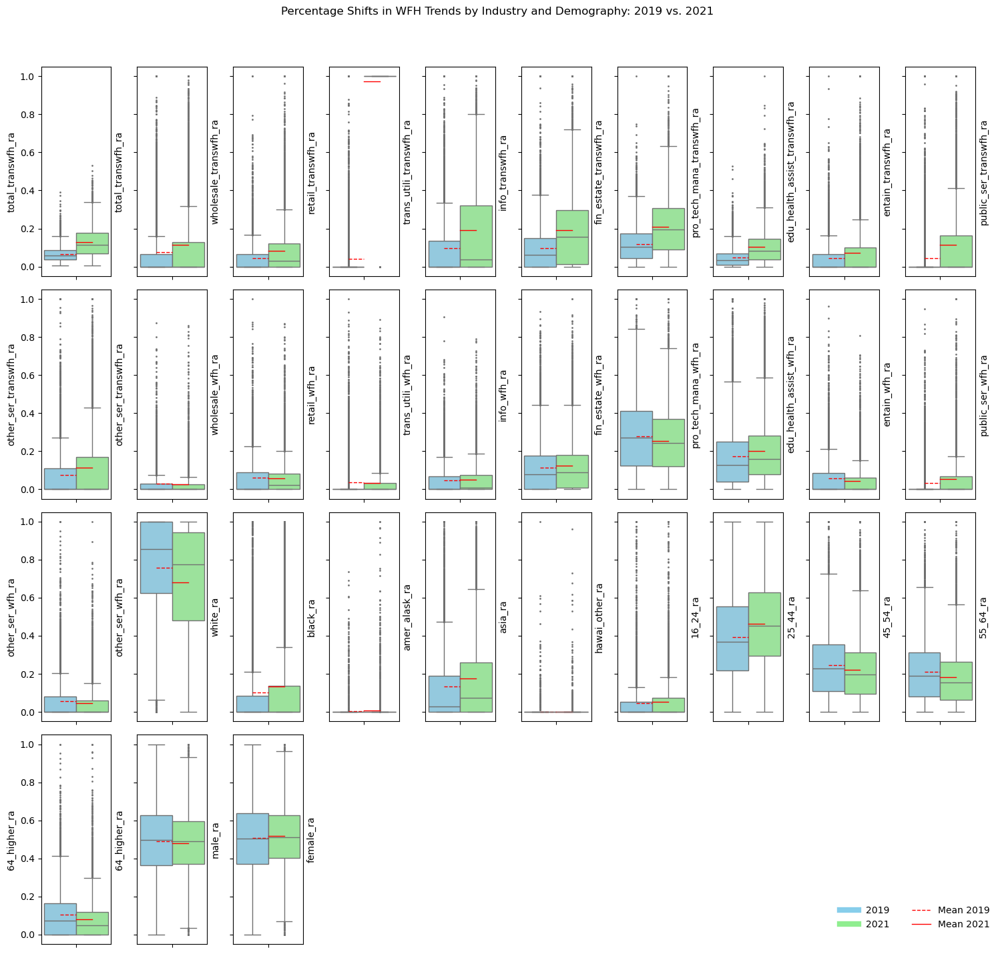

In [65]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'combined_geo_2019' and 'combined_geo_2021' are your dataframes.

list_A = [
    'total_transwfh_ra', 
    'wholesale_transwfh_ra', 'retail_transwfh_ra', 'trans_utili_transwfh_ra', 'info_transwfh_ra',
    'fin_estate_transwfh_ra', 'pro_tech_mana_transwfh_ra', 'edu_health_assist_transwfh_ra', 'entain_transwfh_ra',
    'public_ser_transwfh_ra', 'other_ser_transwfh_ra', 
    'wholesale_wfh_ra', 'retail_wfh_ra', 'trans_utili_wfh_ra',
    'info_wfh_ra', 'fin_estate_wfh_ra', 'pro_tech_mana_wfh_ra', 'edu_health_assist_wfh_ra', 'entain_wfh_ra',
    'public_ser_wfh_ra', 'other_ser_wfh_ra',
    'white_ra','black_ra', 'amer_alask_ra', 'asia_ra', 'hawai_other_ra', 
    '16_24_ra','25_44_ra', '45_54_ra', '55_64_ra', '64_higher_ra', 
    'male_ra','female_ra'
]

# Calculate number of columns and rows
num_columns = 10
num_rows = (len(list_A) + num_columns - 1) // num_columns  # Rounds up the division

fig, axs = plt.subplots(num_rows, num_columns, figsize=(15, 15), sharey=True)
axs = axs.flatten()  # Flatten to use a 1D index

# Plot data
for i, col in enumerate(list_A):
    sns.boxplot(y=combined_geo_2019[col], ax=axs[i], color='skyblue', width=0.4, positions=[-0.2], fliersize=1)
    sns.boxplot(y=combined_geo_2021[col], ax=axs[i], color='lightgreen', width=0.4, positions=[0.2], fliersize=1)
    mean_2019 = np.mean(combined_geo_2019[col])
    mean_2021 = np.mean(combined_geo_2021[col])
    axs[i].plot([-0.2, 0], [mean_2019, mean_2019], color='red', linestyle='--', linewidth=1)
    axs[i].plot([0, 0.2], [mean_2021, mean_2021], color='red', linestyle='-', linewidth=1)
    axs[i].text(1.05, 0.5, col, transform=axs[i].transAxes, ha='left', va='center', rotation=90)
    axs[i].set_xticklabels([])  # Hide x-tick labels

# Hide unused axes
for i in range(len(list_A), len(axs)):
    axs[i].axis('off')

legend_elements_group1 = [plt.Line2D([0], [0], color='skyblue', lw=6, label='2019'),
                          plt.Line2D([0], [0], color='lightgreen', lw=6, label='2021')]
legend_elements_group2 = [plt.Line2D([0], [0], color='red', linestyle='--', lw=1, label='Mean 2019'),
                          plt.Line2D([0], [0], color='red', linestyle='-', lw=1, label='Mean 2021')]
plt.figlegend(handles=legend_elements_group1, loc='lower right', frameon=False, bbox_to_anchor=(0.9, 0.05))
plt.figlegend(handles=legend_elements_group2, loc='lower right', frameon=False, bbox_to_anchor=(1, 0.05))

plt.suptitle('Percentage Shifts in WFH Trends by Industry and Demography: 2019 vs. 2021')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to fit suptitle and legends
plt.show()

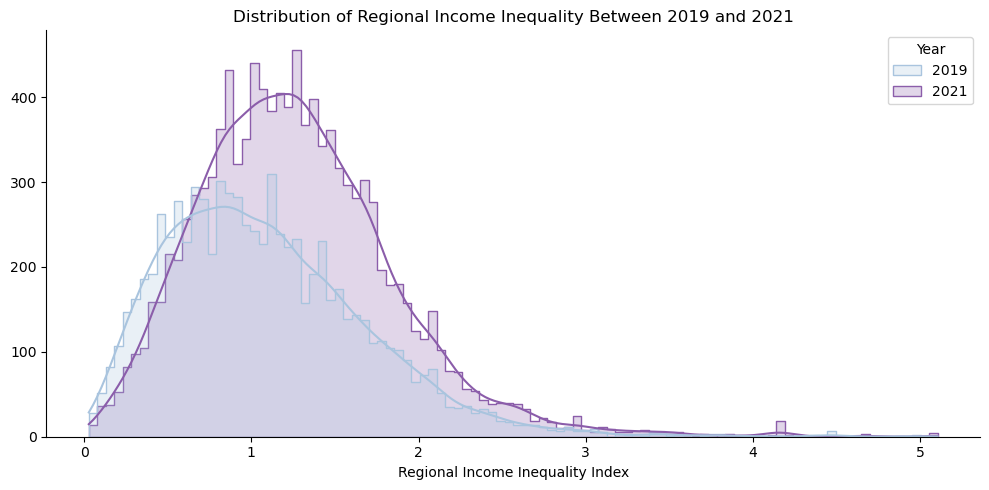

In [66]:
# Assuming 'combined_geo_2019' and 'combined_geo_2021' dataframes are predefined.

combined_geo_2019['Year'] = '2019'
combined_geo_2021['Year'] = '2021'

Inc_wfh_combine = pd.concat([combined_geo_2019[['Year', 'ratio']], combined_geo_2021[['Year', 'ratio']]], ignore_index=True)

plt.figure(figsize=(10, 5))
palette = sns.color_palette("BuPu", 2)

# Create the histogram plot
sns.histplot(data=Inc_wfh_combine, x='ratio', hue='Year', palette=palette, kde=True, element='step', bins=100)

# Set plot title
plt.title('Distribution of Regional Income Inequality Between 2019 and 2021')

# Hide x and y axis labels
plt.xlabel('Regional Income Inequality Index')
plt.ylabel('')

# Hide x and y ticks (the numbers and ticks on the axes)
# plt.xticks([])
# plt.yticks([])

# If you also want to remove the axis entirely including the spines:
plt.gca().spines[['right','top']].set_visible(False)

plt.tight_layout()
plt.show()

### Calculate the T-test for Income Disparity from 2019 to 2021

In [67]:
from scipy import stats

cov_2019 = combined_geo_2019[combined_geo_2019['ratio'].isnull() == False]['ratio']
cov_2021 = combined_geo_2021[combined_geo_2021['ratio'].isnull() == False]['ratio']

# t test
t_stat, p_value = stats.ttest_ind(cov_2021,cov_2019)

print("T-statistic:", t_stat)
print("P-value:", p_value)

T-statistic: 20.37204984532122
P-value: 2.801472322883909e-91


# <font color='#ffc000'>Statistical Descriptions</font>

In [68]:
combined_geo_2019['ln_ratio'] = np.log10(combined_geo_2019['ratio'])
combined_geo_2021['ln_ratio'] = np.log10(combined_geo_2021['ratio'])

In [69]:
selected_vars = ['ratio','ln_ratio',
                 'total_transwfh_ra',
                 'wholesale_wfh_ra','retail_wfh_ra','trans_utili_wfh_ra','info_wfh_ra','fin_estate_wfh_ra','pro_tech_mana_wfh_ra','edu_health_assist_wfh_ra','entain_wfh_ra','public_ser_wfh_ra','other_ser_wfh_ra',
                 'white_ra','black_ra','amer_alask_ra','asia_ra','hawai_other_ra',
                 '16_24_ra','25_44_ra','45_54_ra','55_64_ra','64_higher_ra',
                 'male_ra','female_ra']

In [70]:
df1 = combined_geo_2019[selected_vars]
df2 = combined_geo_2021[selected_vars]

# Style the DataFrames and include captions with the number of rows
style = "style='display:inline; padding:10px'"

# Apply style to the head of the DataFrames
combined_geo_2019_head = df1.describe().style.set_table_attributes(style).set_caption(f'2019 Census Tracts, {len(df1)} rows')
combined_geo_2021_head = df2.describe().style.set_table_attributes(style).set_caption(f'2019_est Census Tracts, {len(df2)} rows')

# Display the heads of the styled DataFrames
display_html(combined_geo_2019_head._repr_html_() + combined_geo_2021_head._repr_html_() , raw=True)

,ratio,ln_ratio,total_transwfh_ra,wholesale_wfh_ra,retail_wfh_ra,trans_utili_wfh_ra,info_wfh_ra,fin_estate_wfh_ra,pro_tech_mana_wfh_ra,edu_health_assist_wfh_ra,entain_wfh_ra,public_ser_wfh_ra,other_ser_wfh_ra,white_ra,black_ra,amer_alask_ra,asia_ra,hawai_other_ra,16_24_ra,25_44_ra,45_54_ra,55_64_ra,64_higher_ra,male_ra,female_ra
count,7847.000000,7847.000000,7847.000000,7847.000000,7847.000000,7847.000000,7847.000000,7847.000000,7847.000000,7847.000000,7847.000000,7847.000000,7847.000000,7847.000000,7847.000000,7847.000000,7847.000000,7847.000000,7847.000000,7847.000000,7847.000000,7847.000000,7847.000000,7847.000000,7847.000000
mean,1.088162,-0.040677,0.065749,0.030344,0.061297,0.035870,0.045875,0.114276,0.277316,0.173356,0.057433,0.032819,0.057477,0.756759,0.102322,0.004518,0.132390,0.002099,0.045530,0.391291,0.246057,0.212071,0.105052,0.491371,0.508629
std,0.608692,0.282233,0.038989,0.071993,0.102372,0.096706,0.082415,0.135997,0.197491,0.178860,0.099691,0.083104,0.102596,0.283787,0.223692,0.035300,0.205954,0.024940,0.105714,0.232865,0.184047,0.172445,0.124536,0.203579,0.203579
min,0.027861,-1.554997,0.004138,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.637442,-0.195559,0.037062,0.000000,0.000000,0.000000,0.000000,0.000000,0.122807,0.038168,0.000000,0.000000,0.000000,0.625000,0.000000,0.000000,0.000000,0.000000,0.000000,0.217676,0.108696,0.081721,0.000000,0.362832,0.371850
50%,1.007887,0.003412,0.057582,0.000000,0.000000,0.000000,0.000000,0.077778,0.270270,0.128205,0.000000,0.000000,0.000000,0.857143,0.000000,0.000000,0.029925,0.000000,0.000000,0.369697,0.229572,0.187970,0.071856,0.497512,0.502488
75%,1.438214,0.157824,0.086695,0.029561,0.090426,0.000000,0.068665,0.176471,0.410679,0.250000,0.084838,0.000000,0.080955,1.000000,0.083771,0.000000,0.189852,0.000000,0.051440,0.552396,0.355263,0.311290,0.165351,0.628150,0.637168
max,4.981621,0.697371,0.392473,0.875000,1.000000,1.000000,0.904762,0.933333,1.000000,1.000000,0.961538,0.948718,1.000000,1.000000,1.000000,0.738095,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
,ratio,ln_ratio,total_transwfh_ra,wholesale_wfh_ra,retail_wfh_ra,trans_utili_wfh_ra,info_wfh_ra,fin_estate_wfh_ra,pro_tech_mana_wfh_ra,edu_health_assist_wfh_ra,entain_wfh_ra,public_ser_wfh_ra,other_ser_wfh_ra,white_ra,black_ra,amer_alask_ra,asia_ra,hawai_other_ra,16_24_ra,25_44_ra,45_54_ra,55_64_ra,64_higher_ra,male_ra,female_ra
count,11131.000000,11131.000000,11131.000000,11131.000000,11131.000000,11131.000000,11131.000000,11131.000000,11131.000000,11131.000000,11131.000000,11131.000000,11131.000000,11131.000000,11131.000000,11131.000000,11131.000000,11131.000000,11131.000000,11131.000000,11131.000000,11131.000000,11131.000000,11131.000000,11131.000000


In [71]:
selected_vars = [
                 'total_transwfh_ra',
                 'wholesale_wfh_ra','retail_wfh_ra','trans_utili_wfh_ra','info_wfh_ra','fin_estate_wfh_ra','pro_tech_mana_wfh_ra','edu_health_assist_wfh_ra','entain_wfh_ra','public_ser_wfh_ra','other_ser_wfh_ra',
                 'white_ra','black_ra','amer_alask_ra','asia_ra','hawai_other_ra',
                 '16_24_ra','25_44_ra','45_54_ra','55_64_ra','64_higher_ra',
                 'male_ra','female_ra']

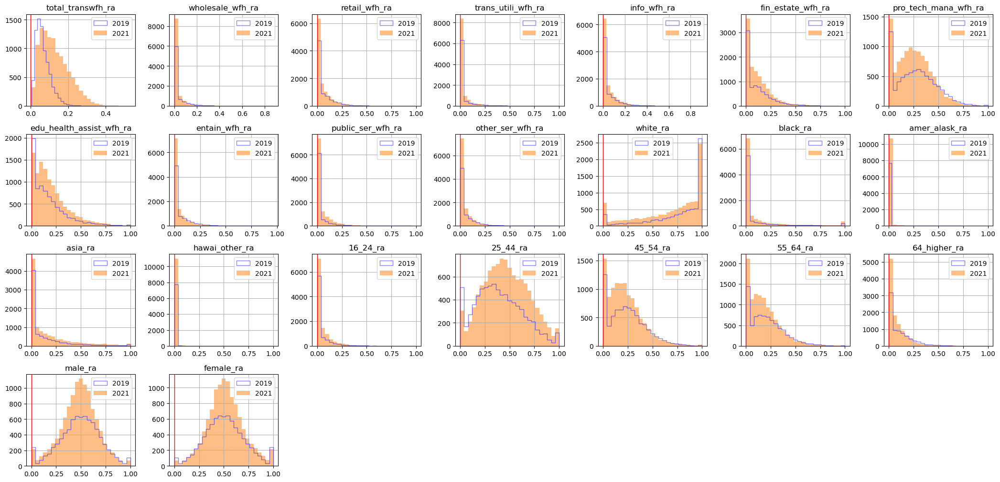

In [72]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=6, ncols=7, figsize=(21, 15))

for ax, column in zip(axes.flatten(), selected_vars):
    
    combined_geo_2019[column].hist(bins=25, edgecolor='blue', alpha=0.5, ax=ax, label='2019',histtype='step')
    combined_geo_2021[column].hist(bins=25, edgecolor='none', alpha=0.5, ax=ax, label='2021',histtype='bar')
    ax.axvline(x=0, color='red', linewidth=1)
    ax.set_title(column)
    ax.legend()  

for ax in axes.flatten()[len(selected_vars):]:
    ax.remove()
    
plt.tight_layout()
plt.show()

In [73]:
selected_independent_vars = ['total_transwfh_ra','wholesale_wfh_ra','retail_wfh_ra','trans_utili_wfh_ra','info_wfh_ra','fin_estate_wfh_ra',
                             'pro_tech_mana_wfh_ra','edu_health_assist_wfh_ra','entain_wfh_ra','public_ser_wfh_ra','other_ser_wfh_ra','white_ra','black_ra','amer_alask_ra',
                             'asia_ra','hawai_other_ra','16_24_ra','25_44_ra','45_54_ra','55_64_ra','64_higher_ra','male_ra','female_ra']

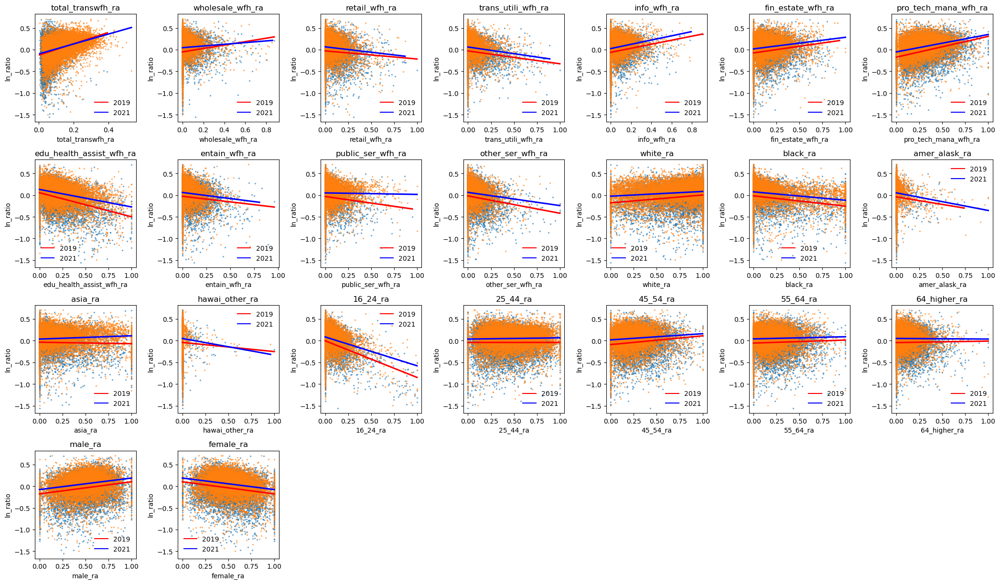

In [74]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.lines as mlines 

fig, axes = plt.subplots(nrows=6, ncols=7, figsize=(21, 18))  

for ax, column in zip(axes.flatten(), selected_independent_vars):
    
    sns.regplot(x=column, y='ln_ratio', data=combined_geo_2019, ci=None, scatter_kws={'alpha':0.5, 's': 2, 'marker': '+'}, line_kws={'color': 'red'}, ax=ax)
    sns.regplot(x=column, y='ln_ratio', data=combined_geo_2021, ci=None, scatter_kws={'alpha':0.5, 's': 2, 'marker': 'x'}, line_kws={'color': 'blue'}, ax=ax)
   
    ax.set_title(column)
    
    red_line = mlines.Line2D([], [], color='red', label='2019')
    blue_line = mlines.Line2D([], [], color='blue', label='2021')
    ax.legend(handles=[red_line, blue_line], frameon=False)

for ax in axes.flatten()[len(selected_independent_vars):]:
    ax.remove()

plt.tight_layout()
plt.show()

# <font color='#ffc000'>Correlation Test</font>

### Variance Inflation Factor(VIF) Test

In [75]:
selected_independent_vars = ['total_transwfh_ra','wholesale_wfh_ra','retail_wfh_ra','trans_utili_wfh_ra','info_wfh_ra','fin_estate_wfh_ra',
                             'pro_tech_mana_wfh_ra','edu_health_assist_wfh_ra','entain_wfh_ra','public_ser_wfh_ra','other_ser_wfh_ra','white_ra',
                             '16_24_ra','25_44_ra','45_54_ra','male_ra']

In [76]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calculate_vif(df):
    vif_data = pd.DataFrame()
    vif_data["Variable"] = df.columns
    vif_data["VIF"] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
    return vif_data

# use the original variables
X_2019 = combined_geo_2019[selected_independent_vars] 
X_2021 = combined_geo_2021[selected_independent_vars] 

vif_2019 = calculate_vif(X_2019)
vif_2021 = calculate_vif(X_2021)

vif_combined = pd.merge(vif_2019, vif_2021, on='Variable', suffixes=('_2019', '_2021'))
vif_combined

,Variable,VIF_2019,VIF_2021
0,total_transwfh_ra,4.0983,4.4898
1,wholesale_wfh_ra,1.2492,1.2413
2,retail_wfh_ra,1.4986,1.5512
3,trans_utili_wfh_ra,1.2833,1.2950
4,info_wfh_ra,1.4315,1.6269
5,fin_estate_wfh_ra,1.9277,2.1625
6,pro_tech_mana_wfh_ra,4.1532,4.6553
7,edu_health_assist_wfh_ra,2.1311,2.7485
8,entain_wfh_ra,1.5141,1.4421
9,public_ser_wfh_ra,1.1812,1.3853


### Correlation Map

In [77]:
selected_vars = ['ln_ratio',
                 'total_transwfh_ra','wholesale_wfh_ra','retail_wfh_ra','trans_utili_wfh_ra','info_wfh_ra','fin_estate_wfh_ra',
                 'pro_tech_mana_wfh_ra','edu_health_assist_wfh_ra','entain_wfh_ra','public_ser_wfh_ra','other_ser_wfh_ra','white_ra',
                 '16_24_ra','25_44_ra','45_54_ra','male_ra']

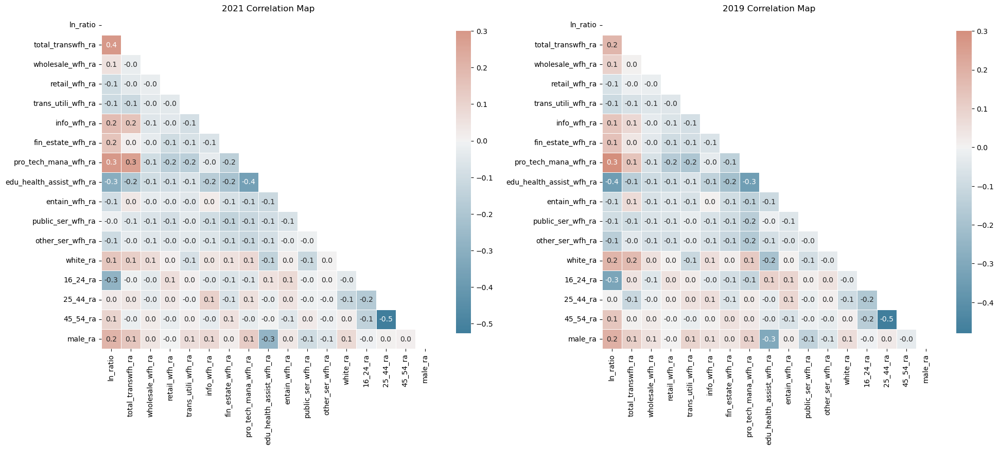

In [78]:
fig,ax = plt.subplots(1,2,figsize=(20, 15))
ax = ax.flatten()
cmap = sns.diverging_palette(230, 20, as_cmap=True)

data_corr_2021 = combined_geo_2021[selected_vars]
corr_2021 = data_corr_2021.corr()
mask = np.triu(np.ones_like(corr_2021, dtype=bool))
sns.heatmap(corr_2021, mask=mask, cmap=cmap, vmax=.3, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .4} ,annot=True, fmt=".1f",annot_kws={'size': 10},ax=ax[0])
ax[0].tick_params(axis='x', labelsize=10)
ax[0].tick_params(axis='y', labelsize=10)
ax[0].set_title('2021 Correlation Map')

data_corr_2019 = combined_geo_2019[selected_vars]
corr_2019 = data_corr_2019.corr()
mask = np.triu(np.ones_like(corr_2019, dtype=bool))
sns.heatmap(corr_2019, mask=mask, cmap=cmap, vmax=.3, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .4}, annot=True, annot_kws={'size': 10}, fmt=".1f",ax=ax[1])
ax[1].tick_params(axis='x', labelsize=10)
ax[1].tick_params(axis='y', labelsize=10)
ax[1].set_title('2019 Correlation Map')

plt.tight_layout()
plt.show()

# <font color='#ffc000'>Basic Models</font>

### <font color='#ffc000'>Run OLS Model A</font>

In [79]:
import statsmodels.api as sm
import pandas as pd

def run_ols_analysis(data, dependent_var, independent_vars):
    Y = data[dependent_var]
    X = data[independent_vars]  
    # Add constant to independent variables
    X = sm.add_constant(X)
    # Create OLS model
    ols_model = sm.OLS(Y, X).fit(cov_type='HC3')
    
    # Store the results in a DataFrame
    results_df = pd.DataFrame(ols_model.summary().tables[1].data)
    new_header = results_df.iloc[0]  # grab the first row for the header
    results_df = results_df[1:]  # take the data less the header row
    results_df.columns = new_header  # set the header row as the df header
    
    # Optionally, you can save the results to a CSV file
    return ols_model, results_df

In [80]:
dependent_var = 'ln_ratio'

# Run OLS analysis for 2019 data
ols_model_2019a, results_ols_model_2019a = run_ols_analysis(combined_geo_2019, dependent_var, selected_independent_vars)
print(ols_model_2019a.summary())

# Run OLS analysis for 2021 data
ols_model_2021a, results_ols_model_2021a = run_ols_analysis(combined_geo_2021, dependent_var, selected_independent_vars)
print(ols_model_2021a.summary())

                            OLS Regression Results                            
Dep. Variable:               ln_ratio   R-squared:                       0.325
Model:                            OLS   Adj. R-squared:                  0.323
Method:                 Least Squares   F-statistic:                     168.8
Date:                Mon, 29 Apr 2024   Prob (F-statistic):               0.00
Time:                        19:18:57   Log-Likelihood:                 333.15
No. Observations:                7847   AIC:                            -632.3
Df Residuals:                    7830   BIC:                            -513.8
Df Model:                          16                                         
Covariance Type:                  HC3                                         
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

### <font color='#ffc000'>Run OLS Model B with DBSCAN Clusters</font>

### <font color='green'>Standardlize Process</font>

In [81]:
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA

from scipy.spatial.distance import cdist
from scipy import stats
from sklearn.preprocessing import robust_scale
from sklearn import metrics

In [82]:
vars = ['total_transwfh_ra', 'wholesale_transwfh_ra','retail_transwfh_ra', 'trans_utili_transwfh_ra', 'info_transwfh_ra',
        'fin_estate_transwfh_ra', 'pro_tech_mana_transwfh_ra','edu_health_assist_transwfh_ra', 'entain_transwfh_ra',
        'public_ser_transwfh_ra', 'other_ser_transwfh_ra', 
        'wholesale_wfh_ra','retail_wfh_ra', 'trans_utili_wfh_ra', 'info_wfh_ra','fin_estate_wfh_ra', 'pro_tech_mana_wfh_ra', 'edu_health_assist_wfh_ra',
        'entain_wfh_ra', 'public_ser_wfh_ra', 'other_ser_wfh_ra']

vars_2019 = robust_scale(combined_geo_2019[vars])
vars_scaled_2019 = pd.DataFrame(vars_2019, columns=vars)

vars_2021 = robust_scale(combined_geo_2021[vars])
vars_scaled_2021 = pd.DataFrame(vars_2021, columns=vars)

In [83]:
# dist_matrix_2019 = metrics.pairwise_distances(vars_scaled_2019).round(2)
# dist_matrix_2021 = metrics.pairwise_distances(vars_scaled_2021).round(2)

# mean_2019 = np.mean(dist_matrix_2019)
# mean_2021 = np.mean(dist_matrix_2021)

# median_2019 = np.median(dist_matrix_2019)
# median_2021 = np.median(dist_matrix_2021)

# print("2019 Vars Scale\n",dist_matrix_2019)
# print("2019 Mean:", mean_2019)
# print("2019 Median:", median_2019)
# print("2021 Vars Scale\n",dist_matrix_2021)
# print("2021 Mean:", mean_2021)
# print("2021 Median:", median_2021)

### <font color='green'>Reduced Dimesion by PCA Process</font>

In [84]:
pca = PCA(n_components=2,random_state=100) 
pca_result_2019 = pca.fit_transform(vars_scaled_2019)
pca_result_2021 = pca.fit_transform(vars_scaled_2021)

print("2019 Pca Result\n",metrics.pairwise_distances(pca_result_2019).round(2))
print("2021 Pca Result\n",metrics.pairwise_distances(pca_result_2021).round(2))

2019 Pca Result
 [[ 0.    3.13  2.53 ...  8.39 12.98  2.48]
 [ 3.13  0.    0.62 ... 10.49 14.07  5.61]
 [ 2.53  0.62  0.   ... 10.1  13.89  5.  ]
 ...
 [ 8.39 10.49 10.1  ...  0.    5.89  7.29]
 [12.98 14.07 13.89 ...  5.89  0.   12.62]
 [ 2.48  5.61  5.   ...  7.29 12.62  0.  ]]
2021 Pca Result
 [[ 0.    3.21  5.23 ... 14.97  6.43  9.31]
 [ 3.21  0.    5.02 ... 14.47  5.46  8.64]
 [ 5.23  5.02  0.   ...  9.8   1.58  4.07]
 ...
 [14.97 14.47  9.8  ...  0.    9.01  5.84]
 [ 6.43  5.46  1.58 ...  9.01  0.    3.18]
 [ 9.31  8.64  4.07 ...  5.84  3.18  0.  ]]


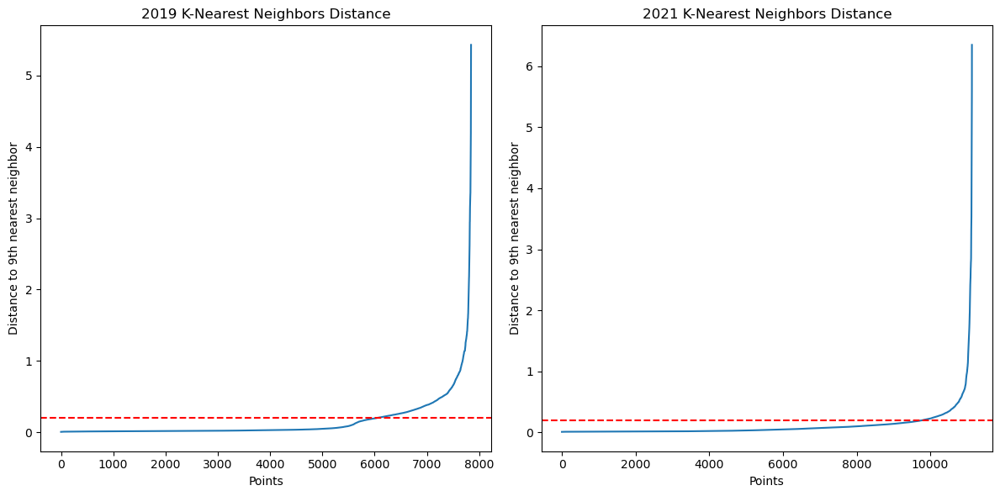

In [85]:
from sklearn.neighbors import NearestNeighbors

def plot_nearest_neighbors_distance(pca_result_2019, pca_result_2021, min_samples=10):
    neigh = NearestNeighbors(n_neighbors=min_samples)
    
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    
    for i, pca_result in enumerate([pca_result_2019, pca_result_2021]):
        neigh.fit(pca_result)
        distances, indices = neigh.kneighbors(pca_result)
        sorted_distances = np.sort(distances[:, -1])
        
        axs[i].plot(sorted_distances)
        axs[i].set_xlabel('Points')
        axs[i].set_ylabel('Distance to {}th nearest neighbor'.format(min_samples - 1))
        year = 2019 if i == 0 else 2021
        axs[i].set_title(f'{year} K-Nearest Neighbors Distance')
    
        axs[i].axhline(y=0.2, color='r', linestyle='--')
    
    plt.tight_layout()
    plt.show()


plot_nearest_neighbors_distance(pca_result_2019, pca_result_2021)

In [86]:
from sklearn.cluster import DBSCAN
import numpy as np

def dbscan_cluster(pca_result_2019, pca_result_2021, eps=0.2, min_samples=10):
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    cluster_counts_results = {}
    unique_clusters_results = {}  
    clusters_results = {}  

    for i, pca_result in enumerate([pca_result_2019, pca_result_2021]):
        clusters = dbscan.fit_predict(pca_result)
        
        unique_clusters, counts = np.unique(clusters, return_counts=True)
        cluster_counts = dict(zip(unique_clusters, counts))
        
        year = 2019 if i == 0 else 2021
        cluster_counts_results[year] = cluster_counts
        unique_clusters_results[year] = unique_clusters
        clusters_results[year] = clusters

    return cluster_counts_results, unique_clusters_results, clusters_results

cluster_counts, unique_clusters_results, clusters_results = dbscan_cluster(pca_result_2019, pca_result_2021)

unique_clusters_2019 = unique_clusters_results[2019]
unique_clusters_2021 = unique_clusters_results[2021]
clusters_2019 = clusters_results[2019]
clusters_2021 = clusters_results[2021]

print("Cluster Counts:", cluster_counts)
print("Unique Clusters 2019:", unique_clusters_2019)
print("Unique Clusters 2021:", unique_clusters_2021)
print("Clusters 2019:", clusters_2019)
print("Clusters 2021:", clusters_2021)

Cluster Counts: {2019: {-1: 1512, 0: 5714, 1: 363, 2: 59, 3: 15, 4: 9, 5: 10, 6: 11, 7: 22, 8: 10, 9: 17, 10: 14, 11: 20, 12: 17, 13: 12, 14: 12, 15: 11, 16: 9, 17: 10}, 2021: {-1: 1020, 0: 9985, 1: 30, 2: 14, 3: 49, 4: 22, 5: 11}}
Unique Clusters 2019: [-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]
Unique Clusters 2021: [-1  0  1  2  3  4  5]
Clusters 2019: [ 0  0  0 ... -1 -1  0]
Clusters 2021: [ 0  0 -1 ... -1  0  0]


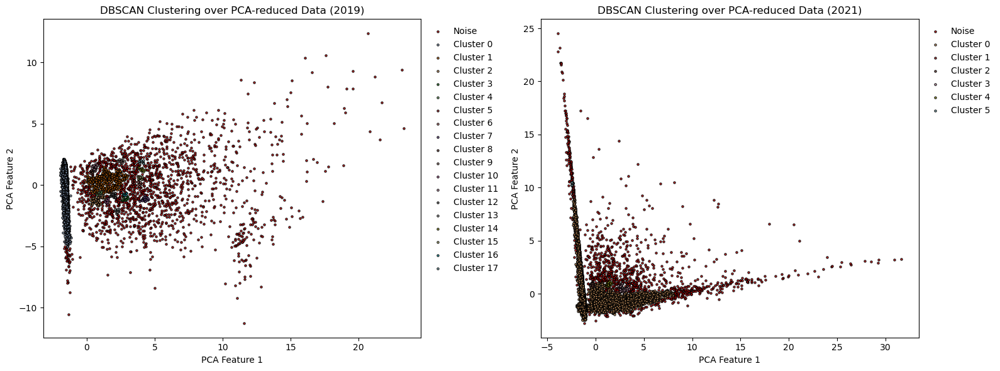

In [87]:
import matplotlib.pyplot as plt
import numpy as np

def plot_dbscan_clusters_on_subplot(pca_results, clusters_results, years):
    fig, axes = plt.subplots(1, 2, figsize=(16, 6)) 

    for ax, pca_result, clusters, year in zip(axes, pca_results, clusters_results, years):
        unique_clusters = np.unique(clusters)
        color_map = plt.cm.tab20(np.linspace(0, 1, len(unique_clusters)))

        noise_color = 'red'
        label_colors = {label: (noise_color if label == -1 else color) for label, color in zip(unique_clusters, color_map)}

        for label in unique_clusters:
            subset = pca_result[clusters == label]
            ax.scatter(subset[:, 0], subset[:, 1], color=label_colors[label],
                       label=f'Cluster {label}' if label != -1 else 'Noise', marker='o',
                       edgecolor='k', s=5, alpha=0.8)

        ax.set_title(f'DBSCAN Clustering over PCA-reduced Data ({year})')
        ax.set_xlabel('PCA Feature 1')
        ax.set_ylabel('PCA Feature 2')
        ax.legend(loc='upper left', bbox_to_anchor=(1, 1), frameon=False)

    plt.tight_layout()
    plt.show()

plot_dbscan_clusters_on_subplot([pca_result_2019, pca_result_2021], [clusters_2019, clusters_2021], [2019, 2021])

In [88]:
import pandas as pd

def transform_clusters_to_dummies(clusters, combined_geo):
    clusters_df = pd.DataFrame(clusters, columns=['Cluster'])
    combined = pd.concat([combined_geo, clusters_df], axis=1)
    combined_dummy = pd.get_dummies(combined, columns=['Cluster'], prefix='Cluster', drop_first=True)
    combined_dummy[[col for col in combined_dummy.columns if "Cluster" in col]] = combined_dummy[[col for col in combined_dummy.columns if "Cluster" in col]].astype(int)
    
    return combined_dummy

combined_geo_2019 = transform_clusters_to_dummies(clusters_2019, combined_geo_2019)
combined_geo_2021 = transform_clusters_to_dummies(clusters_2021, combined_geo_2021)

In [89]:
dependent_var = 'ln_ratio'

cluster_columns = [col for col in combined_geo_2019.columns if "Cluster" in col]
vars = selected_independent_vars + cluster_columns
# Run OLS analysis for 2019 data
ols_model_2019b, results_ols_model_2019b = run_ols_analysis(combined_geo_2019, dependent_var, vars)
print(ols_model_2019b.summary())

cluster_columns = [col for col in combined_geo_2021.columns if "Cluster" in col]
vars = selected_independent_vars + cluster_columns
# Run OLS analysis for 2021 data
ols_model_2021b, results_ols_model_2021b = run_ols_analysis(combined_geo_2021, dependent_var, vars)
print(ols_model_2021b.summary())

                            OLS Regression Results                            
Dep. Variable:               ln_ratio   R-squared:                       0.330
Model:                            OLS   Adj. R-squared:                  0.327
Method:                 Least Squares   F-statistic:                     83.97
Date:                Mon, 29 Apr 2024   Prob (F-statistic):               0.00
Time:                        19:19:01   Log-Likelihood:                 365.61
No. Observations:                7847   AIC:                            -661.2
Df Residuals:                    7812   BIC:                            -417.3
Df Model:                          34                                         
Covariance Type:                  HC3                                         
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

### <font color='#ffc000'>Run OLS Model C with Fixed Location</font>

In [90]:
combined_geo_2021 = combined_geo_2021.merge(tracts_top5_csa_2021[['GEO_ID','CSA Title']], on = 'GEO_ID')
combined_geo_2019 = combined_geo_2019.merge(tracts_top5_csa_2021[['GEO_ID','CSA Title']], on = 'GEO_ID')

combined_geo_2021_fixed = pd.get_dummies(combined_geo_2021, columns=['CSA Title'], prefix='CSA')
combined_geo_2019_fixed = pd.get_dummies(combined_geo_2019, columns=['CSA Title'], prefix='CSA')

combined_geo_2021_fixed[[col for col in combined_geo_2021_fixed.columns if "CSA" in col]] = combined_geo_2021_fixed[[col for col in combined_geo_2021_fixed.columns if "CSA" in col]].astype(int)
combined_geo_2019_fixed[[col for col in combined_geo_2019_fixed.columns if "CSA" in col]] = combined_geo_2019_fixed[[col for col in combined_geo_2019_fixed.columns if "CSA" in col]].astype(int)

In [91]:
dependent_var = 'ln_ratio'

cluster_columns = [col for col in combined_geo_2019_fixed.columns if "CSA" in col]
vars = selected_independent_vars + cluster_columns
# Run OLS analysis for 2019 data
ols_model_2019c, results_ols_model_2019c = run_ols_analysis(combined_geo_2019_fixed, dependent_var, vars)
print(ols_model_2019c.summary())

cluster_columns = [col for col in combined_geo_2021_fixed.columns if "CSA" in col]
vars = selected_independent_vars + cluster_columns
# Run OLS analysis for 2021 data
ols_model_2021c, results_ols_model_2021c = run_ols_analysis(combined_geo_2021_fixed, dependent_var, vars)
print(ols_model_2021c.summary())

                            OLS Regression Results                            
Dep. Variable:               ln_ratio   R-squared:                       0.332
Model:                            OLS   Adj. R-squared:                  0.330
Method:                 Least Squares   F-statistic:                     121.4
Date:                Mon, 29 Apr 2024   Prob (F-statistic):               0.00
Time:                        19:19:02   Log-Likelihood:                 341.97
No. Observations:                6924   AIC:                            -641.9
Df Residuals:                    6903   BIC:                            -498.2
Df Model:                          20                                         
Covariance Type:                  HC3                                         
                                                         coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------

In [92]:
import pandas as pd

def extract_csa_effects(ols_model_params, filter_str):
    csa_effects = ols_model_params.filter(like=filter_str)
    stripped = [item.split("_")[1] for item in csa_effects.index]
    csa_effects.index = stripped
    csa_effects_df = csa_effects.to_frame("fixed_effect")
    return csa_effects_df

CSA_effects_2019 = extract_csa_effects(ols_model_2019c.params, "CSA")
CSA_effects_2021 = extract_csa_effects(ols_model_2021c.params, "CSA")

# <font color='#ffc000'>Spatial Autocorrelation</font>

### <font color='#ffc000'>Moran I' test</font>

#### <font color='green'>Denpendend and Independend Variables</font>

In [93]:
# Generate W from the GeoDataFrame
w_2019 = weights.distance.KNN.from_dataframe(combined_geo_2019,k=10)
# Row-standardization
w_2019.transform = "R"

# Generate W from the GeoDataFrame
w_2021 = weights.distance.KNN.from_dataframe(combined_geo_2021,k=10)
# Row-standardization
w_2021.transform = "R"

In [94]:
def calculate_and_combine_morans_i(combined_geo_2019, w_2019, combined_geo_2021, w_2021, selected_vars):
    def calculate_morans_i(data, w, selected_vars):
        
        mi_results = [Moran(data[variable], w) for variable in selected_vars]
        mi_results = [(variable, res.I, res.p_sim) for variable, res in zip(selected_vars, mi_results)]
        table = pd.DataFrame(mi_results, columns=["Variable", "Moran's I", "P-value"]).set_index("Variable")
        
        return table
    
    table_2019 = calculate_morans_i(combined_geo_2019, w_2019, selected_vars)
    table_2021 = calculate_morans_i(combined_geo_2021, w_2021, selected_vars)
    
    table_2019.columns = [f"{col} 2019" for col in table_2019.columns]
    table_2021.columns = [f"{col} 2021" for col in table_2021.columns]
    
    combined_table = pd.concat([table_2019, table_2021], axis=1)
    
    return combined_table

combined_table = calculate_and_combine_morans_i(combined_geo_2019, w_2019, combined_geo_2021, w_2021, selected_vars)
combined_table

,Moran's I 2019,P-value 2019,Moran's I 2021,P-value 2021
Variable,,,,
ln_ratio,0.2680,0.0010,0.3050,0.0010
total_transwfh_ra,0.3269,0.0010,0.4739,0.0010
wholesale_wfh_ra,0.0219,0.0010,0.0341,0.0010
retail_wfh_ra,-0.0035,0.2610,0.0160,0.0010
trans_utili_wfh_ra,0.0682,0.0010,0.0573,0.0010
info_wfh_ra,0.0667,0.0010,0.1517,0.0010
fin_estate_wfh_ra,0.0403,0.0010,0.0826,0.0010
pro_tech_mana_wfh_ra,0.1850,0.0010,0.1924,0.0010
edu_health_assist_wfh_ra,0.1360,0.0010,0.1574,0.0010


#### <font color='green'>Error Term Autocorrelation Diagnostics</font>

In [95]:
dependent_var = 'ln_ratio'

# Run OLS analysis for 2019 data
ols_model_2019a, results_ols_model_2019a = run_ols_analysis(combined_geo_2019, dependent_var, selected_independent_vars)
# Run OLS analysis for 2021 data
ols_model_2021a, results_ols_model_2021a = run_ols_analysis(combined_geo_2021, dependent_var, selected_independent_vars)

mi_results = Moran(ols_model_2019a.resid, w_2019)
print(f"2019 OLS error Moran's I: {mi_results.I}, p-value: {mi_results.p_sim}")

mi_results = Moran(ols_model_2021a.resid, w_2021)
print(f"2021 OLS error Moran's I: {mi_results.I}, p-value: {mi_results.p_sim}")

2019 OLS error Moran's I: 0.11749107572842632, p-value: 0.001
2021 OLS error Moran's I: 0.11173139252969749, p-value: 0.001


### <font color='#ffc000'>Spatial Lag Model(SLM)</font>

In [96]:
def create_slm_model(data, dependent_var, selected_independent_vars, w):

    slm_model = spreg.GM_Lag(
        # Dependent variable
        data[dependent_var].values,
        # Independent variables
        data[selected_independent_vars].values,
        # Spatial weights matrix
        w=w,
        # Dependent variable name
        name_y=dependent_var,
        # Independent variables names
        name_x=selected_independent_vars,
    )
    
    return slm_model


slm_2019 = create_slm_model(combined_geo_2019, dependent_var, selected_independent_vars, w_2019)
print(slm_2019.summary)
slm_2021 = create_slm_model(combined_geo_2021, dependent_var, selected_independent_vars, w_2021)
print(slm_2021.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: SPATIAL TWO STAGE LEAST SQUARES
--------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :    ln_ratio                Number of Observations:        6924
Mean dependent var  :     -0.0403                Number of Variables   :          18
S.D. dependent var  :      0.2819                Degrees of Freedom    :        6906
Pseudo R-squared    :      0.3954
Spatial Pseudo R-squared:  0.3683

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT        -0.10517         0.02362        -4.45307         0.00001
   total_transwfh_ra         0.28967         0.07328         3.95277         0.00008
    wholesale_wfh_ra         0.14370      

### <font color='#ffc000'>Spatial Lag of X Model(SLX)</font>

In [97]:
x_lag = ['total_transwfh_ra','info_wfh_ra','pro_tech_mana_wfh_ra','edu_health_assist_wfh_ra','public_ser_wfh_ra','white_ra','25_44_ra']

lag_variables_used = combined_geo_2019[x_lag]
wx_2019 = lag_variables_used.apply(lambda y: weights.spatial_lag.lag_spatial(w_2019, y))
wx_2019 = wx_2019.rename(columns=lambda c: "w_"+ c)

lag_variables_used = combined_geo_2021[x_lag]
wx_2021 = lag_variables_used.apply(lambda y: weights.spatial_lag.lag_spatial(w_2021, y))
wx_2021 = wx_2021.rename(columns=lambda c: "w_"+ c)

In [98]:
def create_slx_model(data, dependent_var, selected_independent_vars, wx):
    slx_exog = data[selected_independent_vars].join(wx)
    slx_model = spreg.OLS(
                data[dependent_var].values,
                slx_exog.values,
                name_y=dependent_var,
                name_x=slx_exog.columns.tolist(),
            )

    return slx_model

slx_2019_model = create_slx_model(combined_geo_2019, dependent_var, selected_independent_vars, wx_2019)
print(slx_2019_model.summary)

slx_2021_model = create_slx_model(combined_geo_2021, dependent_var, selected_independent_vars, wx_2021)
print(slx_2021_model.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :    ln_ratio                Number of Observations:        6924
Mean dependent var  :     -0.0403                Number of Variables   :          24
S.D. dependent var  :      0.2819                Degrees of Freedom    :        6900
R-squared           :      0.3710
Adjusted R-squared  :      0.3689
Sum squared residual:     345.948                F-statistic           :    176.9189
Sigma-square        :       0.050                Prob(F-statistic)     :           0
S.E. of regression  :       0.224                Log likelihood        :     549.016
Sigma-square ML     :       0.050                Akaike info criterion :   -1050.032
S.E of regression ML:      0.2235                Schwarz criterion     :    -885.806

------------------------------------------------------------


REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :    ln_ratio                Number of Observations:       11131
Mean dependent var  :      0.0500                Number of Variables   :          24
S.D. dependent var  :      0.2325                Degrees of Freedom    :       11107
R-squared           :      0.3764
Adjusted R-squared  :      0.3751
Sum squared residual:     375.065                F-statistic           :    291.4232
Sigma-square        :       0.034                Prob(F-statistic)     :           0
S.E. of regression  :       0.184                Log likelihood        :    3075.012
Sigma-square ML     :       0.034                Akaike info criterion :   -6102.023
S.E of regression ML:      0.1836                Schwarz criterion     :   -5926.404

-----------------------------------------------------------

### <font color='#ffc000'>Spatial Error Model(SEM)</font>

In [99]:
def create_sem_model(data, dependent_var, selected_independent_vars, w):
    sem_model = spreg.GM_Error_Het(
                data[dependent_var].values,
                data[selected_independent_vars].values,
                w=w,
                name_y=dependent_var,
                name_x=selected_independent_vars,
            )

    return sem_model

sem_2019 = create_sem_model(combined_geo_2019, dependent_var, selected_independent_vars, w_2019)
print(sem_2019.summary)
sem_2021 = create_sem_model(combined_geo_2021, dependent_var, selected_independent_vars, w_2021)
print(sem_2021.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: GM SPATIALLY WEIGHTED LEAST SQUARES (HET)
------------------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :    ln_ratio                Number of Observations:        6924
Mean dependent var  :     -0.0403                Number of Variables   :          17
S.D. dependent var  :      0.2819                Degrees of Freedom    :        6907
Pseudo R-squared    :      0.3226
N. of iterations    :           1                Step1c computed       :          No

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT        -0.17831         0.02684        -6.64395         0.00000
   total_transwfh_ra         0.52739         0.08091    

# <font color='#ffc000'>Spatial Heterogenity</font>

### <font color='#ffc000'>GWR Model</font>

#### <font color='green'>Create the Coordinate System</font>

In [100]:
combined_geo_2019['centroid'] = combined_geo_2019['geometry'].centroid
combined_geo_2019['lat'] = combined_geo_2019['centroid'].y
combined_geo_2019['lon'] = combined_geo_2019['centroid'].x

combined_geo_2021['centroid'] = combined_geo_2021['geometry'].centroid
combined_geo_2021['lat'] = combined_geo_2021['centroid'].y
combined_geo_2021['lon'] = combined_geo_2021['centroid'].x

In [101]:
gwr_columns = ['gwr_intercept','gwr_total_transwfh_ra','gwr_wholesale_wfh_ra','gwr_retail_wfh_ra','gwr_trans_utili_wfh_ra','gwr_info_wfh_ra','gwr_fin_estate_wfh_ra','gwr_pro_tech_mana_wfh_ra','gwr_edu_health_assist_wfh_ra','gwr_entain_wfh_ra',
               'gwr_public_ser_wfh_ra','gwr_other_ser_wfh_ra','gwr_white_ra','gwr_16_24_ra','gwr_25_44_ra','gwr_45_54_ra','gwr_male_ra']

#### <font color='green'>Standardize the columns</font>

In [102]:
from sklearn.preprocessing import StandardScaler

def scale_selected_csa_columns(df, top_csa_names, columns_to_scale):
    df_scaled = df.copy()
    scaler = StandardScaler()
    for csa_title in top_csa_names:
        select_data = df_scaled['CSA Title'] == csa_title
        df_scaled.loc[select_data, columns_to_scale] = scaler.fit_transform(df_scaled.loc[select_data, columns_to_scale])
    
    return df_scaled

csa_gwr_2019 = scale_selected_csa_columns(combined_geo_2019, top_5_names_list, selected_independent_vars)
csa_gwr_2021 = scale_selected_csa_columns(combined_geo_2021, top_5_names_list, selected_independent_vars)

#### <font color='green'>Adaptive Bandwidth for CSA for 2019</font>

In [103]:
accumulated_gwr_filtered_t = pd.DataFrame()
gwr_filtered_t = pd.DataFrame()
successful_csas = []  # List to keep track of successfully processed CSAs
failed_csas = []

# Iterate over all filtered CBSA Titles
for csa_title in top_5_names_list:
    try:
        # Determine selected CBSA
        select_csa = csa_gwr_2019[csa_gwr_2019['CSA Title'] == csa_title]
        
        # Selecting the dependent & independent variables
        y = select_csa[dependent_var].values.reshape((-1, 1))
        X = select_csa[selected_independent_vars].values
        
        # Define the coordinates
        u = select_csa['lon']
        v = select_csa['lat']
        coords = list(zip(u, v))

        # selecting the GWR Bandwidth
        gwr_selector = Sel_BW(coords, y, X, kernel='bisquare', fixed=False)   ### kernel='gaussian','bisquare','exponential'
        gwr_bw = gwr_selector.search(criterion='AIC')   ### 'AICc','AIC','BIC','CV'
        print(f'GWR bandwidth for {csa_title} =', gwr_bw)

        # fit the GWR Model
        gwr_results = GWR(coords, y, X, gwr_bw).fit()

        # Adding local R² to the selected CBSA dataframe
        select_csa['gwr_R2'] = gwr_results.localR2

        # Adding GWR coefficients to the dataframe
        for i, name in enumerate(gwr_columns):
            select_csa[name] = gwr_results.params[:, i]

        # Filtering the t-value with a significant alpha level of 0.1
        gwr_filtered_t = gwr_results.filter_tvals(alpha=0.1)
        gwr_filtered_t = pd.DataFrame(gwr_filtered_t, index=select_csa.index, columns=gwr_columns)
        gwr_filtered_t['CSA Title'] = csa_title
        accumulated_gwr_filtered_t = pd.concat([accumulated_gwr_filtered_t, gwr_filtered_t])

        # Combine results into the dataframe
        csa_gwr_2019.loc[select_csa.index, select_csa.columns] = select_csa

        # Add the successful CSA to the lis
        successful_csas.append(csa_title)

    except np.linalg.LinAlgError as e:  # Numpy error raised when there is a problem with linear algebra calculations, like a singular matrix.
        failed_csas.append(f"{csa_title} - linear algebra issue: {e}")
        continue  # Skip the rest of the loop and proceed with the next iteration.
    
    except ValueError as e:
        # This block handles value errors, such as data type mismatches or indexing problems.
        failed_csas.append(f"{csa_title} - Value error: {e}")
        continue
    
    except Exception as e:
        # This block catches all other types of exceptions.
        failed_csas.append(f"{csa_title} - Other error: {e}")
        continue

# At the end, print out the list of successful CBSAs
print("Successfully processed CSAs:")
for csa in successful_csas:
    print(csa)

print("-------------------------------------")

if failed_csas:  
    print("Failed processed CSAs:")
    for csa in failed_csas:
        print(csa)
else:
    print("No CSAs processing failed.")

print("-------------------------------------")

# check if the index of accumulated_gwr_filtered_t were included by csa_gwr_2019 index
index_check = accumulated_gwr_filtered_t.index.isin(csa_gwr_2019.index)
print(index_check.all())

print("-------------------------------------")
# check is there any duplicated index in csa_gwr_2019
segregation_duplicates = csa_gwr_2019.index.duplicated()
if segregation_duplicates.any():
    print("'csa_gwr_2019' has the duplicated index.")
else:
    print("'csa_gwr_2019' has not the duplicated index.")

# check is there any duplicated index in accumulated_gwr_filtered_t
accumulated_duplicates = accumulated_gwr_filtered_t.index.duplicated()
if accumulated_duplicates.any():
    print("'accumulated_gwr_filtered_t' has the duplicated index.")
else:
    print("'accumulated_gwr_filtered_t' has not the duplicated index.")

print("-------------------------------------")
print(f"'csa_gwr_2019' has {csa_gwr_2019['gwr_intercept'].notnull().sum()} new values.")
print(f"'accumulated_gwr_filtered_t' has {accumulated_gwr_filtered_t['gwr_intercept'].notnull().sum()} new values.")

GWR bandwidth for New York-Newark, NY-NJ-CT-PA = 76.0
GWR bandwidth for Los Angeles-Long Beach, CA = 75.0
GWR bandwidth for Washington-Baltimore-Arlington, DC-MD-VA-WV-PA = 548.0
GWR bandwidth for Chicago-Naperville, IL-IN-WI = 746.0
GWR bandwidth for San Jose-San Francisco-Oakland, CA = 216.0
Successfully processed CSAs:
New York-Newark, NY-NJ-CT-PA
Los Angeles-Long Beach, CA
Washington-Baltimore-Arlington, DC-MD-VA-WV-PA
Chicago-Naperville, IL-IN-WI
San Jose-San Francisco-Oakland, CA
-------------------------------------
No CSAs processing failed.
-------------------------------------
True
-------------------------------------
'csa_gwr_2019' has not the duplicated index.
'accumulated_gwr_filtered_t' has not the duplicated index.
-------------------------------------
'csa_gwr_2019' has 6924 new values.
'accumulated_gwr_filtered_t' has 6924 new values.


In [104]:
# reindex the accumulated_gwr_filtered_t
accumulated_gwr_filtered_t_csa = accumulated_gwr_filtered_t.reindex(csa_gwr_2019.index)

# Iterate over each column and row in accumulated_gwr_filtered_t_csa
for column in accumulated_gwr_filtered_t_csa.columns:
    for idx in accumulated_gwr_filtered_t_csa.index:
        # Check if the value in accumulated_gwr_filtered_t_csa is 0 or NAN
        if accumulated_gwr_filtered_t_csa.at[idx, column] == 0 or pd.isna(accumulated_gwr_filtered_t_csa.at[idx, column]):
            # If the value is 0, set the corresponding value in CSA_segregation_all_fixed to NaN
            csa_gwr_2019.at[idx, column] = np.nan
            
csa_gwr_2019['gwr_R2'].replace([-np.inf, np.inf], np.nan, inplace=True)
csa_gwr_2019.loc[csa_gwr_2019['gwr_R2'] < 0, 'gwr_R2'] = np.nan

all_columns = ['gwr_R2'] + gwr_columns
csa_gwr_2019[all_columns].describe()

,gwr_R2,gwr_intercept,gwr_total_transwfh_ra,gwr_wholesale_wfh_ra,gwr_retail_wfh_ra,gwr_trans_utili_wfh_ra,gwr_info_wfh_ra,gwr_fin_estate_wfh_ra,gwr_pro_tech_mana_wfh_ra,gwr_edu_health_assist_wfh_ra,gwr_entain_wfh_ra,gwr_public_ser_wfh_ra,gwr_other_ser_wfh_ra,gwr_white_ra,gwr_16_24_ra,gwr_25_44_ra,gwr_45_54_ra,gwr_male_ra
count,6924.0000,3799.0000,2507.0000,1554.0000,1681.0000,2037.0000,2147.0000,2257.0000,2555.0000,2319.0000,1485.0000,2033.0000,2579.0000,2882.0000,4388.0000,1495.0000,2437.0000,3358.0000
mean,0.5915,-0.0637,0.0549,0.0372,-0.0398,-0.0365,0.0407,0.0371,0.0664,-0.0893,-0.0505,0.0073,-0.0476,0.0476,-0.0801,0.0304,0.0520,0.0458
std,0.1585,0.1053,0.0532,0.0602,0.0575,0.0648,0.0460,0.0519,0.0541,0.0644,0.0747,0.0886,0.0572,0.0612,0.0372,0.0790,0.0456,0.0376
min,0.2817,-0.4234,-0.2301,-0.3394,-0.2243,-0.2187,-0.1319,-0.1946,-0.2161,-0.3021,-0.2573,-0.4441,-0.2082,-0.2939,-0.2912,-0.2060,-0.1698,-0.1204
25%,0.4278,-0.1251,0.0363,0.0275,-0.0786,-0.0626,0.0227,0.0279,0.0501,-0.1312,-0.0945,-0.0623,-0.0827,0.0324,-0.0946,0.0215,0.0375,0.0260
50%,0.5884,-0.0498,0.0517,0.0378,-0.0574,-0.0427,0.0296,0.0368,0.0644,-0.0928,-0.0541,0.0422,-0.0555,0.0370,-0.0713,0.0320,0.0525,0.0349
75%,0.7337,0.0226,0.0739,0.0617,0.0175,-0.0244,0.0701,0.0474,0.0815,-0.0419,-0.0275,0.0667,-0.0241,0.0740,-0.0622,0.0849,0.0762,0.0682
max,0.9300,0.1946,0.2508,0.2052,0.1999,0.3293,0.2277,0.1906,0.2724,0.1941,0.1965,0.2542,0.1722,0.2695,0.1536,0.1984,0.2122,0.1852


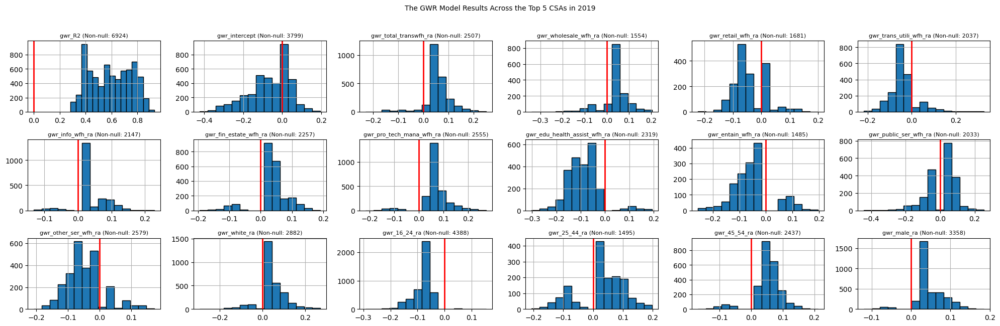

In [107]:
pair_data = csa_gwr_2019[all_columns]

# Plot histograms for all columns
axes = pair_data.hist(bins=15, figsize=(20, 12), layout=(6, 6), edgecolor='black')


for ax, column in zip(axes.flatten(), all_columns):
    non_null_count = pair_data[column].notnull().sum()
    ax.axvline(x=0, color='red', linewidth=2)

    ax.set_title(f'{column} (Non-null: {non_null_count})',fontsize=8)

plt.suptitle('The GWR Model Results Across the Top 5 CSAs in 2019', fontsize=10, y=1.01)
plt.tight_layout()  
plt.show()

#### <font color='green'>Adaptive Bandwidth for CSA for 2021</font>

In [108]:
accumulated_gwr_filtered_t = pd.DataFrame()
gwr_filtered_t = pd.DataFrame()
successful_csas = []  # List to keep track of successfully processed CSAs
failed_csas = []

# Iterate over all filtered CBSA Titles
for csa_title in top_5_names_list:
    try:
        # Determine selected CBSA
        select_csa = csa_gwr_2021[csa_gwr_2021['CSA Title'] == csa_title]
        
        # Selecting the dependent & independent variables
        y = select_csa[dependent_var].values.reshape((-1, 1))
        X = select_csa[selected_independent_vars].values
        
        # Define the coordinates
        u = select_csa['lon']
        v = select_csa['lat']
        coords = list(zip(u, v))

        # selecting the GWR Bandwidth
        gwr_selector = Sel_BW(coords, y, X, kernel='bisquare', fixed=False)   ### kernel='gaussian','bisquare','exponential'
        gwr_bw = gwr_selector.search(criterion='AIC')   ### 'AICc','AIC','BIC','CV'
        print(f'GWR bandwidth for {csa_title} =', gwr_bw)

        # fit the GWR Model
        gwr_results = GWR(coords, y, X, gwr_bw).fit()

        # Adding local R² to the selected CBSA dataframe
        select_csa['gwr_R2'] = gwr_results.localR2

        # Adding GWR coefficients to the dataframe
        for i, name in enumerate(gwr_columns):
            select_csa[name] = gwr_results.params[:, i]

        # Filtering the t-value with a significant alpha level of 0.1
        gwr_filtered_t = gwr_results.filter_tvals(alpha=0.1)
        gwr_filtered_t = pd.DataFrame(gwr_filtered_t, index=select_csa.index, columns=gwr_columns)
        gwr_filtered_t['CSA Title'] = csa_title
        accumulated_gwr_filtered_t = pd.concat([accumulated_gwr_filtered_t, gwr_filtered_t])

        # Combine results into the dataframe
        csa_gwr_2021.loc[select_csa.index, select_csa.columns] = select_csa

        # Add the successful CSA to the lis
        successful_csas.append(csa_title)

    except np.linalg.LinAlgError as e:  # Numpy error raised when there is a problem with linear algebra calculations, like a singular matrix.
        failed_csas.append(f"{csa_title} - linear algebra issue: {e}")
        continue  # Skip the rest of the loop and proceed with the next iteration.
    
    except ValueError as e:
        # This block handles value errors, such as data type mismatches or indexing problems.
        failed_csas.append(f"{csa_title} - Value error: {e}")
        continue
    
    except Exception as e:
        # This block catches all other types of exceptions.
        failed_csas.append(f"{csa_title} - Other error: {e}")
        continue

# At the end, print out the list of successful CBSAs
print("Successfully processed CSAs:")
for csa in successful_csas:
    print(csa)

print("-------------------------------------")

if failed_csas:  
    print("Failed processed CSAs:")
    for csa in failed_csas:
        print(csa)
else:
    print("No CSAs processing failed.")

print("-------------------------------------")

# check if the index of accumulated_gwr_filtered_t were included by csa_gwr_2021 index
index_check = accumulated_gwr_filtered_t.index.isin(csa_gwr_2021.index)
print(index_check.all())

print("-------------------------------------")
# check is there any duplicated index in csa_gwr_2021
segregation_duplicates = csa_gwr_2021.index.duplicated()
if segregation_duplicates.any():
    print("'csa_gwr_2021' has the duplicated index.")
else:
    print("'csa_gwr_2021' has not the duplicated index.")

# check is there any duplicated index in accumulated_gwr_filtered_t
accumulated_duplicates = accumulated_gwr_filtered_t.index.duplicated()
if accumulated_duplicates.any():
    print("'accumulated_gwr_filtered_t' has the duplicated index.")
else:
    print("'accumulated_gwr_filtered_t' has not the duplicated index.")

print("-------------------------------------")
print(f"'csa_gwr_2021' has {csa_gwr_2021['gwr_intercept'].notnull().sum()} new values.")
print(f"'accumulated_gwr_filtered_t' has {accumulated_gwr_filtered_t['gwr_intercept'].notnull().sum()} new values.")

GWR bandwidth for New York-Newark, NY-NJ-CT-PA = 76.0
GWR bandwidth for Los Angeles-Long Beach, CA = 75.0
GWR bandwidth for Washington-Baltimore-Arlington, DC-MD-VA-WV-PA = 75.0
GWR bandwidth for Chicago-Naperville, IL-IN-WI = 75.0
GWR bandwidth for San Jose-San Francisco-Oakland, CA = 297.0
Successfully processed CSAs:
New York-Newark, NY-NJ-CT-PA
Los Angeles-Long Beach, CA
Washington-Baltimore-Arlington, DC-MD-VA-WV-PA
Chicago-Naperville, IL-IN-WI
San Jose-San Francisco-Oakland, CA
-------------------------------------
No CSAs processing failed.
-------------------------------------
True
-------------------------------------
'csa_gwr_2021' has not the duplicated index.
'accumulated_gwr_filtered_t' has not the duplicated index.
-------------------------------------
'csa_gwr_2021' has 11131 new values.
'accumulated_gwr_filtered_t' has 11131 new values.


In [109]:
# reindex the accumulated_gwr_filtered_t
accumulated_gwr_filtered_t_csa = accumulated_gwr_filtered_t.reindex(csa_gwr_2021.index)

# Iterate over each column and row in accumulated_gwr_filtered_t_csa
for column in accumulated_gwr_filtered_t_csa.columns:
    for idx in accumulated_gwr_filtered_t_csa.index:
        # Check if the value in accumulated_gwr_filtered_t_csa is 0 or NAN
        if accumulated_gwr_filtered_t_csa.at[idx, column] == 0 or pd.isna(accumulated_gwr_filtered_t_csa.at[idx, column]):
            # If the value is 0, set the corresponding value in CSA_segregation_all_fixed to NaN
            csa_gwr_2021.at[idx, column] = np.nan
            
csa_gwr_2021['gwr_R2'].replace([-np.inf, np.inf], np.nan, inplace=True)
csa_gwr_2021.loc[csa_gwr_2021['gwr_R2'] < 0, 'gwr_R2'] = np.nan

all_columns = ['gwr_R2'] + gwr_columns
csa_gwr_2021[all_columns].describe()

,gwr_R2,gwr_intercept,gwr_total_transwfh_ra,gwr_wholesale_wfh_ra,gwr_retail_wfh_ra,gwr_trans_utili_wfh_ra,gwr_info_wfh_ra,gwr_fin_estate_wfh_ra,gwr_pro_tech_mana_wfh_ra,gwr_edu_health_assist_wfh_ra,gwr_entain_wfh_ra,gwr_public_ser_wfh_ra,gwr_other_ser_wfh_ra,gwr_white_ra,gwr_16_24_ra,gwr_25_44_ra,gwr_45_54_ra,gwr_male_ra
count,11131.0000,6601.0000,5236.0000,2317.0000,2648.0000,2352.0000,2771.0000,2752.0000,2973.0000,3375.0000,2677.0000,2878.0000,2758.0000,2828.0000,5545.0000,2463.0000,2468.0000,3201.0000
mean,0.7006,0.0861,0.0737,0.0270,-0.0193,-0.0311,0.0547,0.0619,0.0672,-0.0556,-0.0405,0.0288,-0.0364,0.0373,-0.0735,0.0073,0.0485,0.0529
std,0.1120,0.0802,0.0460,0.0814,0.0701,0.0717,0.0599,0.0642,0.0725,0.0866,0.0555,0.0794,0.0609,0.0684,0.0397,0.0829,0.0640,0.0393
min,0.3073,-0.3176,-0.1994,-0.2356,-0.1637,-0.3027,-0.1868,-0.1887,-0.1963,-0.2514,-0.1915,-0.2475,-0.2870,-0.2560,-0.2563,-0.2005,-0.1277,-0.1585
25%,0.6253,0.0693,0.0549,-0.0405,-0.0687,-0.0732,0.0363,0.0483,0.0478,-0.1062,-0.0726,-0.0381,-0.0721,0.0337,-0.0970,-0.0704,0.0420,0.0407
50%,0.7154,0.0970,0.0704,0.0431,-0.0432,-0.0512,0.0574,0.0726,0.0757,-0.0809,-0.0509,0.0550,-0.0543,0.0538,-0.0698,0.0380,0.0603,0.0568
75%,0.7813,0.1227,0.0914,0.0753,0.0474,0.0336,0.0904,0.0974,0.1083,-0.0480,-0.0348,0.0864,-0.0266,0.0716,-0.0526,0.0777,0.0851,0.0741
max,0.9471,0.3658,0.3866,0.8946,0.2558,0.2168,0.2163,0.2568,0.3118,0.2852,0.1249,0.2132,0.1962,0.2059,0.1248,0.1744,0.2541,0.1686


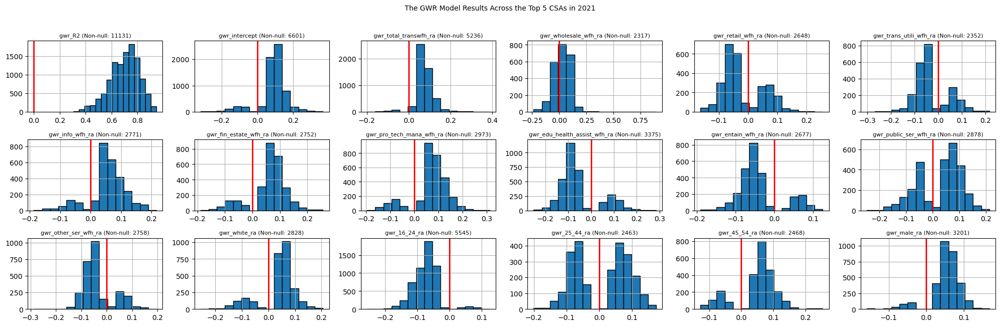

In [110]:
pair_data = csa_gwr_2021[all_columns]

# Plot histograms for all columns
axes = pair_data.hist(bins=15, figsize=(20, 12), layout=(6, 6), edgecolor='black')


for ax, column in zip(axes.flatten(), all_columns):
    non_null_count = pair_data[column].notnull().sum()
    ax.axvline(x=0, color='red', linewidth=2)

    ax.set_title(f'{column} (Non-null: {non_null_count})',fontsize=8)

plt.suptitle('The GWR Model Results Across the Top 5 CSAs in 2021', fontsize=10, y=1.01)
plt.tight_layout()  
plt.show()

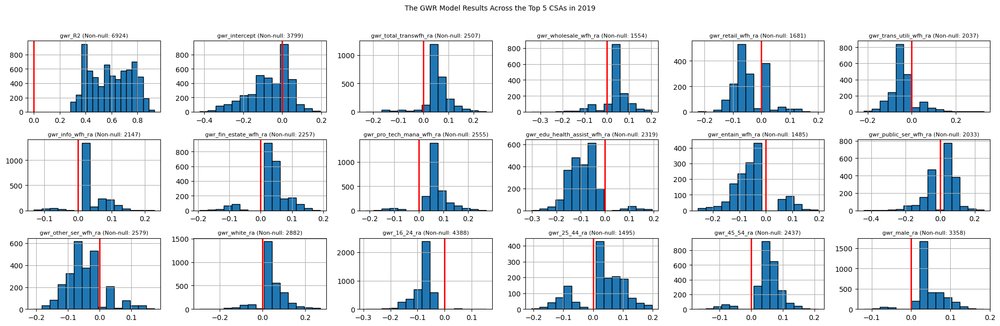

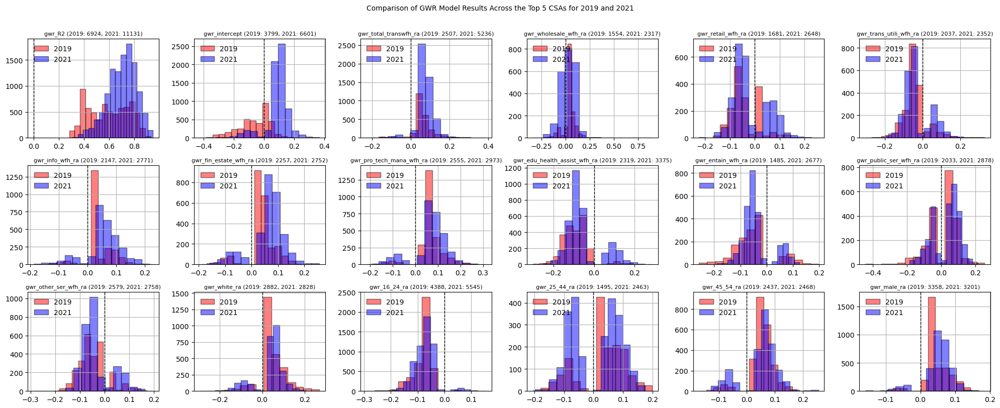

In [141]:
fig, axes = plt.subplots(nrows=3, ncols=6, figsize=(20, 8), sharex=False, sharey=False)

# Iterate over all subplots
for ax, column in zip(axes.flatten(), all_columns):
    # Plot the data for 2019 on each subplot
    csa_gwr_2019[column].hist(ax=ax, bins=15, color='red', alpha=0.5, edgecolor='black', label='2019')
    # Plot the data for 2021 on the same subplot
    csa_gwr_2021[column].hist(ax=ax, bins=15, color='blue', alpha=0.5, edgecolor='black', label='2021')

    # Add a black dashed vertical line at X=0
    ax.axvline(x=0, color='black', linestyle='dashed', linewidth=1)

    # Calculate the number of non-null values
    non_null_2019 = csa_gwr_2019[column].notnull().sum()
    non_null_2021 = csa_gwr_2021[column].notnull().sum()

    # Set the title for each subplot
    ax.set_title(f'{column} (2019: {non_null_2019}, 2021: {non_null_2021})', fontsize=8)

    # Display the legend
    ax.legend(loc='upper left', frameon=False)

# Handle extra subplots if the number of columns is less than the number of subplots
num_columns = len(all_columns)
total_axes = axes.flatten()
for i in range(num_columns, len(total_axes)):
    total_axes[i].axis('off')

# Set the overall title
plt.suptitle('Comparison of GWR Model Results Across the Top 5 CSAs for 2019 and 2021', fontsize=10, y=1.01)

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()

#### <font color='green'>Visualize the result of explantory variables' coefficient</font>

In [111]:
visulize_gwr_coef = ['gwr_total_transwfh_ra','gwr_wholesale_wfh_ra', 'gwr_retail_wfh_ra', 'gwr_trans_utili_wfh_ra','gwr_info_wfh_ra', 'gwr_fin_estate_wfh_ra', 'gwr_pro_tech_mana_wfh_ra',
                     'gwr_edu_health_assist_wfh_ra', 'gwr_entain_wfh_ra','gwr_public_ser_wfh_ra', 'gwr_other_ser_wfh_ra']

In [112]:
# from matplotlib.colors import TwoSlopeNorm
# import matplotlib.pyplot as plt

# def plot_csa_distribution(csa_gwr, top_5_names_list, visulize_gwr_coef, geodata, suptitles):

#     fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(20, 5))
#     ax = ax.flatten()

#     # 定义颜色映射的范围
#     vmin = csa_gwr[visulize_gwr_coef].min()
#     vmax = csa_gwr[visulize_gwr_coef].max()
#     norm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)

#     for index, csa in enumerate(top_5_names_list):
#         data = csa_gwr[csa_gwr['CSA Title'] == csa]
#         geodata_csa = geodata[geodata['CSA Title'] == csa]
#         # plot the boundary
#         geodata_csa.boundary.plot(color="gray", linewidth=0.1, ax=ax[index], alpha=0.5)

#         # plot significant data
#         data_nonan = data.dropna(subset=[visulize_gwr_coef])
        
#         if not data_nonan.empty:
#             plot_obj = data_nonan.plot(column=visulize_gwr_coef, cmap='seismic_r', norm=norm,
#                                        ax=ax[index], edgecolor='none', legend=True, 
#                                        legend_kwds={'shrink': 0.5, 'label': "coefficient range", 
#                                                     'orientation': "horizontal", 'pad': 0.01})
#             legend = ax[index].get_legend()
#             if legend:
#                 for text in legend.get_texts():
#                     text.set_fontsize(5)
#             ax[index].set_axis_off()
#             ax[index].set_title(csa, fontsize=10)
#         else:
#             ax[index].axis('off')

#     plt.suptitle(suptitles, fontsize=15)
#     plt.tight_layout(pad=2.0)
#     plt.subplots_adjust(top=0.85, wspace=0.1)
#     plt.show()
    
    
# visulize_gwr_coef = 'gwr_total_transwfh_ra'
# suptitles = 'The Distribution of the GWR Coefficient of Total Teleworkers Percentage  in the Top 5 Largest CSAs in 2019'

# plot_csa_distribution(csa_gwr_2019, top_5_names_list, visulize_gwr_coef, tracts_top5_csa_2019, suptitles)

In [113]:
from matplotlib.colors import TwoSlopeNorm

def plot_csa_distribution(csa_gwr_2019, csa_gwr_2021, top_5_names_list, visulize_gwr_coef, geodata_2019, geodata_2021, big_title):
    nrows, ncols = 2, 5
    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 10))
    
    vmin = min(csa_gwr_2019[visulize_gwr_coef].min(), csa_gwr_2021[visulize_gwr_coef].min())
    vmax = max(csa_gwr_2019[visulize_gwr_coef].max(), csa_gwr_2021[visulize_gwr_coef].max())
    norm = TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)

    for row, (csa_gwr, geodata) in enumerate([(csa_gwr_2019, geodata_2019), (csa_gwr_2021, geodata_2021)]):
        for col, csa in enumerate(top_5_names_list):
            ax = axs[row, col]
            data = csa_gwr[csa_gwr['CSA Title'] == csa]
            geodata_csa = geodata[geodata['CSA Title'] == csa]

            geodata_csa.boundary.plot(color="gray", linewidth=0.1, ax=ax, alpha=0.5)

            data_nonan = data.dropna(subset=[visulize_gwr_coef])
            if not data_nonan.empty:
                data_nonan.plot(column=visulize_gwr_coef, cmap='seismic_r', norm=norm,
                                ax=ax, edgecolor='none', legend=True, 
                                legend_kwds={'shrink': 0.5, 'label': "coefficient range", 
                                             'orientation': "horizontal", 'pad': 0.01})
                legend = ax.get_legend()
                if legend:
                    for text in legend.get_texts():
                        text.set_fontsize(5)
                ax.set_title(csa, fontsize=10)
            else:
                ax.axis('off')
                
            ax.set_axis_off()
    
    plt.suptitle(big_title, fontsize=15)
    # plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.tight_layout()
    plt.subplots_adjust(top=0.85, hspace=0.3, wspace=0.1)
    plt.figtext(0.5, 0.92, "2019", ha="center", fontsize=12)
    plt.figtext(0.5, 0.45, "2021", ha="center", fontsize=12)
    plt.show()

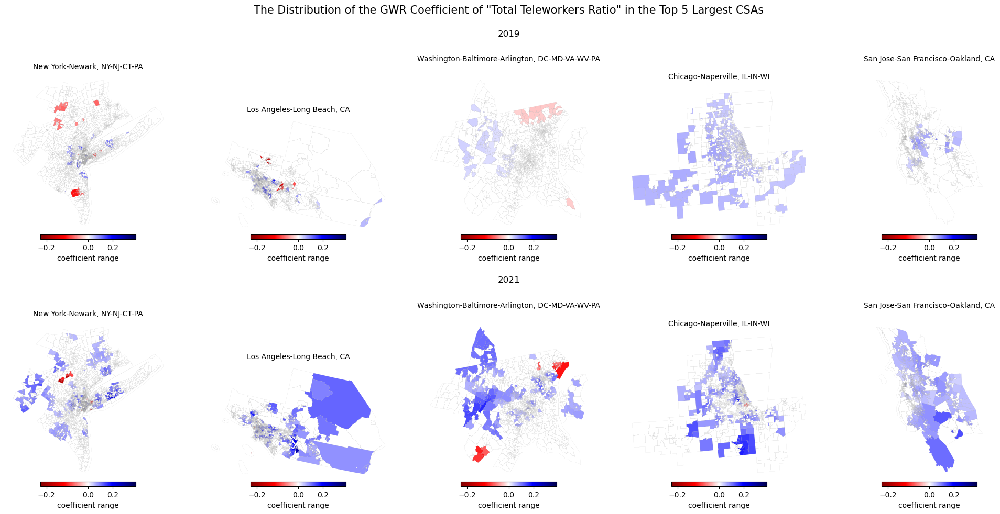

In [114]:
big_title = 'The Distribution of the GWR Coefficient of "Total Teleworkers Ratio" in the Top 5 Largest CSAs'
visulize_gwr_coef = 'gwr_total_transwfh_ra'

plot_csa_distribution(csa_gwr_2019, csa_gwr_2021, top_5_names_list, visulize_gwr_coef, tracts_top5_csa_2019, tracts_top5_csa_2021, big_title)

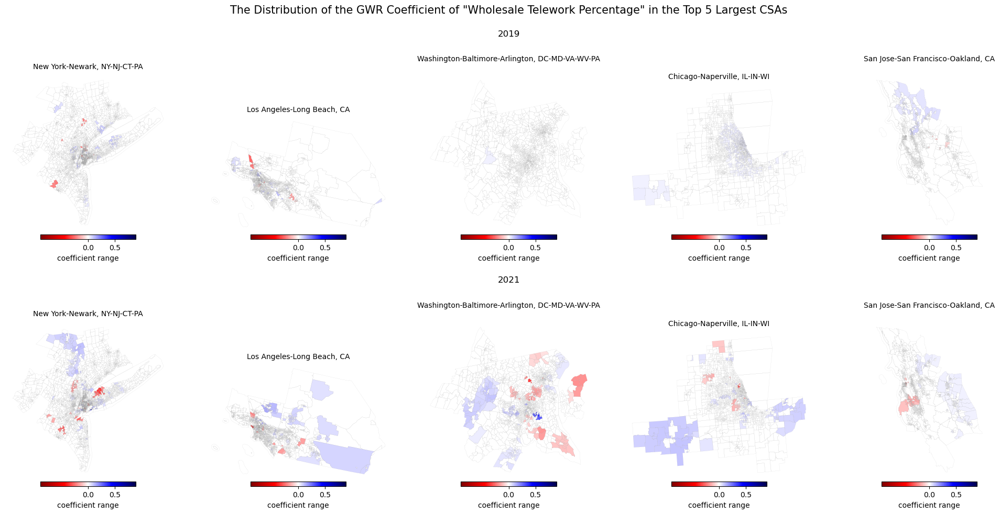

In [115]:
big_title = 'The Distribution of the GWR Coefficient of "Wholesale Telework Percentage" in the Top 5 Largest CSAs'
visulize_gwr_coef = 'gwr_wholesale_wfh_ra'

plot_csa_distribution(csa_gwr_2019, csa_gwr_2021, top_5_names_list, visulize_gwr_coef, tracts_top5_csa_2019, tracts_top5_csa_2021, big_title)

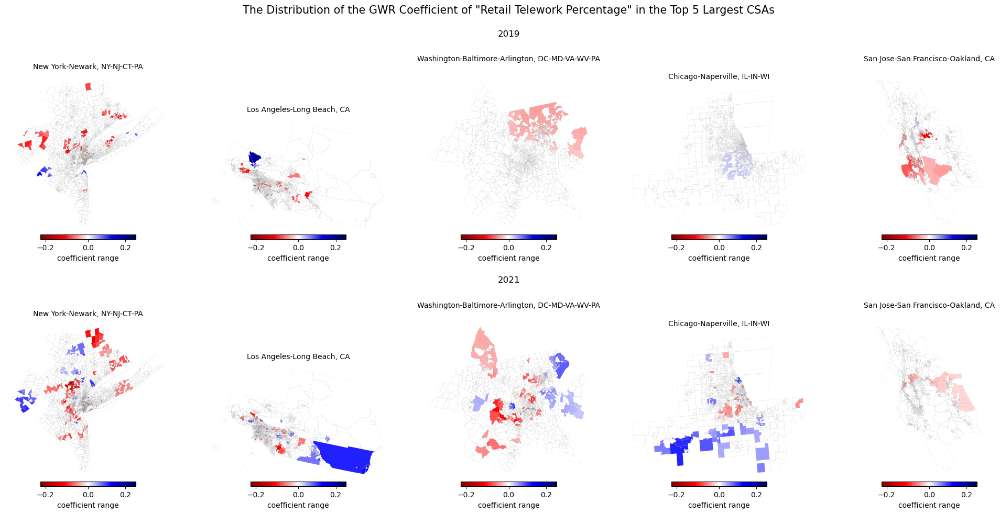

In [116]:
big_title = 'The Distribution of the GWR Coefficient of "Retail Telework Percentage" in the Top 5 Largest CSAs'
visulize_gwr_coef = 'gwr_retail_wfh_ra'

plot_csa_distribution(csa_gwr_2019, csa_gwr_2021, top_5_names_list, visulize_gwr_coef, tracts_top5_csa_2019, tracts_top5_csa_2021, big_title)

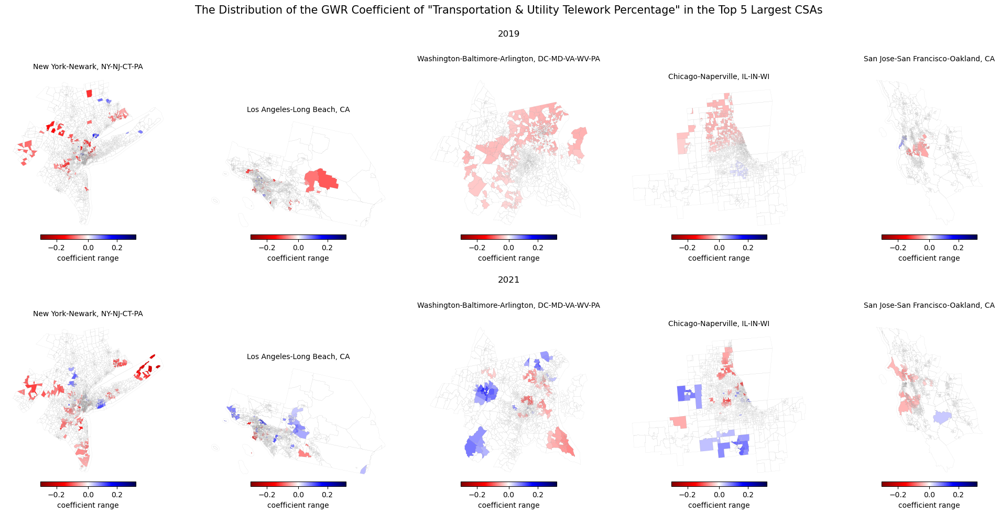

In [117]:
big_title = 'The Distribution of the GWR Coefficient of "Transportation & Utility Telework Percentage" in the Top 5 Largest CSAs'
visulize_gwr_coef = 'gwr_trans_utili_wfh_ra'

plot_csa_distribution(csa_gwr_2019, csa_gwr_2021, top_5_names_list, visulize_gwr_coef, tracts_top5_csa_2019, tracts_top5_csa_2021, big_title)

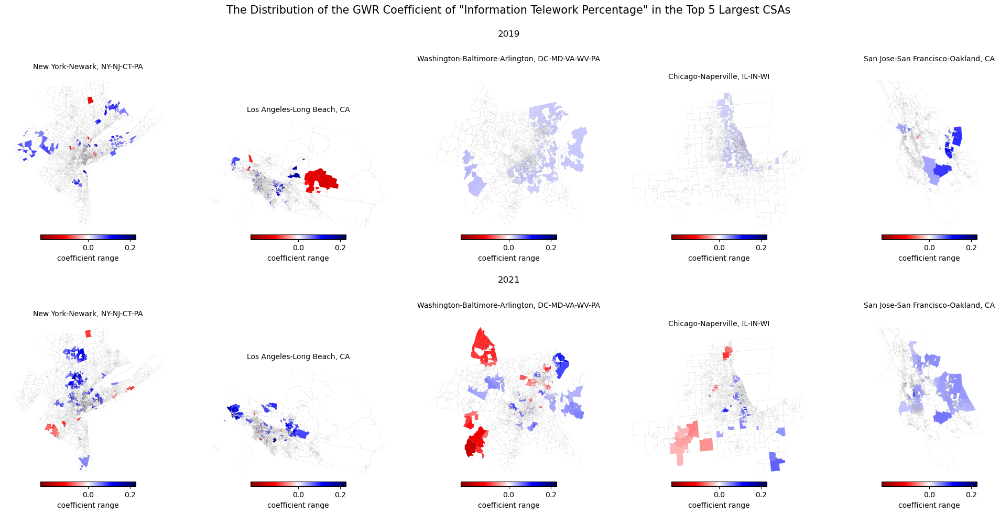

In [118]:
big_title = 'The Distribution of the GWR Coefficient of "Information Telework Percentage" in the Top 5 Largest CSAs'
visulize_gwr_coef = 'gwr_info_wfh_ra'

plot_csa_distribution(csa_gwr_2019, csa_gwr_2021, top_5_names_list, visulize_gwr_coef, tracts_top5_csa_2019, tracts_top5_csa_2021, big_title)

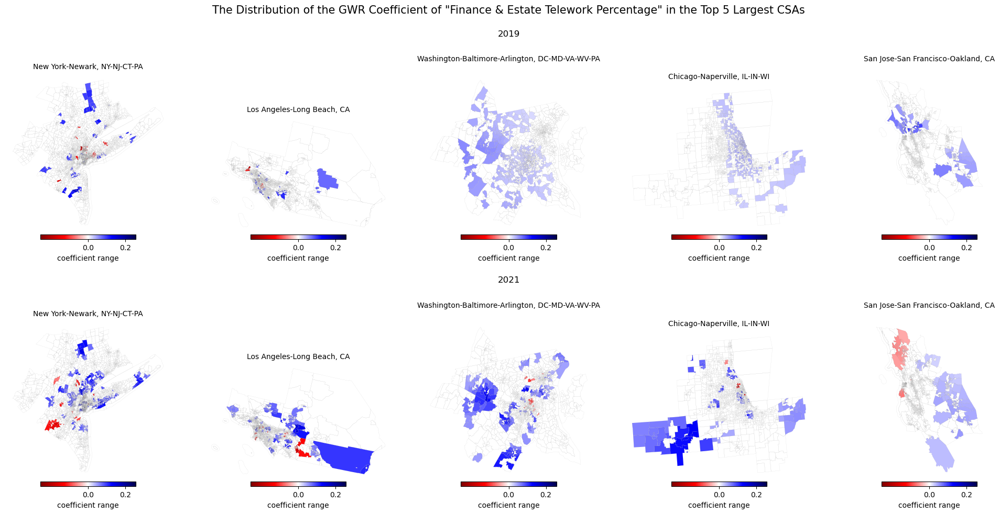

In [119]:
big_title = 'The Distribution of the GWR Coefficient of "Finance & Estate Telework Percentage" in the Top 5 Largest CSAs'
visulize_gwr_coef = 'gwr_fin_estate_wfh_ra'

plot_csa_distribution(csa_gwr_2019, csa_gwr_2021, top_5_names_list, visulize_gwr_coef, tracts_top5_csa_2019, tracts_top5_csa_2021, big_title)

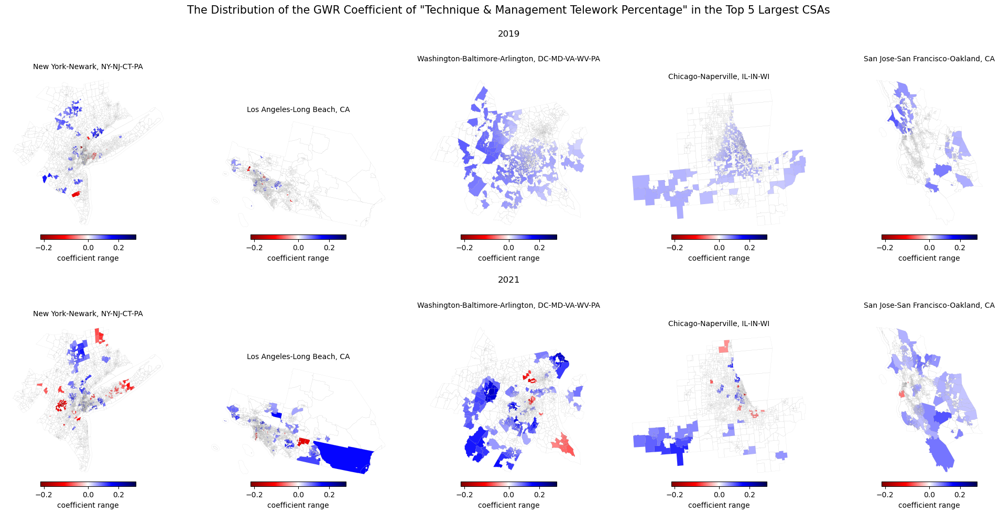

In [120]:
big_title = 'The Distribution of the GWR Coefficient of "Technique & Management Telework Percentage" in the Top 5 Largest CSAs'
visulize_gwr_coef = 'gwr_pro_tech_mana_wfh_ra'

plot_csa_distribution(csa_gwr_2019, csa_gwr_2021, top_5_names_list, visulize_gwr_coef, tracts_top5_csa_2019, tracts_top5_csa_2021, big_title)

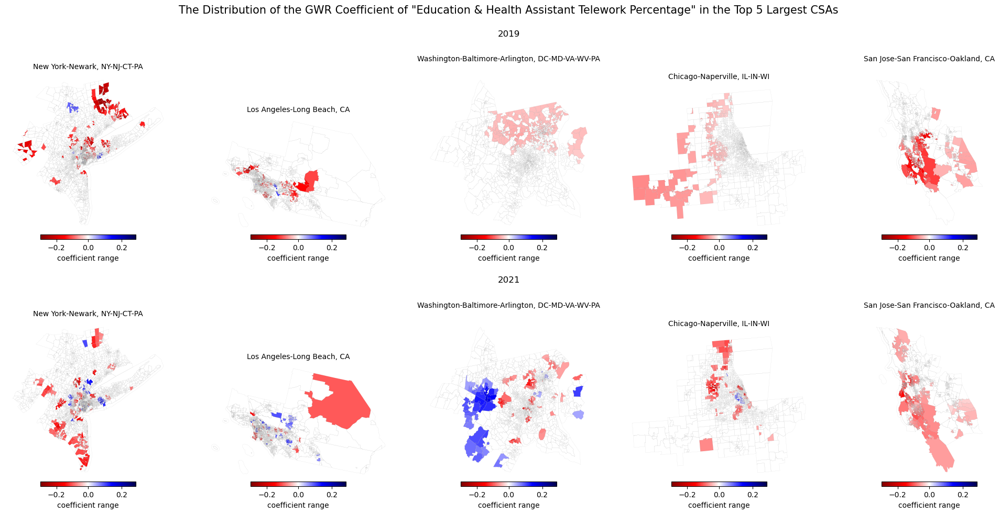

In [121]:
big_title = 'The Distribution of the GWR Coefficient of "Education & Health Assistant Telework Percentage" in the Top 5 Largest CSAs'
visulize_gwr_coef = 'gwr_edu_health_assist_wfh_ra'

plot_csa_distribution(csa_gwr_2019, csa_gwr_2021, top_5_names_list, visulize_gwr_coef, tracts_top5_csa_2019, tracts_top5_csa_2021, big_title)

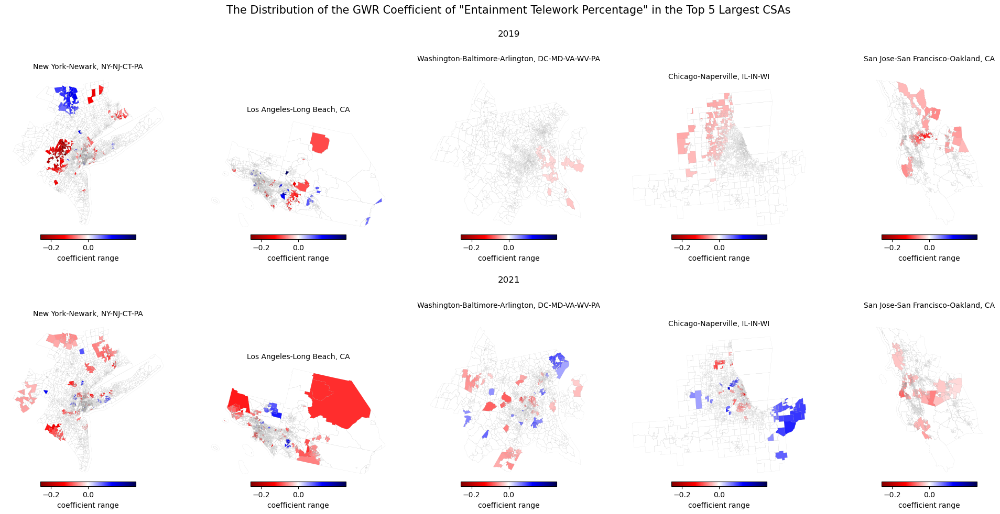

In [122]:
big_title = 'The Distribution of the GWR Coefficient of "Entainment Telework Percentage" in the Top 5 Largest CSAs'
visulize_gwr_coef = 'gwr_entain_wfh_ra'

plot_csa_distribution(csa_gwr_2019, csa_gwr_2021, top_5_names_list, visulize_gwr_coef, tracts_top5_csa_2019, tracts_top5_csa_2021, big_title)

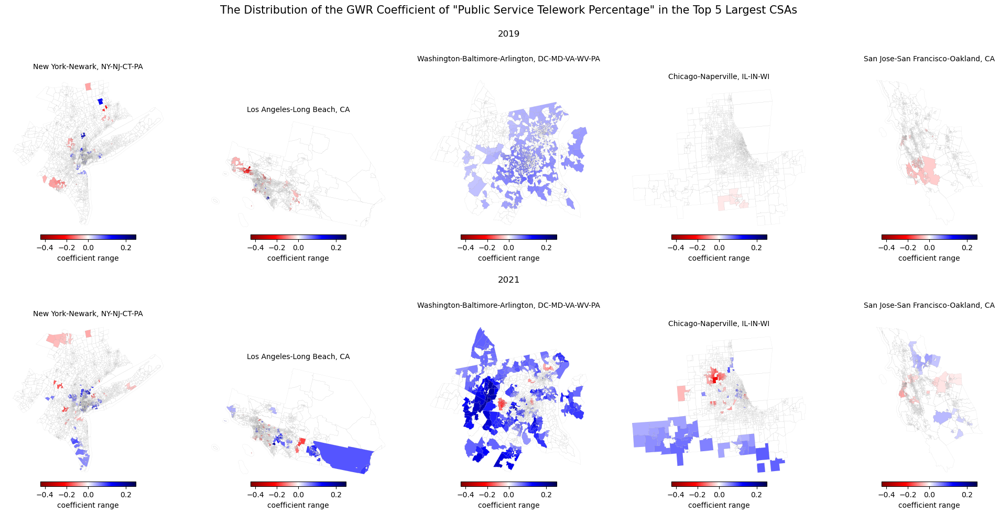

In [123]:
big_title = 'The Distribution of the GWR Coefficient of "Public Service Telework Percentage" in the Top 5 Largest CSAs'
visulize_gwr_coef = 'gwr_public_ser_wfh_ra'

plot_csa_distribution(csa_gwr_2019, csa_gwr_2021, top_5_names_list, visulize_gwr_coef, tracts_top5_csa_2019, tracts_top5_csa_2021, big_title)

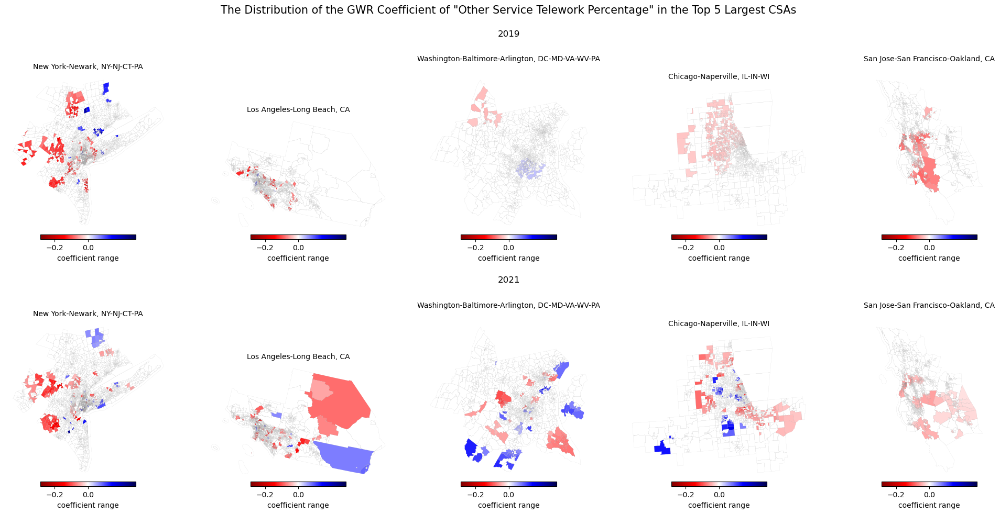

In [124]:
big_title = 'The Distribution of the GWR Coefficient of "Other Service Telework Percentage" in the Top 5 Largest CSAs'
visulize_gwr_coef = 'gwr_other_ser_wfh_ra'

plot_csa_distribution(csa_gwr_2019, csa_gwr_2021, top_5_names_list, visulize_gwr_coef, tracts_top5_csa_2019, tracts_top5_csa_2021, big_title)